In [1]:
import os
print(os.getcwd());os.chdir('/data01/ch6845/MarcoPolo_revision/')
print(os.getcwd())

/data01/ch6845/MarcoPolo_revision/experiments
/data01/ch6845/MarcoPolo_revision


In [2]:
import numpy as np
import pandas as pd

from scipy.io import mmread

import seaborn as sns

from sklearn.metrics import roc_auc_score, precision_recall_fscore_support
from sklearn import metrics
from sklearn.metrics.cluster import adjusted_rand_score

In [3]:
from matplotlib import font_manager

def font_prop(bold=False,**kwargs):
    if bold==True:
        path='/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/arialbd.ttf'
    else:
        path='/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/arial.ttf'
    fontproperties=font_manager.FontProperties(fname=path,
                                                   **kwargs)
    return fontproperties

In [4]:
import matplotlib.pyplot as plt
from matplotlib import font_manager
from matplotlib import colors
from cycler import cycler

# specify the custom font to use
#https://www.freefontspro.com/14454/arial.ttf
#/home/ch6845/tools/miniconda3/envs/pytorch/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'Arial'
#https://color.adobe.com/ko/create/image

plt.rcParams["font.size"] = 18

font_fname = '/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/arial.ttf'
font_family = font_manager.FontProperties(fname=font_fname).get_name()

print(font_family)
#https://matplotlib.org/users/dflt_style_changes.html
color_seq_2_grey=['#999999',
                '#4D4D4D']
color_seq_2_pink=['#F5C2A7',
                '#F53345']

color_qual_2=['#0DD9C4','#F27E63']
"""
color_qual_5=['#F26D6D'
            '#83A603',
            '#04BFBF',
            '#8659B3',
            '#BD8A44']
"""
color_qual_6=['#F53345',
            '#87D303',
            '#04CBCC',
            '#8650CD',
            '#F5A637',              
            '#DBD783']


color_qual_7=['#F53345',
            '#87D303',
            '#04CBCC',
            '#8650CD',
            (160/256, 95/256, 0),
            '#F5A637',              
            '#DBD783',
            
             ]

color_qual_7_3=['#F53345',
            '#87D303',
            '#04CBCC',
            '#8650CD',
                
            (160/256, 95/256, 0),
            '#F5A637',              
            '#DBD783',
                
                '#a17a3d',
                '#e3ae5f',
                '#f0eecc',
            
             ]


#

color_qual_3=['#F7766F',
             '#05BC39',
             '#609FFC']
color_qual_3=[np.array(colors.to_rgb(c)) for c in color_qual_3]
color_qual_3_two=[color_qual_3[0],1.2*color_qual_3[0],
                  color_qual_3[1],1.2*color_qual_3[1],
                  color_qual_3[2],1.2*color_qual_3[1]]
color_qual_3_two=np.clip(color_qual_3_two,a_max=1,a_min=0)

plt.rcParams['legend.fancybox'] = False
plt.rcParams['legend.edgecolor']='1.0'
plt.rcParams['legend.framealpha']=0

Arial


In [5]:
plt.rcParams

RcParams({'_internal.classic_mode': False,
          'agg.path.chunksize': 0,
          'animation.avconv_args': [],
          'animation.avconv_path': 'avconv',
          'animation.bitrate': -1,
          'animation.codec': 'h264',
          'animation.convert_args': [],
          'animation.convert_path': 'convert',
          'animation.embed_limit': 20.0,
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.html_args': [],
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'data',
          'axes.axisbelow': 'line',
          'axes.edgecolor': 'black',
          'axes.facecolor': 'white',
          'axes.formatter.limits': [-5, 6],
          'axes.formatter.min_exponent': 0,
          'axes.formatter.offset_threshold': 4,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_mathtext': False,
          'axes.f

In [6]:
dataset_name_all=[
'Kohinbulk_filtered',
'HumanLiver_filtered',
'Zhengmix8eq_filtered'  
]

dataset_name_all=dataset_name_all+["TabulaAorta_filtered",
"TabulaBladder_filtered",
"TabulaBrainMyeloid_filtered",
"TabulaBrainNonMyeloid_filtered",
"TabulaDiaphragm_filtered",
"TabulaFat_filtered",
"TabulaHeart_filtered",
"TabulaKidney_filtered",
"TabulaLargeIntestine_filtered",
"TabulaLimbMuscle_filtered",
"TabulaLiver_filtered",
"TabulaLung_filtered",
"TabulaMammaryGland_filtered",
"TabulaMarrow_filtered",
"TabulaPancreas_filtered",
"TabulaSkin_filtered",
"TabulaSpleen_filtered",
"TabulaThymus_filtered",
"TabulaTongue_filtered",
"TabulaTrachea_filtered"]

for dataset_name in dataset_name_all:
    print('{} (https://ch6845.github.io/MarcoPolo/{}/index.html)'.format(dataset_name.replace('Tabula','').replace('_filtered',''),dataset_name.replace('_filtered','')))

Kohinbulk (https://ch6845.github.io/MarcoPolo/Kohinbulk/index.html)
HumanLiver (https://ch6845.github.io/MarcoPolo/HumanLiver/index.html)
Zhengmix8eq (https://ch6845.github.io/MarcoPolo/Zhengmix8eq/index.html)
Aorta (https://ch6845.github.io/MarcoPolo/TabulaAorta/index.html)
Bladder (https://ch6845.github.io/MarcoPolo/TabulaBladder/index.html)
BrainMyeloid (https://ch6845.github.io/MarcoPolo/TabulaBrainMyeloid/index.html)
BrainNonMyeloid (https://ch6845.github.io/MarcoPolo/TabulaBrainNonMyeloid/index.html)
Diaphragm (https://ch6845.github.io/MarcoPolo/TabulaDiaphragm/index.html)
Fat (https://ch6845.github.io/MarcoPolo/TabulaFat/index.html)
Heart (https://ch6845.github.io/MarcoPolo/TabulaHeart/index.html)
Kidney (https://ch6845.github.io/MarcoPolo/TabulaKidney/index.html)
LargeIntestine (https://ch6845.github.io/MarcoPolo/TabulaLargeIntestine/index.html)
LimbMuscle (https://ch6845.github.io/MarcoPolo/TabulaLimbMuscle/index.html)
Liver (https://ch6845.github.io/MarcoPolo/TabulaLiver/inde

In [7]:
def dataset_name_mapper(dataset_name,mode='full'):
    if mode=='full':
        if 'Tabula' in dataset_name:
            organ=dataset_name.replace('Tabula','').replace('_filtered','')
            
            organ=organ.replace('BrainMyeloid','Brain Myeloid').\
            replace('BrainNonMyeloid','Brain Non-Myeloid').\
            replace('LargeIntestine','Large Intestine').\
            replace('LimbMuscle','Limb Muscle').\
            replace('MammaryGland','Mammary Gland')       
            
            return '{} (Tabula Muris)'.format(organ)    
        elif 'Koh' in dataset_name:
            return 'hESC (Koh et al.)'
        elif 'Liver' in dataset_name:
            return 'Liver (MacParland et al.)'
        elif 'Zheng' in dataset_name:
            return 'PBMC (Zheng et al.)'
        else:
            return dataset_name
    elif mode=='short':
        if 'Tabula' in dataset_name:
            organ=dataset_name.replace('Tabula','').replace('_filtered','')
            
            organ=organ.replace('BrainMyeloid','Brain Myeloid').\
            replace('BrainNonMyeloid','Brain Non-Myeloid').\
            replace('LargeIntestine','Large Intestine').\
            replace('LimbMuscle','Limb Muscle').\
            replace('MammaryGland','Mammary Gland')              
        
            return '{} (Tabula)'.format(organ)    
        elif 'Koh' in dataset_name:
            return 'hESC'
        elif 'Liver' in dataset_name:
            return 'Liver'
        elif 'Zheng' in dataset_name:
            return 'PBMC'
        else:
            return dataset_name   
    else:
        raise
        
dataset_name_mapper(dataset_name_all[-1])

'Trachea (Tabula Muris)'

In [8]:
def celltype_mapper(celltype,short=False):
    celltype_dict={
    'b.cells':'B cells',
    'regulatory.t':'Regulatory T cells',
    'memory.t':'Memory T cells',
    'naive.cytotoxic':'Naive cytotoxic',
    'cd4.t.helper':'Helper T cells',    
    'naive.t':'Naive T cells',    
    'cd14.monocytes':'Monocytes',    
    'cd56.nk':'NK cells',
                   
    'hESC':'hESC',
    'APS':'Ant. primitive streak',
    'MPS':'Mid. primitive streak',
    'DLL1pPXM':'Paraxial mesoderm',
    'ESMT':'Early somite',
    'Sclrtm':'Sclerotome',                   
    'D5CntrlDrmmtm':'Central dermomyotome',
    'D2LtM':'Lateral mesoderm',  
        
    'LSECs':'LSECs',
    'Cholangiocytes':'Cholangiocytes',        
    'Macrophages':'Macrophages',        
    'ab T cells':'αβ T cells',        
    'NK cells':'NK cells',        
    'gd T cells':'γδ T cells',        
    'Hepatocytes':'Hepatocytes',        
    'Mature B cells':'Mature B cells',        
    'Hepatic Stellate Cells':'Hepatic stellate cells',        
    'Plasma cells':'Plasma cells',                
    'Erythroid cells':'Erythroid cells',  
        
    'pancreatic A cell':'α cells',
    'type B pancreatic cell':'β cells',
    'leukocyte':'Leukocytes',
    'pancreatic acinar cell':'Acinar cells',
    'pancreatic PP cell':'PP cells',
    'pancreatic ductal cell':'Ductal cells',
    'endothelial cell':'Endothelial cells',
    'pancreatic D cell':'δ cells',
    'pancreatic stellate cell':'Pancreatic stellate cells', 
            
    'fibroblast':'Fibroblasts',
    'myofibroblast cell':'Myofibroblast cells',
    'endocardial cell':'Endocardial cells',
    'cardiac muscle cell':'Cardiac muscle cells',
    'smooth muscle cell':'Smooth muscle cells',
        
    'T cell':'T cells',
    'natural killer cell':'NK cells',
        
    'stromal cell':'Stromal cells',
    'myeloid cell':'Myeloid cells',
    'monocyte':'Monocytes',      
    'classical monocyte':'Classical monocytes',      
    'epithelial cell of lung':'Epithelial cells',
    'lung endothelial cell':'Endothelial cells',
    'ciliated columnar cell of tracheobronchial tree':'Ciliated columnar cells',
        
        
}
    celltype_dict_short={
    'b.cells':'B cells',
    'regulatory.t':'Regulatory T cells',
    'memory.t':'Memory T cells',
    'naive.cytotoxic':'Naive cytotoxic',
    'cd4.t.helper':'Helper T cells',    
    'naive.t':'Naive T cells',    
    'cd14.monocytes':'Monocytes',    
    'cd56.nk':'NK cells',
                   
    'hESC':'hESC',
    'APS':'APS',
    'MPS':'MPS',
    'DLL1pPXM':'Paraxial mesoderm',
    'ESMT':'Early somite',
    'Sclrtm':'Sclerotome',                   
    'D5CntrlDrmmtm':'Central dermomyotome',
    'D2LtM':'Lateral mesoderm',  
        
    'LSECs':'LSECs',
    'Cholangiocytes':'Cholangiocytes',        
    'Macrophages':'Macrophages',        
    'ab T cells':'αβ T cells',        
    'NK cells':'NK cells',        
    'gd T cells':'γδ T cells',        
    'Hepatocytes':'Hepatocytes',        
    'Mature B cells':'Mature B cells',        
    'Hepatic Stellate Cells':'Hepatic stellate cells',        
    'Plasma cells':'Plasma cells',                
    'Erythroid cells':'Erythroid cells', 
        
    'pancreatic A cell':'α cells',
    'type B pancreatic cell':'β cells',
    'leukocyte':'Leukocytes',
    'pancreatic acinar cell':'Acinar cells',
    'pancreatic PP cell':'PP cells',
    'pancreatic ductal cell':'Ductal cells',
    'endothelial cell':'Endothelial cells',
    'pancreatic D cell':'δ cells',
    'pancreatic stellate cell':'PaSC',   
        
    'fibroblast':'Fibroblasts',
    'myofibroblast cell':'Myofibroblast cells',
    'endocardial cell':'Endocardial cells',
    'cardiac muscle cell':'Cardiac muscle cells',
    'smooth muscle cell':'Smooth muscle cells',
        
    'T cell':'T cells',
    'natural killer cell':'NK cells',       
        
        
    'stromal cell':'Stromal cells',
    'myeloid cell':'Myeloid cells',
    'monocyte':'Monocytes',      
    'classical monocyte':'Classical monocytes',      
    'epithelial cell of lung':'Epithelial cells',
    'lung endothelial cell':'Endothelial cells',
    'ciliated columnar cell of tracheobronchial tree':'Ciliated columnar cells'
        
        
}    
    if short:
        if celltype in celltype_dict_short.keys():
            return celltype_dict_short[celltype]
        else:
            try:
                return celltype[0].upper()+celltype[1:]
            except:
                return celltype
    else:
        if celltype in celltype_dict.keys():
            return celltype_dict[celltype]
        else:
            try:
                return celltype[0].upper()+celltype[1:]
            except:
                return celltype        
        
#celltype_mapper(exp_data_meta_transformed_sub['phenoid'][0],True)  

In [9]:
def method_mapper(method):
    if method=='MarcoPolo':
        return 'MarcoPolo'
    if method=='vst':
        return 'HVG (VST)'
    elif method=='disp':
        return 'HVG (DISP)'
    elif 'seurat' in method:
        if method.split(',')[2]=='with_filter':        
            if '0_5' in method:
                return 'Clustering+DE (0.5, default)'
            elif '1_0' in method:
                return 'Clustering+DE (1.0, default)'
            elif '1_5' in method:
                return 'Clustering+DE (1.5, default)'        
            else:
                raise RuntimeError(method)
        elif method.split(',')[2]=='without_filter':        
            if '0_5' in method:
                return 'Clustering+DE (0.5, no filter)'
            elif '1_0' in method:
                return 'Clustering+DE (1.0, no filter)'
            elif '1_5' in method:
                return 'Clustering+DE (1.5, no filter)'        
            else:
                raise RuntimeError(method)
        else:
            raise

    elif 'ht' in method:
        if 'tsne' in method:
            return 'scHaystack (tSNE)'
        if 'pca' in method:
            return 'scHaystack'
        else:
            raise RuntimeError(method)        
    else:
        raise RuntimeError(method)

In [10]:
def load_deg(dataset_name='HumanLiver_filtered',res_str='0_5',lfc_filter=True):
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    if lfc_filter==True:
        deg_result=pd.read_csv('datasets/extract/{}.clustering.{}.deg.tsv'.format(dataset_name,res_str),sep='\t',index_col=0)
    else:
        deg_result=pd.read_csv('datasets/extract/{}.clustering.{}.deg.all.tsv'.format(dataset_name,res_str),sep='\t',index_col=0)

    deg_result['avg_logFC_abs']=-np.abs(deg_result['avg_logFC'])
    
    deg_result_sorted=deg_result.sort_values(['p_val','avg_logFC_abs'])
    
    top_gene=deg_result_sorted['gene'].astype(str).values
    _,idx=np.unique(top_gene,return_index=True)
    top_gene_unique=top_gene[np.sort(idx)]
    
    #print(top_gene_unique,exp_data_row)
    
    assert set(top_gene_unique).issubset(exp_data_row)  
    
    return top_gene_unique

In [11]:
def load_score(dataset_name,method='MarcoPolo'):
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    if method=='MarcoPolo':
        allscore=pd.read_csv('datasets/extract/{}.MarcoPolo.{}.rank.tsv'.format(dataset_name,2),sep='\t',index_col=0)
        #print(allscore)
        score=-allscore['MarcoPolo_rank'].values
        
    elif method in ['vst','mvp','disp','ht.tsne','ht.pca']:
        hvg_result=pd.read_csv('datasets/extract/{}.hvg.{}.tsv'.format(dataset_name,method),sep='\t',index_col=0)
        hvg_result.index=hvg_result.index.astype(str)
        
        if hvg_result.shape[1]==0:
            #print(method,'no sorting')
            pass
        elif hvg_result.shape[1]==1:
            #print(method,'sorting x')
            hvg_result=hvg_result.sort_values(by='x',ascending=False)
        else:
            #print(method,'no sorting')
            pass
        score=-np.array(list(map(lambda x: hvg_result.index.tolist().index(x) if x in hvg_result.index else len(hvg_result.index), exp_data_row)))

    elif 'seurat' in method:
        resolution=method.split(',')[1]
        
        if method.split(',')[2]=='with_filter':
            lfc_filter=True
        elif method.split(',')[2]=='without_filter':
            lfc_filter=False
        else:
            raise

        deg_result=load_deg(dataset_name=dataset_name,res_str=resolution,lfc_filter=lfc_filter)
        score=-np.array(list(map(lambda x: deg_result.tolist().index(x) if x in deg_result else len(deg_result), exp_data_row)))        
        
        #seurat_maxdiff=pd.read_csv('datasets/extract/{}.clustering.{}.label.maxdiff.tsv'.format(dataset_name,resolution),sep='\t',header=None)
        #seurat_markerrho=exp_data_pertype_onehot.astype(int)[marker_maxdiff].to_csv('datasets/extract/{}.clusterlabel.{}.markerrho.tsv'.format(dataset_name,resolution),sep='\t')
        #print(seurat_maxdiff)
        #score=seurat_maxdiff[1].values
    else:
        raise
    
    assert len(exp_data_row)==len(score)   
    return score

# DB matching

In [12]:
gene_info_human=pd.read_csv('datasets/Homo_sapiens.gene_info.gz',sep='\t')
print(len(gene_info_human))
gene_info_human['ensembl']=gene_info_human['dbXrefs'].map(lambda x: x.split('|')[-1].split(':')[-1])
gene_info_human=gene_info_human[gene_info_human['ensembl'].str.contains('ENSG')]
print(len(gene_info_human))

gene_info_mouse=pd.read_csv('datasets/Mus_musculus.gene_info.gz',sep='\t')
print(len(gene_info_mouse))
gene_info_mouse['ensembl']=gene_info_mouse['dbXrefs'].map(lambda x: x.split('|')[-1].split(':')[-1])
gene_info_mouse=gene_info_mouse[gene_info_mouse['ensembl'].str.contains('ENSMUSG')]
print(len(gene_info_mouse))     

def to_geneid(symbol,species='human',original_form='ensembl'):
    if species=='human':
        gene_info=gene_info_human
    elif species=='mouse':
        gene_info=gene_info_mouse
    
    if original_form=='ensemble':
        #gene_info['']
        pass
    elif original_form=='symbol':
        gene_info_select1=gene_info[gene_info['Symbol'].str.lower()==symbol.lower()]
        if len(gene_info_select1)==1:
            return gene_info_select1['ensembl'].iloc[0]
        elif len(gene_info_select1)==0:
            gene_info_select2=gene_info[(gene_info['Synonyms'].map(lambda x: symbol.lower() in [i.lower() for i in x.split('|')]))]
            if len(gene_info_select2)==1:
                return gene_info_select2['ensembl'].iloc[0]            
            else:
                pass
        else:
            pass
        
        return symbol            

62198
32764
73138
31449


In [13]:
cellmarker_db=pd.read_csv('datasets/all_cell_markers.txt',sep='\t')

cellmarker_db_human=cellmarker_db[cellmarker_db['speciesType']=='Human']
cellmarker_db_human['geneSymbol_cleaned']=cellmarker_db_human['geneSymbol'].map(lambda x: x.replace(' ','').replace('[','').replace(']','').split(',') if type(x)==str else '')
cellmarker_db_human['ensembl_cleaned']=cellmarker_db_human['geneSymbol_cleaned'].map(lambda x: [to_geneid(i,species='human',original_form='symbol') for i in x])

cellmarker_db_mouse=cellmarker_db[cellmarker_db['speciesType']=='Mouse']
cellmarker_db_mouse['geneSymbol_cleaned']=cellmarker_db_mouse['geneSymbol'].map(lambda x: x.replace(' ','').replace('[','').replace(']','').split(',') if type(x)==str else '')
cellmarker_db_mouse['ensembl_cleaned']=cellmarker_db_mouse['geneSymbol_cleaned'].map(lambda x: [to_geneid(i,species='mouse',original_form='symbol') for i in x])

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

In [14]:
cellmarker_db_mouse[cellmarker_db_mouse['tissueType'].str.lower().str.contains('bladder')]

,speciesType,tissueType,UberonOntologyID,cancerType,cellType,cellName,CellOntologyID,cellMarker,geneSymbol,geneID,proteinName,proteinID,markerResource,PMID,Company,geneSymbol_cleaned,ensembl_cleaned
3002,Mouse,Bladder,NaN,Normal,Normal cell,Endothelial cell,CL_0000115,CD31,Pecam1,18613,PECA1,Q08481,Experiment,25689100,NaN,[Pecam1],[ENSMUSG00000020717]


In [15]:
cellmarker_db_human_symbol_count=pd.Series([j.lower() for i in cellmarker_db_human['geneSymbol_cleaned'] for j in i]).value_counts()
cellmarker_db_human_symbol_count=cellmarker_db_human_symbol_count.iloc[1:]

cellmarker_db_human_ensembl_count=pd.Series([j.lower() for i in cellmarker_db_human['ensembl_cleaned'] for j in i]).value_counts()
cellmarker_db_human_ensembl_count=cellmarker_db_human_ensembl_count

In [16]:
cellmarker_db_mouse_symbol_count=pd.Series([j.lower() for i in cellmarker_db_mouse['geneSymbol_cleaned'] for j in i]).value_counts()
cellmarker_db_mouse_symbol_count=cellmarker_db_mouse_symbol_count.iloc[1:]

cellmarker_db_mouse_ensembl_count=pd.Series([j.lower() for i in cellmarker_db_mouse['ensembl_cleaned'] for j in i]).value_counts()
cellmarker_db_mouse_ensembl_count=cellmarker_db_mouse_ensembl_count

In [17]:
cellmarker_db_human_symbol_count

cd44        388
prom1       341
cd34        247
ptprc       230
thy1        228
           ... 
slc43a3       1
tmem170b      1
tfam          1
znf322        1
              1
Length: 11539, dtype: int64

In [18]:
panglao_db=pd.read_csv('datasets/PanglaoDB_markers_27_Mar_2020.tsv.gz',sep='\t')
panglao_db['gene_symbol_all']=panglao_db['official gene symbol']#+'|'+panglao_db['nicknames']

panglao_db_human=panglao_db[panglao_db['species'].str.contains('Hs')]
panglao_db_human['geneSymbol_cleaned']=panglao_db_human['gene_symbol_all'].map(lambda x: x.replace(' ','').replace('[','').replace(']','').split('|') if type(x)==str else '')
panglao_db_human['ensembl_cleaned']=panglao_db_human['geneSymbol_cleaned'].map(lambda x: [to_geneid(i,species='human',original_form='symbol') for i in x])

panglao_db_mouse=panglao_db[panglao_db['species'].str.contains('Mm')]
panglao_db_mouse['geneSymbol_cleaned']=panglao_db_mouse['gene_symbol_all'].map(lambda x: x.replace(' ','').replace('[','').replace(']','').split('|') if type(x)==str else '')
panglao_db_mouse['ensembl_cleaned']=panglao_db_mouse['geneSymbol_cleaned'].map(lambda x: [to_geneid(i,species='mouse',original_form='symbol') for i in x])

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

In [19]:
panglao_db_human_symbol_count=pd.Series([j.lower() for i in panglao_db_human['geneSymbol_cleaned'] for j in i]).value_counts()
panglao_db_human_symbol_count=panglao_db_human_symbol_count.iloc[1:]

panglao_db_human_ensembl_count=pd.Series([j.lower() for i in panglao_db_human['ensembl_cleaned'] for j in i]).value_counts()
panglao_db_human_ensembl_count=panglao_db_human_ensembl_count

In [20]:
panglao_db_mouse_symbol_count=pd.Series([j.lower() for i in panglao_db_mouse['geneSymbol_cleaned'] for j in i]).value_counts()
panglao_db_mouse_symbol_count=panglao_db_mouse_symbol_count.iloc[1:]

panglao_db_mouse_ensembl_count=pd.Series([j.lower() for i in panglao_db_mouse['ensembl_cleaned'] for j in i]).value_counts()
panglao_db_mouse_ensembl_count=panglao_db_mouse_ensembl_count

# tree

In [13]:
from Bio import Phylo
tree = Phylo.read("tree_sameend.txt", "newick")
#import pylab
fig = plt.figure(figsize=(6, 5)) 
fig_sub1=fig.add_subplot()



Phylo.draw(tree,axes=fig_sub1,label_func=lambda x: '')
#pylab.axis('off')

fig_sub1.set_ylabel('False positive rate')

#fig_sub1.set_xlim(0,1)
#fig_sub1.spines['top'].set_visible(False)
#plt.show()

fig.savefig('pub/tree.png', bbox_inches='tight')
fig.savefig('pub/tree.jpg', bbox_inches='tight')
fig.savefig('pub/tree.svg', bbox_inches='tight')

ModuleNotFoundError: No module named 'Bio'

# data loading

In [21]:
import MarcoPolo.QQscore as QQ
mode=2

gamma_argmax_dict={}
delta_log_dict={}
beta_dict={}

result_list_dict={}

exp_data_dict={}
exp_data_row_dict={}
exp_data_col_dict={}
exp_data_meta_dict={}
exp_data_s_dict={}

clustering_label_0_5_dict={}
clustering_label_1_0_dict={}
clustering_label_1_5_dict={}
clustering_label_2_0_dict={}

for idx,dataset_name in enumerate(dataset_name_all):
    print(dataset_name)
    path='datasets/extract/{}'.format(dataset_name)
    path  
    
    exp_data=mmread('{}.data.counts.mm'.format(path)).toarray().astype(float)
    with open('{}.data.col'.format(path),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    with open('{}.data.row'.format(path),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    assert exp_data.shape==(len(exp_data_row),len(exp_data_col))
    assert len(set(exp_data_row))==len(exp_data_row)
    assert len(set(exp_data_col))==len(exp_data_col)            
    
    exp_data_meta=pd.read_csv('{}.metadatacol.tsv'.format(path),sep='\t')
    
    exp_data_s=pd.read_csv('{}.size_factor.tsv'.format(path),sep='\t',header=None)[0].values.astype(float)
    
    clustering_label_0_5=pd.read_csv('{}.clustering.0_5.label.tsv'.format(path),sep='\t')
    clustering_label_1_0=pd.read_csv('{}.clustering.1_0.label.tsv'.format(path),sep='\t')
    clustering_label_1_5=pd.read_csv('{}.clustering.1_5.label.tsv'.format(path),sep='\t')
    clustering_label_2_0=pd.read_csv('{}.clustering.2_0.label.tsv'.format(path),sep='\t')
    
    result_list,gamma_list_list,delta_log_list_list,beta_list_list=QQ.read_QQscore(path,[1,mode])

    gamma_list=gamma_list_list[-1]    

    gamma_argmax_list=QQ.gamma_list_exp_data_to_gamma_argmax_list(gamma_list,exp_data)#gamma_argmax_list=QQ.gamma_list_to_gamma_argmax_list(gamma_list)
    gamma_argmax_list,gamma_argmax_list.shape  
    gamma_argmax_dict[dataset_name]=gamma_argmax_list
    delta_log_dict[dataset_name]=delta_log_list_list
    beta_dict[dataset_name]=beta_list_list
    
    result_list_dict[dataset_name]=result_list
    
    exp_data_dict[dataset_name]=exp_data
    exp_data_row_dict[dataset_name]=exp_data_row
    exp_data_col_dict[dataset_name]=exp_data_col
    exp_data_meta_dict[dataset_name]=exp_data_meta
    exp_data_s_dict[dataset_name]=exp_data_s
    
    clustering_label_0_5_dict[dataset_name]=clustering_label_0_5
    clustering_label_1_0_dict[dataset_name]=clustering_label_1_0
    clustering_label_1_5_dict[dataset_name]=clustering_label_1_5
    clustering_label_2_0_dict[dataset_name]=clustering_label_2_0
    

Kohinbulk_filtered


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning

HumanLiver_filtered
Zhengmix8eq_filtered
TabulaAorta_filtered
TabulaBladder_filtered
TabulaBrainMyeloid_filtered
TabulaBrainNonMyeloid_filtered
TabulaDiaphragm_filtered


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


TabulaFat_filtered
TabulaHeart_filtered
TabulaKidney_filtered


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


TabulaLargeIntestine_filtered
TabulaLimbMuscle_filtered
TabulaLiver_filtered
TabulaLung_filtered
TabulaMammaryGland_filtered
TabulaMarrow_filtered
TabulaPancreas_filtered
TabulaSkin_filtered
TabulaSpleen_filtered


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


TabulaThymus_filtered
TabulaTongue_filtered


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


TabulaTrachea_filtered


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [22]:
print(1)

1


In [205]:
result_temp=[]
for idx,dataset_name in enumerate(dataset_name_all):
    print(dataset_name)
    exp_data=exp_data_dict[dataset_name]
    exp_data_s=exp_data_s_dict[dataset_name]
    exp_data_row=exp_data_row_dict[dataset_name]
    exp_data_col=exp_data_col_dict[dataset_name]
    exp_data_meta=exp_data_meta_dict[dataset_name]

    #marker=load_marker(dataset_name, method='EVF')
    marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=100,lfc=2)          
    #data_on=(exp_data[exp_data_row.index(gene_name)]) 
    exp_data_marker=exp_data[[exp_data_row.index(m) for m in set(exp_data_row).intersection(marker)]]
    exp_data_nonmarker=exp_data[[exp_data_row.index(m) for m in set(exp_data_row).difference(marker)]]

    vmr_marker=(exp_data_marker.var(axis=1)/exp_data_marker.mean(axis=1)).mean()
    vmr_nonmarker=(exp_data_nonmarker.var(axis=1)/exp_data_nonmarker.mean(axis=1)).mean()
    vmr_all=(exp_data.var(axis=1)/exp_data.mean(axis=1)).mean()
    result_temp.append([dataset_name, idx, vmr_marker, vmr_nonmarker, vmr_all])

Kohinbulk_filtered
HumanLiver_filtered
Zhengmix8eq_filtered
TabulaAorta_filtered
TabulaBladder_filtered
TabulaBrainMyeloid_filtered
TabulaBrainNonMyeloid_filtered
TabulaDiaphragm_filtered
TabulaFat_filtered
TabulaHeart_filtered
TabulaKidney_filtered
TabulaLargeIntestine_filtered
TabulaLimbMuscle_filtered
TabulaLiver_filtered
TabulaLung_filtered
TabulaMammaryGland_filtered
TabulaMarrow_filtered
TabulaPancreas_filtered
TabulaSkin_filtered
TabulaSpleen_filtered
TabulaThymus_filtered
TabulaTongue_filtered
TabulaTrachea_filtered


In [241]:
result_vmr_df=pd.DataFrame(result_temp, columns=['dataset_name', 'idx', 'variance-to-mean ratio (markers)', 'variance-to-mean ratio (non-markers)', 'variance-to-mean ratio (all)'])
result_vmr_df['variance-to-mean ratio (markers)/variance-to-mean ratio (non-markers)']=result_vmr_df['variance-to-mean ratio (markers)']/result_vmr_df['variance-to-mean ratio (non-markers)']

In [242]:
result_vmr_df[["variance-to-mean ratio (markers)", "variance-to-mean ratio (non-markers)", "variance-to-mean ratio (markers)/variance-to-mean ratio (non-markers)"]]\
.to_csv("pub/vmr_real.csv")

In [243]:
result_vmr_df['Dataset']=result_vmr_df['dataset_name'].map(dataset_name_mapper)

In [245]:
result_vmr_df[["Dataset","variance-to-mean ratio (markers)", "variance-to-mean ratio (non-markers)", "variance-to-mean ratio (markers)/variance-to-mean ratio (non-markers)"]]\
.to_csv("pub/vmr_real.csv")

In [222]:
rank_df=pd.DataFrame([(dataset,record_list_df_real[record_list_df_real['Dataset']==dataset].sort_values('AUC',ascending=False)['Method'].tolist().index('HVG (DISP)')) for dataset in record_list_df_real['Dataset'].unique()]).set_index(0)[1]

In [233]:
[(dataset,record_list_df_real[record_list_df_real['Dataset']==dataset].sort_values('AUC',ascending=False)[['Method','AUC']]) 
  for dataset in record_list_df_real['Dataset'].unique()]

[('hESC (Koh et al.)',
                             Method       AUC
  0                       MarcoPolo  0.864736
  7  Clustering+DE (0.5, no filter)  0.828930
  8  Clustering+DE (1.0, no filter)  0.828930
  9  Clustering+DE (1.5, no filter)  0.828930
  3                      scHaystack  0.784373
  1                       HVG (VST)  0.737704
  4    Clustering+DE (0.5, default)  0.648116
  5    Clustering+DE (1.0, default)  0.648116
  6    Clustering+DE (1.5, default)  0.648116
  2                      HVG (DISP)  0.578428),
 ('Liver (MacParland et al.)',
                              Method       AUC
  14    Clustering+DE (0.5, default)  0.947574
  17  Clustering+DE (0.5, no filter)  0.946122
  12                      HVG (DISP)  0.944202
  10                       MarcoPolo  0.943550
  16    Clustering+DE (1.5, default)  0.943263
  19  Clustering+DE (1.5, no filter)  0.941801
  15    Clustering+DE (1.0, default)  0.939773
  18  Clustering+DE (1.0, no filter)  0.937706
  11           

In [227]:
result_vmr_df['rank']=rank_df[result_vmr_df['Dataset']].values

<AxesSubplot:xlabel='rank', ylabel='marker_nonmarker_ratio'>

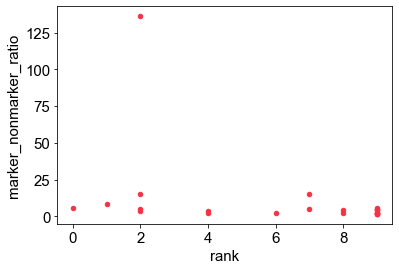

In [234]:
result_vmr_df.plot.scatter('rank','marker_nonmarker_ratio')

In [235]:
result_vmr_df

,dataset_name,idx,variance-to-mean ratio (markers),variance-to-mean ratio (non-markers),variance-to-mean ratio (all),marker_nonmarker_ratio,Dataset,rank
0,Kohinbulk_filtered,0,400.536898,254.463497,255.457600,1.574045,hESC (Koh et al.),9
1,HumanLiver_filtered,1,421.771481,3.094787,10.070407,136.284502,Liver (MacParland et al.),2
2,Zhengmix8eq_filtered,2,5.711968,1.246205,1.340939,4.583490,PBMC (Zheng et al.),7
3,TabulaAorta_filtered,3,2355.094307,1108.876674,1126.674698,2.123856,Aorta (Tabula Muris),4
4,TabulaBladder_filtered,4,2040.250700,460.397610,482.960493,4.431497,Bladder (Tabula Muris),8
5,TabulaBrainMyeloid_filtered,5,2616.988209,526.833071,556.683901,4.967395,Brain Myeloid (Tabula Muris),2
6,TabulaBrainNonMyeloid_filtered,6,2902.466465,1260.593139,1284.041772,2.302461,Brain Non-Myeloid (Tabula Muris),9
7,TabulaDiaphragm_filtered,7,2505.079714,538.256385,566.345835,4.654064,Diaphragm (Tabula Muris),9
8,TabulaFat_filtered,8,2745.868952,672.022633,701.640547,4.085977,Fat (Tabula Muris),9
9,TabulaHeart_filtered,9,3700.364518,641.994269,685.672793,5.763859,Heart (Tabula Muris),9


In [230]:
result_vmr_df.plot.scatter('rank','marker_nonmarker_ratio')

,dataset_name,idx,variance-to-mean ratio (markers),variance-to-mean ratio (non-markers),variance-to-mean ratio (all),marker_nonmarker_ratio,Dataset,rank
0,Kohinbulk_filtered,0,400.536898,254.463497,255.457600,1.574045,hESC (Koh et al.),9
1,HumanLiver_filtered,1,421.771481,3.094787,10.070407,136.284502,Liver (MacParland et al.),2
2,Zhengmix8eq_filtered,2,5.711968,1.246205,1.340939,4.583490,PBMC (Zheng et al.),7
3,TabulaAorta_filtered,3,2355.094307,1108.876674,1126.674698,2.123856,Aorta (Tabula Muris),4
4,TabulaBladder_filtered,4,2040.250700,460.397610,482.960493,4.431497,Bladder (Tabula Muris),8
5,TabulaBrainMyeloid_filtered,5,2616.988209,526.833071,556.683901,4.967395,Brain Myeloid (Tabula Muris),2
6,TabulaBrainNonMyeloid_filtered,6,2902.466465,1260.593139,1284.041772,2.302461,Brain Non-Myeloid (Tabula Muris),9
7,TabulaDiaphragm_filtered,7,2505.079714,538.256385,566.345835,4.654064,Diaphragm (Tabula Muris),9
8,TabulaFat_filtered,8,2745.868952,672.022633,701.640547,4.085977,Fat (Tabula Muris),9
9,TabulaHeart_filtered,9,3700.364518,641.994269,685.672793,5.763859,Heart (Tabula Muris),9


In [22]:
def get_metric(true_label,predict_label):
    true_label=np.array(true_label)
    predict_label=np.array(predict_label)
    
    assert len(true_label)==len(predict_label)
    
    precision=(np.sum(predict_label&true_label))/(np.sum(predict_label))
    recall=(np.sum(predict_label&true_label))/(np.sum(true_label))
    accuracy=(np.sum(predict_label==true_label))/(len(true_label))
    
    F1=2*(precision*recall)/(precision+recall)
    
    return {
        'precision':precision,
        'recall':recall,
        'accuracy':accuracy,
        'F1':F1
    }

In [91]:
panglao_db['organ'].unique()

array(['Pancreas', 'Connective tissue', 'Brain', 'Lungs', 'Smooth muscle',
       'Immune system', 'Epithelium', 'Heart', 'Liver', 'Adrenal glands',
       'GI tract', 'Reproductive', 'Kidney', 'Zygote', 'Vasculature',
       'Embryo', 'Blood', 'Thyroid', nan, 'Bone', 'Skin', 'Mammary gland',
       'Eye', 'Skeletal muscle', 'Olfactory system', 'Parathyroid glands',
       'Oral cavity', 'Thymus', 'Placenta', 'Urinary bladder'],
      dtype=object)

In [23]:
def top_n_confidence(dataset_name,exp_data_row,confidence_threshold=6,db='cellmarker'):
    metadata=dataset_metadict[dataset_name]
    
    species=metadata['species']
    gene_format=metadata['gene_format']
    
    if species=='human':
        if gene_format=='ensembl':
            if db=='cellmarker':
                marker_count=cellmarker_db_human_ensembl_count
            elif db=='panglao':
                marker_count=panglao_db_human_ensembl_count
            else:
                raise
        elif gene_format=='symbol':
            if db=='cellmarker':
                marker_count=cellmarker_db_human_symbol_count
            elif db=='panglao':
                marker_count=panglao_db_human_symbol_count
            else:
                raise            
        else:
            raise
    elif species=='mouse':
        if gene_format=='ensembl':
            if db=='cellmarker':
                marker_count=cellmarker_db_mouse_ensembl_count
            elif db=='panglao':
                marker_count=panglao_db_mouse_ensembl_count
            else:
                raise
        elif gene_format=='symbol':
            if db=='cellmarker':
                marker_count=cellmarker_db_mouse_symbol_count
            elif db=='panglao':
                marker_count=panglao_db_mouse_symbol_count
            else:
                raise
        else:
            raise        
    else:
        
        raise
    
    marker_subset=marker_count[marker_count>=confidence_threshold].index
       
    exp_data_row_check=[gene.lower() in marker_subset for gene in exp_data_row]
    #print(sum(exp_data_row_check))
    #print(len(exp_data_row),len(marker_subset))
    if sum(exp_data_row_check)<100:
        print(sum(exp_data_row_check))
        raise
    
    return exp_data_row_check

In [93]:
dataset_name

'TabulaTrachea_filtered'

# confidence

Kohinbulk_filtered
[]
0
0
0
MarcoPolo


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:73: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


ValueError: Only one class present in y_true. ROC AUC score is not defined in that case.

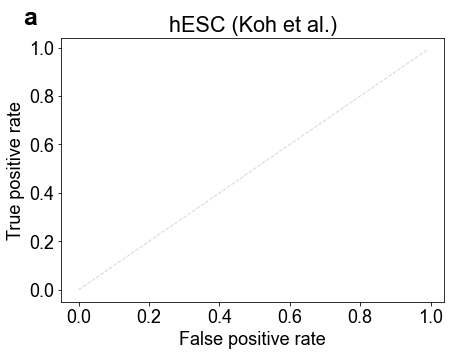

<Figure size 432x288 with 0 Axes>

In [43]:
fig = plt.figure(figsize=((7+1)*4,(5+2)*6)) 
gs=fig.add_gridspec((5+2)*6,(7+1)*4)
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)

record_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')

    marker=load_marker(dataset_name,method='panglao')          
    #marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=500,lfc=2)          
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))
    

    
    fig_rocplot=fig.add_subplot(gs[7*(idx//4):7*(idx//4)+5,8*(idx%4):8*(idx%4)+7])
    #fig=plt.figure()
    #fig_rocplot=fig.add_subplot()
    fig_rocplot.text(-0.1, 1.05, 'abcdefghijklmnopqrstuvwxyz'[idx], fontproperties=font_prop(bold=True,size=25), transform=fig_rocplot.transAxes)
    
    fig_rocplot.set_xlabel('False positive rate')
    fig_rocplot.set_ylabel('True positive rate')
    
    fig_rocplot.plot(np.arange(0,1,0.01),np.arange(0,1,0.01),c=(0.8,0.8,0.8,0.8),linewidth=1.0,linestyle='--')
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    fig_rocplot.set_title(
        '{}'.format(dataset_name_mapper(dataset_name)))    
    for method in ['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]:
        print(method)
        score=load_score(dataset_name,method)
        auc=roc_auc_score(DE_bool,score)

        fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score)
        fpr_all, tpr_all, thresholds_all = metrics.roc_curve(DE_bool,score,drop_intermediate=False)
        

        fig_rocplot.plot(fpr,
                         tpr,
                         label='{method:} AUC={AUC:.3f}'.format(
                                                                method=method_mapper(method)+',',
                                                                AUC=auc),
                         linestyle='--' if 'without' in method else '-',
                         linewidth=3.0,
                         zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                        )
        
        
        #title()
        score_thres=sorted(score)[::-1][100]
        
        metric=get_metric(DE_bool,score>score_thres)
        
        exp_data_row_confidencecheck=top_n_confidence(dataset_name,exp_data_row,3,db='panglao') 
        score_check=pd.DataFrame([score,exp_data_row_confidencecheck]).T.sort_values(by=0,ascending=False)
        
        record_list.append({
            'Dataset':dataset_name_mapper(dataset_name),
            'num_marker':np.sum(DE_bool),
            'num_cell':len(exp_data_col),
            'num_gene':len(exp_data_row),
            'num_type':len(exp_data_meta['phenoid'].unique()),
            'min_pop_size':exp_data_meta['phenoid'].value_counts().values[-1],
            'cv':exp_data_meta['phenoid'].value_counts().std()/exp_data_meta['phenoid'].value_counts().mean(),
            'Method':method_mapper(method),
            'AUC':auc,
            'Precision':metric['precision'],
            'Recall (FPR)':tpr_all[fpr_all>0.2][0],
            'Recall':metric['recall'],
            'F-score':metric['F1'],
            
            'confidence_50':score_check[1].iloc[:50].sum()/score_check[1].sum(),
            'confidence_100':score_check[1].iloc[:100].sum()/score_check[1].sum(),
            'confidence_200':score_check[1].iloc[:200].sum()/score_check[1].sum(),
            'confidence_300':score_check[1].iloc[:300].sum()/score_check[1].sum(),
            'confidence_400':score_check[1].iloc[:400].sum()/score_check[1].sum(),
            'confidence_500':score_check[1].iloc[:500].sum()/score_check[1].sum(),
            'confidence_600':score_check[1].iloc[:600].sum()/score_check[1].sum(),
            'confidence_700':score_check[1].iloc[:700].sum()/score_check[1].sum(),
            'confidence_800':score_check[1].iloc[:800].sum()/score_check[1].sum(),
            'confidence_900':score_check[1].iloc[:900].sum()/score_check[1].sum(),
            'confidence_1000':score_check[1].iloc[:1000].sum()/score_check[1].sum(),             
          
            
        })   
        
    """
 
    
    
    """
        
    leg=fig_rocplot.legend(loc='lower right',fontsize=15)

        
    fig_rocplot.spines['right'].set_visible(False)
    fig_rocplot.spines['top'].set_visible(False)

    

In [40]:
exp_data_row_confidencecheck

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 Fal

In [38]:
record_list_df_real = pd.DataFrame(record_list)
record_list_df_real

,Dataset,num_marker,num_cell,num_gene,num_type,min_pop_size,cv,Method,AUC,Precision,...,confidence_100,confidence_200,confidence_300,confidence_400,confidence_500,confidence_600,confidence_700,confidence_800,confidence_900,confidence_1000
0,hESC (Koh et al.),500,446,14694,8,22,0.299496,MarcoPolo,0.825914,0.45,...,0.045455,0.063636,0.087879,0.115152,0.133333,0.157576,0.169697,0.196970,0.206061,0.215152
1,hESC (Koh et al.),500,446,14694,8,22,0.299496,HVG (VST),0.728998,0.27,...,0.024242,0.042424,0.057576,0.069697,0.103030,0.127273,0.133333,0.145455,0.148485,0.157576
2,hESC (Koh et al.),500,446,14694,8,22,0.299496,HVG (DISP),0.595493,0.18,...,0.033333,0.048485,0.060606,0.075758,0.084848,0.096970,0.103030,0.112121,0.112121,0.130303
3,hESC (Koh et al.),500,446,14694,8,22,0.299496,scHaystack,0.683289,0.45,...,0.048485,0.081818,0.106061,0.130303,0.160606,0.184848,0.196970,0.203030,0.215152,0.236364
4,hESC (Koh et al.),500,446,14694,8,22,0.299496,"Clustering+DE (0.5, default)",0.628295,0.58,...,0.054545,0.096970,0.130303,0.151515,0.184848,0.221212,0.248485,0.263636,0.266667,0.284848
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (1.0, default)",0.879747,0.78,...,0.072165,0.147766,0.202749,0.292096,0.371134,0.429553,0.470790,0.518900,0.560137,0.611684
226,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (1.5, default)",0.883881,0.75,...,0.082474,0.123711,0.199313,0.302405,0.374570,0.429553,0.474227,0.522337,0.573883,0.611684
227,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (0.5, no filter)",0.908026,0.80,...,0.061856,0.154639,0.230241,0.312715,0.391753,0.443299,0.487973,0.518900,0.553265,0.591065
228,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (1.0, no filter)",0.899457,0.78,...,0.072165,0.147766,0.202749,0.292096,0.371134,0.429553,0.470790,0.518900,0.560137,0.615120


In [41]:
record_list_df_real

,Dataset,num_marker,num_cell,num_gene,num_type,min_pop_size,cv,Method,AUC,Precision,...,confidence_100,confidence_200,confidence_300,confidence_400,confidence_500,confidence_600,confidence_700,confidence_800,confidence_900,confidence_1000
0,hESC (Koh et al.),500,446,14694,8,22,0.299496,MarcoPolo,0.825914,0.45,...,0.045455,0.063636,0.087879,0.115152,0.133333,0.157576,0.169697,0.196970,0.206061,0.215152
1,hESC (Koh et al.),500,446,14694,8,22,0.299496,HVG (VST),0.728998,0.27,...,0.024242,0.042424,0.057576,0.069697,0.103030,0.127273,0.133333,0.145455,0.148485,0.157576
2,hESC (Koh et al.),500,446,14694,8,22,0.299496,HVG (DISP),0.595493,0.18,...,0.033333,0.048485,0.060606,0.075758,0.084848,0.096970,0.103030,0.112121,0.112121,0.130303
3,hESC (Koh et al.),500,446,14694,8,22,0.299496,scHaystack,0.683289,0.45,...,0.048485,0.081818,0.106061,0.130303,0.160606,0.184848,0.196970,0.203030,0.215152,0.236364
4,hESC (Koh et al.),500,446,14694,8,22,0.299496,"Clustering+DE (0.5, default)",0.628295,0.58,...,0.054545,0.096970,0.130303,0.151515,0.184848,0.221212,0.248485,0.263636,0.266667,0.284848
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (1.0, default)",0.879747,0.78,...,0.072165,0.147766,0.202749,0.292096,0.371134,0.429553,0.470790,0.518900,0.560137,0.611684
226,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (1.5, default)",0.883881,0.75,...,0.082474,0.123711,0.199313,0.302405,0.374570,0.429553,0.474227,0.522337,0.573883,0.611684
227,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (0.5, no filter)",0.908026,0.80,...,0.061856,0.154639,0.230241,0.312715,0.391753,0.443299,0.487973,0.518900,0.553265,0.591065
228,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (1.0, no filter)",0.899457,0.78,...,0.072165,0.147766,0.202749,0.292096,0.371134,0.429553,0.470790,0.518900,0.560137,0.615120


In [39]:
a=record_list_df_real.groupby(['Method']).agg(np.median)
a.iloc[:,11:]

,confidence_50,confidence_100,confidence_200,confidence_300,confidence_400,confidence_500,confidence_600,confidence_700,confidence_800,confidence_900,confidence_1000
Method,,,,,,,,,,,
"Clustering+DE (0.5, default)",0.054167,0.104478,0.193717,0.266667,0.335079,0.385768,0.436426,0.473077,0.509363,0.547009,0.587629
"Clustering+DE (0.5, no filter)",0.054167,0.104478,0.193717,0.266667,0.335079,0.385768,0.441509,0.480769,0.515385,0.543071,0.584615
"Clustering+DE (1.0, default)",0.057692,0.109948,0.193939,0.266667,0.324138,0.393258,0.461538,0.493902,0.530769,0.559140,0.576923
"Clustering+DE (1.0, no filter)",0.057692,0.109948,0.193939,0.266667,0.324138,0.389513,0.455128,0.487805,0.524390,0.554878,0.580645
"Clustering+DE (1.5, default)",0.052356,0.106897,0.187879,0.266667,0.348315,0.411985,0.448718,0.478632,0.522337,0.567073,0.583691
"Clustering+DE (1.5, no filter)",0.052356,0.106897,0.189655,0.266667,0.346154,0.407692,0.441948,0.476923,0.522337,0.567073,0.580645
HVG (DISP),0.072650,0.129568,0.223077,0.288390,0.359551,0.403727,0.452830,0.493562,0.523605,0.557940,0.584906
HVG (VST),0.070796,0.138462,0.235602,0.301282,0.335404,0.365591,0.408602,0.424731,0.446237,0.486207,0.506897
MarcoPolo,0.049689,0.081197,0.159292,0.218884,0.286275,0.339056,0.378277,0.424138,0.454936,0.497854,0.528302


# wilcox

Kohinbulk_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter


KeyboardInterrupt: 

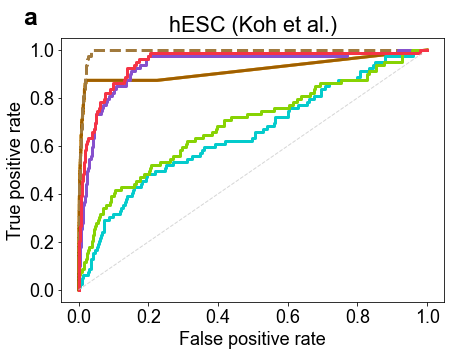

<Figure size 432x288 with 0 Axes>

In [94]:
fig = plt.figure(figsize=((7+1)*4,(5+2)*6)) 
gs=fig.add_gridspec((5+2)*6,(7+1)*4)
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)

record_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')


    marker=load_marker(dataset_name,method='wilcox')          
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))

    fig_rocplot=fig.add_subplot(gs[7*(idx//4):7*(idx//4)+5,8*(idx%4):8*(idx%4)+7])
    #fig=plt.figure()
    #fig_rocplot=fig.add_subplot()
    fig_rocplot.text(-0.1, 1.05, 'abcdefghijklmnopqrstuvwxyz'[idx], fontproperties=font_prop(bold=True,size=25), transform=fig_rocplot.transAxes)
    
    fig_rocplot.set_xlabel('False positive rate')
    fig_rocplot.set_ylabel('True positive rate')
    
    fig_rocplot.plot(np.arange(0,1,0.01),np.arange(0,1,0.01),c=(0.8,0.8,0.8,0.8),linewidth=1.0,linestyle='--')
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    fig_rocplot.set_title(
        '{}'.format(dataset_name_mapper(dataset_name)))    
    for method in ['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]:
        print(method)
        score=load_score(dataset_name,method)
        auc=roc_auc_score(DE_bool,score)

        fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score)
        fpr_all, tpr_all, thresholds_all = metrics.roc_curve(DE_bool,score,drop_intermediate=False)
        

        fig_rocplot.plot(fpr,
                         tpr,
                         label='{method:} AUC={AUC:.3f}'.format(
                                                                method=method_mapper(method)+',',
                                                                AUC=auc),
                         linestyle='--' if 'without' in method else '-',
                         linewidth=3.0,
                         zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                        )
        
        
        #title()
        score_thres=sorted(score)[::-1][100]
        
        metric=get_metric(DE_bool,score>score_thres)
        
        #exp_data_row_confidencecheck=top_n_confidence(dataset_name,exp_data_row,6) 
        #score_check=pd.DataFrame([score,exp_data_row_confidencecheck]).T.sort_values(by=0,ascending=False)
        
        record_list.append({
            'Dataset':dataset_name_mapper(dataset_name),
            'num_marker':np.sum(DE_bool),
            'num_cell':len(exp_data_col),
            'num_gene':len(exp_data_row),
            'num_type':len(exp_data_meta['phenoid'].unique()),
            'min_pop_size':exp_data_meta['phenoid'].value_counts().values[-1],
            'cv':exp_data_meta['phenoid'].value_counts().std()/exp_data_meta['phenoid'].value_counts().mean(),
            'Method':method_mapper(method),
            'AUC':auc,
            'Precision':metric['precision'],
            'Recall (FPR)':tpr_all[fpr_all>0.2][0],
            'Recall':metric['recall'],
            'F-score':metric['F1'],
          
            
        })   
        
    """
            'confidence_50':score_check[1].iloc[:50].sum()/score_check[1].sum(),
            'confidence_100':score_check[1].iloc[:100].sum()/score_check[1].sum(),
            'confidence_200':score_check[1].iloc[:200].sum()/score_check[1].sum(),
            'confidence_300':score_check[1].iloc[:300].sum()/score_check[1].sum(),
            'confidence_400':score_check[1].iloc[:400].sum()/score_check[1].sum(),
            'confidence_500':score_check[1].iloc[:500].sum()/score_check[1].sum(),
            'confidence_600':score_check[1].iloc[:600].sum()/score_check[1].sum(),
            'confidence_700':score_check[1].iloc[:700].sum()/score_check[1].sum(),
            'confidence_800':score_check[1].iloc[:800].sum()/score_check[1].sum(),
            'confidence_900':score_check[1].iloc[:900].sum()/score_check[1].sum(),
            'confidence_1000':score_check[1].iloc[:1000].sum()/score_check[1].sum(),  
    
    
    """
        
    leg=fig_rocplot.legend(loc='lower right',fontsize=15)

        
    fig_rocplot.spines['right'].set_visible(False)
    fig_rocplot.spines['top'].set_visible(False)

    

In [27]:
fig.savefig('pub/real_roc_wilcox.png', bbox_inches='tight')
fig.savefig('pub/real_roc_wilcox.jpg', bbox_inches='tight')
fig.savefig('pub/real_roc_wilcox.svg', bbox_inches='tight')

0.819561710615692

In [77]:
len(tpr_average)

100

In [70]:
np.array(a).mean(axis=0).shape

(100,)

# consensus

Kohinbulk_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
HumanLiver_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
Zhengmix8eq_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaAorta_filtered
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


disp


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBladder_filtered
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


disp
ht.pca
seurat,0_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


TabulaBrainMyeloid_filtered
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


disp


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


ht.pca


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


TabulaBrainNonMyeloid_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaDiaphragm_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaFat_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaHeart_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaKidney_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLargeIntest

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLimbMuscle_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLiver_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLung_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaMammaryGland_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaMarrow_filtered
MarcoPolo
vst
disp
ht.pca
seurat

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


TabulaSpleen_filtered
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaThymus_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,without_filter
seurat,1_0,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


TabulaTongue_filtered
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


disp


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


ht.pca
seurat,0_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


TabulaTrachea_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter


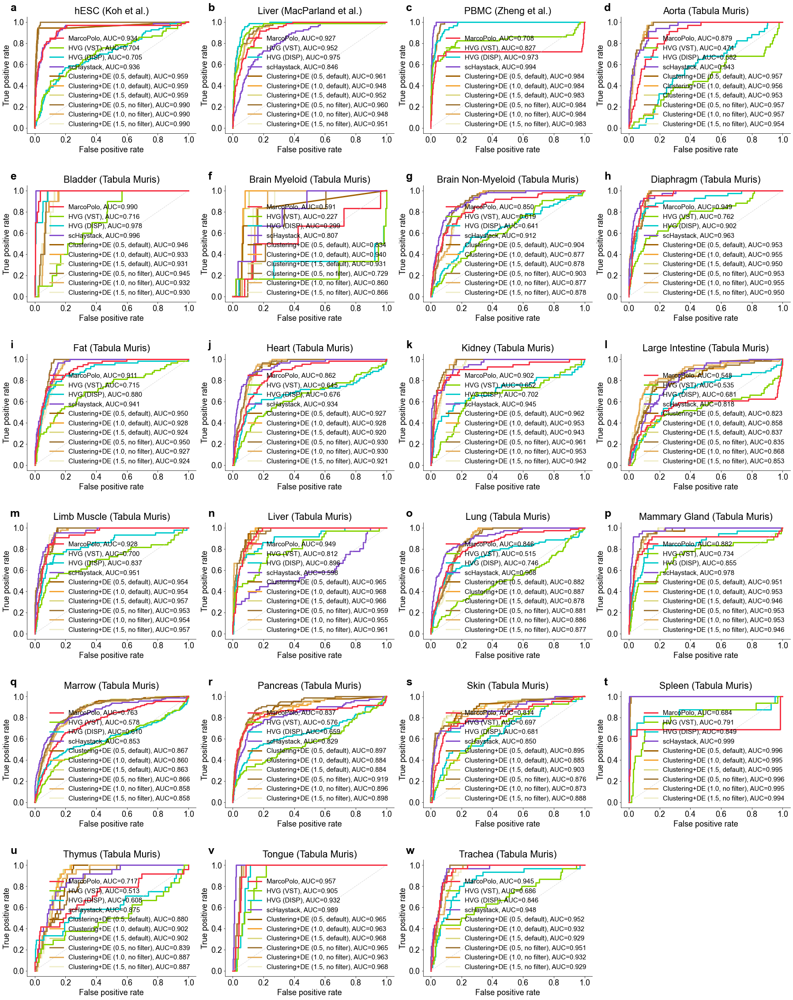

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [31]:
fig = plt.figure(figsize=((7+1)*4,(5+2)*6)) 
gs=fig.add_gridspec((5+2)*6,(7+1)*4)
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)

record_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')


    marker=load_marker(dataset_name,method='consensus')          
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))

    fig_rocplot=fig.add_subplot(gs[7*(idx//4):7*(idx//4)+5,8*(idx%4):8*(idx%4)+7])
    #fig=plt.figure()
    #fig_rocplot=fig.add_subplot()
    fig_rocplot.text(-0.1, 1.05, 'abcdefghijklmnopqrstuvwxyz'[idx], fontproperties=font_prop(bold=True,size=25), transform=fig_rocplot.transAxes)
    
    fig_rocplot.set_xlabel('False positive rate')
    fig_rocplot.set_ylabel('True positive rate')
    
    fig_rocplot.plot(np.arange(0,1,0.01),np.arange(0,1,0.01),c=(0.8,0.8,0.8,0.8),linewidth=1.0,linestyle='--')
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    fig_rocplot.set_title(
        '{}'.format(dataset_name_mapper(dataset_name)))    
    for method in ['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]:
        print(method)
        score=load_score(dataset_name,method)
        auc=roc_auc_score(DE_bool,score)

        fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score)
        fpr_all, tpr_all, thresholds_all = metrics.roc_curve(DE_bool,score,drop_intermediate=False)
        

        fig_rocplot.plot(fpr,
                         tpr,
                         label='{method:} AUC={AUC:.3f}'.format(
                                                                method=method_mapper(method)+',',
                                                                AUC=auc),
                         linestyle='--' if 'without' in method else '-',
                         linewidth=3.0,
                         zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                        )
        
        
        #title()
        score_thres=sorted(score)[::-1][100]
        
        metric=get_metric(DE_bool,score>score_thres)
        
        #exp_data_row_confidencecheck=top_n_confidence(dataset_name,exp_data_row,6) 
        #score_check=pd.DataFrame([score,exp_data_row_confidencecheck]).T.sort_values(by=0,ascending=False)
        
        record_list.append({
            'Dataset':dataset_name_mapper(dataset_name),
            'num_marker':np.sum(DE_bool),
            'num_cell':len(exp_data_col),
            'num_gene':len(exp_data_row),
            'num_type':len(exp_data_meta['phenoid'].unique()),
            'min_pop_size':exp_data_meta['phenoid'].value_counts().values[-1],
            'cv':exp_data_meta['phenoid'].value_counts().std()/exp_data_meta['phenoid'].value_counts().mean(),
            'Method':method_mapper(method),
            'AUC':auc,
            'Precision':metric['precision'],
            'Recall (FPR)':tpr_all[fpr_all>0.2][0],
            'Recall':metric['recall'],
            'F-score':metric['F1'],
          
            
        })   
        
    """
            'confidence_50':score_check[1].iloc[:50].sum()/score_check[1].sum(),
            'confidence_100':score_check[1].iloc[:100].sum()/score_check[1].sum(),
            'confidence_200':score_check[1].iloc[:200].sum()/score_check[1].sum(),
            'confidence_300':score_check[1].iloc[:300].sum()/score_check[1].sum(),
            'confidence_400':score_check[1].iloc[:400].sum()/score_check[1].sum(),
            'confidence_500':score_check[1].iloc[:500].sum()/score_check[1].sum(),
            'confidence_600':score_check[1].iloc[:600].sum()/score_check[1].sum(),
            'confidence_700':score_check[1].iloc[:700].sum()/score_check[1].sum(),
            'confidence_800':score_check[1].iloc[:800].sum()/score_check[1].sum(),
            'confidence_900':score_check[1].iloc[:900].sum()/score_check[1].sum(),
            'confidence_1000':score_check[1].iloc[:1000].sum()/score_check[1].sum(),  
    
    
    """
        
    leg=fig_rocplot.legend(loc='lower right',fontsize=15)

        
    fig_rocplot.spines['right'].set_visible(False)
    fig_rocplot.spines['top'].set_visible(False)

    

In [32]:
fig.savefig('pub/real_roc_consensus.png', bbox_inches='tight')
fig.savefig('pub/real_roc_consensus.jpg', bbox_inches='tight')
fig.savefig('pub/real_roc_consensus.svg', bbox_inches='tight')

# maxdiff

Kohinbulk_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
HumanLiver_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
Zhengmix8eq_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaAorta_filtered
MarcoPolo
vst
disp
ht.pca


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBladder_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBrainMyeloid_filtered
MarcoPolo
vst
disp
ht.pca


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBrainNonMyeloid_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaDiaphragm_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaFat_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaHeart_filtered
MarcoPolo
vst
disp
ht.pca


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaKidney_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLargeIntestine_filtered
MarcoPolo
vst
disp
ht.pca


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLimbMuscle_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLiver_filtered
MarcoPolo
vst
disp
ht.pca


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLung_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaMammaryGland_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaMarrow_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaPancreas_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaSkin_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filte

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


TabulaSpleen_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaThymus_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaTongue_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaTrachea_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter


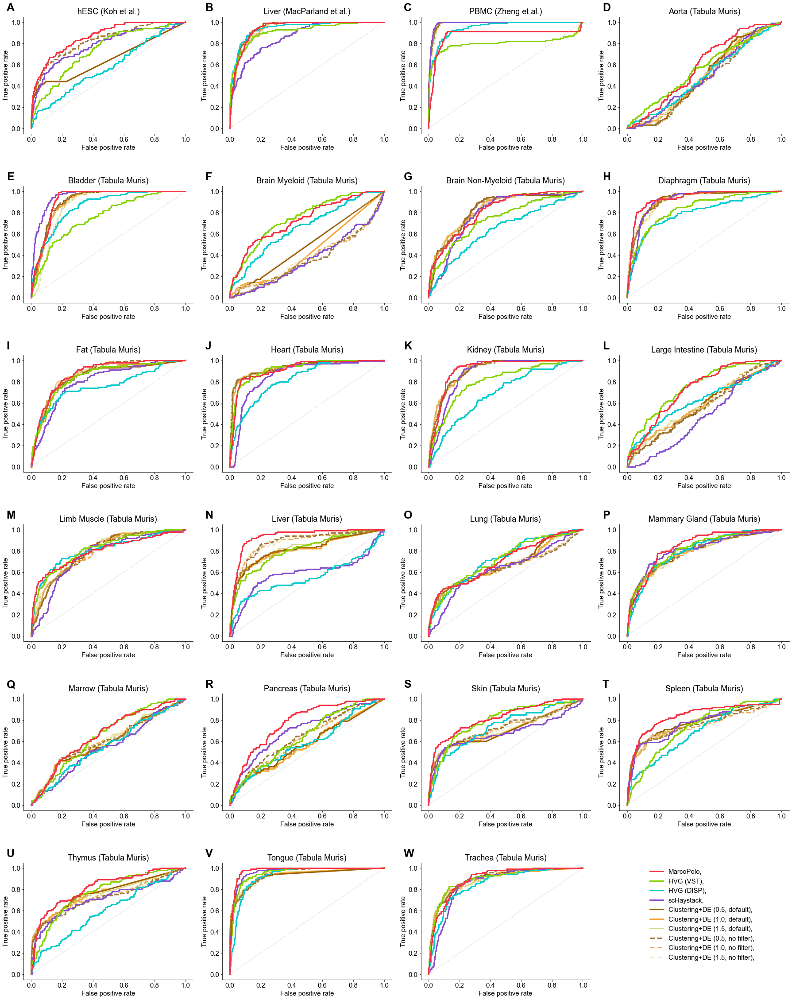

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [198]:
fig = plt.figure(figsize=((7+1)*4,(5+2)*6)) 
gs=fig.add_gridspec((5+2)*6,(7+1)*4)
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)

record_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')


    marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=100,lfc=2)          
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))

    fig_rocplot=fig.add_subplot(gs[7*(idx//4):7*(idx//4)+5,8*(idx%4):8*(idx%4)+7])
    #fig=plt.figure()
    #fig_rocplot=fig.add_subplot()
    fig_rocplot.text(-0.1, 1.05, 'abcdefghijklmnopqrstuvwxyz'[idx].upper(), fontproperties=font_prop(bold=True,size=25), transform=fig_rocplot.transAxes)
    
    fig_rocplot.set_xlabel('False positive rate')
    fig_rocplot.set_ylabel('True positive rate')
    
    fig_rocplot.plot(np.arange(0,1,0.01),np.arange(0,1,0.01),c=(0.8,0.8,0.8,0.8),linewidth=1.0,linestyle='--')
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    fig_rocplot.set_title(
        '{}'.format(dataset_name_mapper(dataset_name)))    
    
    for method in ['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]:   
        print(method)
        score=load_score(dataset_name,method)
        auc=roc_auc_score(DE_bool,score)

        fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score)
        fpr_all, tpr_all, thresholds_all = metrics.roc_curve(DE_bool,score,drop_intermediate=False)
        

        fig_rocplot.plot(fpr,
                         tpr,
                         label='{method:}'.format(
                                                                method=method_mapper(method)+',',
                                                                AUC=auc),
                         linestyle='--' if 'without' in method else '-',
                         linewidth=3.0,
                         zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                        )
        
        
        #title()
        score_thres=sorted(score)[::-1][100]
        
        metric=get_metric(DE_bool,score>score_thres)
        
        #exp_data_row_confidencecheck=top_n_confidence(dataset_name,exp_data_row,6) 
        #score_check=pd.DataFrame([score,exp_data_row_confidencecheck]).T.sort_values(by=0,ascending=False)
        
        record_list.append({
            'Dataset':dataset_name_mapper(dataset_name),
            'num_marker':np.sum(DE_bool),
            'num_cell':len(exp_data_col),
            'num_gene':len(exp_data_row),
            'num_type':len(exp_data_meta['phenoid'].unique()),
            'min_pop_size':exp_data_meta['phenoid'].value_counts().values[-1],
            'cv':exp_data_meta['phenoid'].value_counts().std()/exp_data_meta['phenoid'].value_counts().mean(),
            'Method':method_mapper(method),
            'AUC':auc,
            'Precision':metric['precision'],
            'Recall (FPR)':tpr_all[fpr_all>0.2][0],
            'Recall':metric['recall'],
            'F-score':metric['F1'],
          
            
        })   
        
    """
            'confidence_50':score_check[1].iloc[:50].sum()/score_check[1].sum(),
            'confidence_100':score_check[1].iloc[:100].sum()/score_check[1].sum(),
            'confidence_200':score_check[1].iloc[:200].sum()/score_check[1].sum(),
            'confidence_300':score_check[1].iloc[:300].sum()/score_check[1].sum(),
            'confidence_400':score_check[1].iloc[:400].sum()/score_check[1].sum(),
            'confidence_500':score_check[1].iloc[:500].sum()/score_check[1].sum(),
            'confidence_600':score_check[1].iloc[:600].sum()/score_check[1].sum(),
            'confidence_700':score_check[1].iloc[:700].sum()/score_check[1].sum(),
            'confidence_800':score_check[1].iloc[:800].sum()/score_check[1].sum(),
            'confidence_900':score_check[1].iloc[:900].sum()/score_check[1].sum(),
            'confidence_1000':score_check[1].iloc[:1000].sum()/score_check[1].sum(),  
    
    
    """
    #if 'trachea' in dataset_name:
    if idx==len(dataset_name_all)-1:
        leg=fig_rocplot.legend(bbox_to_anchor=(2,1), fontsize=15)

        
    fig_rocplot.spines['right'].set_visible(False)
    fig_rocplot.spines['top'].set_visible(False)

    

In [199]:
fig.savefig('pub/real_roc_maxdiff_100.png', bbox_inches='tight')
fig.savefig('pub/real_roc_maxdiff_100.jpg', bbox_inches='tight')
fig.savefig('pub/real_roc_maxdiff_100.svg', bbox_inches='tight')

In [200]:
pd.DataFrame(record_list)#.groupby(['Dataset','Method']).mean()['AUC']
pd.DataFrame(record_list).pivot(index='Dataset', columns='Method', values='AUC')\
.loc[pd.Series(dataset_name_all).map(dataset_name_mapper)]\
[pd.Series(['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]).map(method_mapper)].round(3).to_csv('pub/real_roc_maxdiff_100.csv')

In [202]:
record_list_df_real = pd.DataFrame(record_list)
record_list_df_real

,Dataset,num_marker,num_cell,num_gene,num_type,min_pop_size,cv,Method,AUC,Precision,Recall (FPR),Recall,F-score
0,hESC (Koh et al.),100,446,14694,8,22,0.299496,MarcoPolo,0.864736,0.17,0.72,0.17,0.17
1,hESC (Koh et al.),100,446,14694,8,22,0.299496,HVG (VST),0.737704,0.08,0.49,0.08,0.08
2,hESC (Koh et al.),100,446,14694,8,22,0.299496,HVG (DISP),0.578428,0.04,0.30,0.04,0.04
3,hESC (Koh et al.),100,446,14694,8,22,0.299496,scHaystack,0.784373,0.11,0.66,0.11,0.11
4,hESC (Koh et al.),100,446,14694,8,22,0.299496,"Clustering+DE (0.5, default)",0.648116,0.18,0.44,0.18,0.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,Trachea (Tabula Muris),100,1350,7002,4,113,0.981036,"Clustering+DE (1.0, default)",0.892030,0.26,0.81,0.26,0.26
226,Trachea (Tabula Muris),100,1350,7002,4,113,0.981036,"Clustering+DE (1.5, default)",0.895474,0.25,0.80,0.25,0.25
227,Trachea (Tabula Muris),100,1350,7002,4,113,0.981036,"Clustering+DE (0.5, no filter)",0.901957,0.23,0.85,0.23,0.23
228,Trachea (Tabula Muris),100,1350,7002,4,113,0.981036,"Clustering+DE (1.0, no filter)",0.900410,0.26,0.81,0.26,0.26


In [203]:
record_list_df_real.groupby('Method').median()

,num_marker,num_cell,num_gene,num_type,min_pop_size,cv,AUC,Precision,Recall (FPR),Recall,F-score
Method,,,,,,,,,,,
"Clustering+DE (0.5, default)",100,1697,7002,5,42,1.024717,0.795959,0.17,0.67,0.17,0.18
"Clustering+DE (0.5, no filter)",100,1697,7002,5,42,1.024717,0.828930,0.17,0.68,0.17,0.19
"Clustering+DE (1.0, default)",100,1697,7002,5,42,1.024717,0.794128,0.19,0.66,0.19,0.19
"Clustering+DE (1.0, no filter)",100,1697,7002,5,42,1.024717,0.828930,0.20,0.66,0.20,0.20
"Clustering+DE (1.5, default)",100,1697,7002,5,42,1.024717,0.804249,0.20,0.65,0.20,0.20
"Clustering+DE (1.5, no filter)",100,1697,7002,5,42,1.024717,0.828930,0.20,0.66,0.20,0.20
HVG (DISP),100,1697,7002,5,42,1.024717,0.723037,0.12,0.50,0.12,0.12
HVG (VST),100,1697,7002,5,42,1.024717,0.798447,0.16,0.64,0.16,0.16
MarcoPolo,100,1697,7002,5,42,1.024717,0.846789,0.17,0.77,0.17,0.17


In [71]:
def iqr_func(x):

    q3, q1 = np.percentile(x, [75, 25])
    #print(x)
    iqr = q3 - q1
    #print(iqr)
    return iqr

In [72]:
record_list_df_real.groupby('Method').agg(iqr_func)

,num_marker,num_cell,num_gene,num_type,min_pop_size,cv,AUC,Precision,Recall (FPR),Recall,F-score
Method,,,,,,,,,,,
"Clustering+DE (0.5, default)",0,2746.5,0,4,28.5,0.376174,0.246873,0.135,0.385,0.135,NaN
"Clustering+DE (0.5, no filter)",0,2746.5,0,4,28.5,0.376174,0.224653,0.135,0.340,0.135,NaN
"Clustering+DE (1.0, default)",0,2746.5,0,4,28.5,0.376174,0.246054,0.140,0.370,0.140,0.140
"Clustering+DE (1.0, no filter)",0,2746.5,0,4,28.5,0.376174,0.223772,0.140,0.315,0.140,0.140
"Clustering+DE (1.5, default)",0,2746.5,0,4,28.5,0.376174,0.245607,0.170,0.370,0.170,0.170
"Clustering+DE (1.5, no filter)",0,2746.5,0,4,28.5,0.376174,0.220585,0.170,0.295,0.170,0.170
HVG (DISP),0,2746.5,0,4,28.5,0.376174,0.203083,0.110,0.320,0.110,0.110
HVG (VST),0,2746.5,0,4,28.5,0.376174,0.089110,0.105,0.240,0.105,0.105
MarcoPolo,0,2746.5,0,4,28.5,0.376174,0.127899,0.100,0.325,0.100,0.100


In [204]:
for method in ['MarcoPolo','VST','DISP','Haystack','Clustering']:
    count=0

    for dataset in record_list_df_real['Dataset'].unique():
        record_list_df_real_sub=record_list_df_real[record_list_df_real['Dataset']==dataset]
        #print(record_list_df_real_sub)

        if sum(record_list_df_real_sub[~record_list_df_real_sub['Method'].str.contains(method)]['AUC']\

               <=record_list_df_real_sub[record_list_df_real_sub['Method'].str.contains(method)]['AUC'].max())==9-(5 if method=='Clustering' else 0):
            count+=1
    
    print(count)
    

13
3
1
2
4


In [59]:
for method in ['MarcoPolo','VST','DISP','Haystack','Clustering']:
    count=0

    for dataset in record_list_df_real['Dataset'].unique():
        record_list_df_real_sub=record_list_df_real[record_list_df_real['Dataset']==dataset]
        #print(record_list_df_real_sub)

        if sum(record_list_df_real_sub[~record_list_df_real_sub['Method'].str.contains(method)]['AUC']\

               <=record_list_df_real_sub[record_list_df_real_sub['Method'].str.contains(method)]['AUC'].max())==8-(5 if method=='Clustering' else 0):
            count+=1
    
    print(count)
    

3
6
1
2
7


In [74]:
record_list_df_real

,Dataset,num_marker,num_cell,num_gene,num_type,min_pop_size,cv,Method,AUC,Precision,Recall (FPR),Recall,F-score
0,hESC (Koh et al.),100,446,14694,8,22,0.299496,MarcoPolo,0.864736,0.17,0.72,0.17,0.17
1,hESC (Koh et al.),100,446,14694,8,22,0.299496,HVG (VST),0.737704,0.08,0.49,0.08,0.08
2,hESC (Koh et al.),100,446,14694,8,22,0.299496,HVG (DISP),0.578428,0.04,0.30,0.04,0.04
3,hESC (Koh et al.),100,446,14694,8,22,0.299496,scHaystack,0.784373,0.11,0.66,0.11,0.11
4,hESC (Koh et al.),100,446,14694,8,22,0.299496,"Clustering+DE (0.5, default)",0.648116,0.18,0.44,0.18,0.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,Trachea (Tabula Muris),100,1350,7002,4,113,0.981036,"Clustering+DE (1.0, default)",0.892030,0.26,0.81,0.26,0.26
226,Trachea (Tabula Muris),100,1350,7002,4,113,0.981036,"Clustering+DE (1.5, default)",0.895474,0.25,0.80,0.25,0.25
227,Trachea (Tabula Muris),100,1350,7002,4,113,0.981036,"Clustering+DE (0.5, no filter)",0.901957,0.23,0.85,0.23,0.23
228,Trachea (Tabula Muris),100,1350,7002,4,113,0.981036,"Clustering+DE (1.0, no filter)",0.900410,0.26,0.81,0.26,0.26


In [ ]:

    
    #if sum(record_list_df_real_sub['AUC']<=record_list_df_real_sub.set_index('Method').loc['Haystack']['AUC'])==6:
    #    count+=1
count    

No handles with labels found to put in legend.


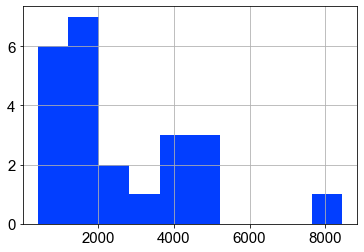

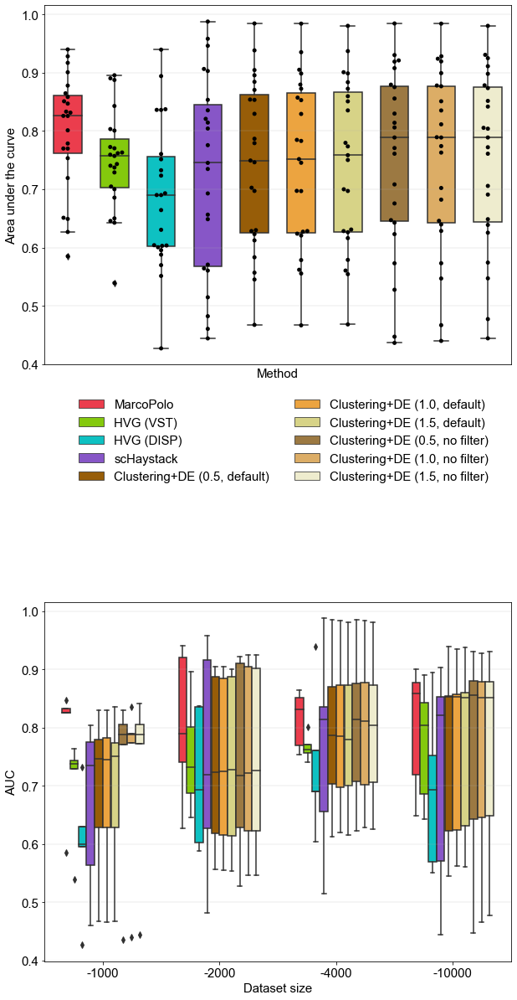

In [197]:
record_list_df_real=pd.DataFrame(record_list)
record_list_df_real

record_list_df_real['Area under the curve']=record_list_df_real['AUC']

record_list_df_real[~record_list_df_real['Dataset'].duplicated()]['num_cell'].hist()

record_list_df_real['Dataset size']=record_list_df_real['num_cell'].map(lambda x: 

                                                                        '-1000' if x<=1000 else                                                                        
                                                                        '-2000' if x<=2000 else
                                                                        '-4000' if x<=4000 else                                                                        
                                                                        '-10000').values


plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(10, 8+5+8)) 
gs=fig.add_gridspec(8+5+8,10)

fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.boxplot(x='Method',
            y='Area under the curve',
            data=record_list_df_real,
            palette=color_qual_7_3,
            width=0.6,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#fig_sub1.text(-0.1, 1.05, 'b', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Real Datasets')

leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.12, -0.45),
                   ncol=2
                   )#,fontsize=15)

fig_sub1.get_legend()._legend_box.align = "left"

fig_sub1.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

sns.swarmplot(x='Method',
            y='Area under the curve',
            data=record_list_df_real,
              
              color='black',
            ax=fig_sub1
           )


fig_sub1=fig.add_subplot(gs[8+5:16+5,0:10])

sns.boxplot(x='Dataset size',order=sorted(record_list_df_real['Dataset size'].unique(),key=lambda x: int(x.replace('-',''))),
            hue='Method',
            y='AUC',
            data=record_list_df_real[
                
                                     (~record_list_df_real['Method'].str.contains('no thres.'))
                                     
                
                
            ],
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )

fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#fig_sub1.set_title('Real Datasets')
"""
leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.15, 1.05),
                   ncol=2,
                   )#,fontsize=15)
"""
leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.05, 1.3),
                   ncol=2,
                   )#,fontsize=15)

In [170]:
def iqr_func(x):

    q3, q1 = np.percentile(x, [75, 25])
    #print(x)
    iqr = q3 - q1
    #print(iqr)
    return iqr

In [171]:
record_list_df_real.groupby('Method').agg(iqr_func)

,num_marker,num_cell,num_gene,num_type,min_pop_size,cv,AUC,Precision,Recall (FPR),Recall,F-score,Area under the curve
Method,,,,,,,,,,,,
"Clustering+DE (0.5, default)",0,2746.5,0,4,28.5,0.376174,0.236679,0.340,0.385,0.071,0.118333,0.236679
"Clustering+DE (0.5, no filter)",0,2746.5,0,4,28.5,0.376174,0.232672,0.340,0.355,0.071,0.118333,0.232672
"Clustering+DE (1.0, default)",0,2746.5,0,4,28.5,0.376174,0.239513,0.275,0.396,0.060,0.100000,0.239513
"Clustering+DE (1.0, no filter)",0,2746.5,0,4,28.5,0.376174,0.234822,0.275,0.372,0.060,0.100000,0.234822
"Clustering+DE (1.5, default)",0,2746.5,0,4,28.5,0.376174,0.238984,0.245,0.402,0.061,0.101667,0.238984
"Clustering+DE (1.5, no filter)",0,2746.5,0,4,28.5,0.376174,0.232373,0.245,0.373,0.061,0.101667,0.232373
HVG (DISP),0,2746.5,0,4,28.5,0.376174,0.154377,0.250,0.263,0.053,0.088333,0.154377
HVG (VST),0,2746.5,0,4,28.5,0.376174,0.084252,0.185,0.167,0.042,0.070000,0.084252
MarcoPolo,0,2746.5,0,4,28.5,0.376174,0.100013,0.235,0.262,0.040,0.066667,0.100013


In [61]:
fig.savefig('pub/real_auc_maxdiff_100.png', bbox_inches='tight')
fig.savefig('pub/real_auc_maxdiff_100.jpg', bbox_inches='tight')
fig.savefig('pub/real_auc_maxdiff_100.svg', bbox_inches='tight')

Kohinbulk_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
HumanLiver_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
Zhengmix8eq_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaAorta_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBladder_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBrainMyeloid_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBrainNonMyeloid_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaDiaphragm_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaFat_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaHeart_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaKidney_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,withou

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLimbMuscle_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLiver_filtered
MarcoPolo
vst
disp
ht.pca


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLung_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaMammaryGland_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaMarrow_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaPancreas_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaSkin_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filte

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


TabulaSpleen_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaThymus_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaTongue_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaTrachea_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter


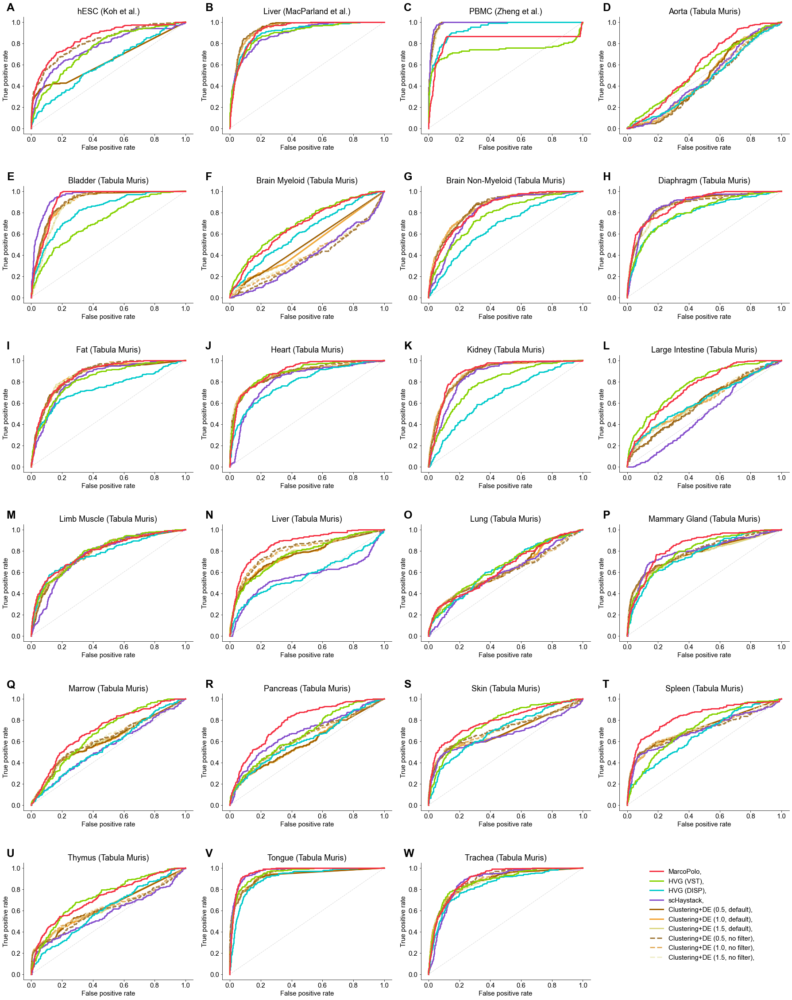

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [75]:
fig = plt.figure(figsize=((7+1)*4,(5+2)*6)) 
gs = fig.add_gridspec((5+2)*6,(7+1)*4)
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)

record_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')


    marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=200,lfc=2)          
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))

    fig_rocplot=fig.add_subplot(gs[7*(idx//4):7*(idx//4)+5,8*(idx%4):8*(idx%4)+7])
    #fig=plt.figure()
    #fig_rocplot=fig.add_subplot()
    fig_rocplot.text(-0.1, 1.05, 'abcdefghijklmnopqrstuvwxyz'[idx].upper(), fontproperties=font_prop(bold=True,size=25), transform=fig_rocplot.transAxes)
    
    fig_rocplot.set_xlabel('False positive rate')
    fig_rocplot.set_ylabel('True positive rate')
    
    fig_rocplot.plot(np.arange(0,1,0.01),np.arange(0,1,0.01),c=(0.8,0.8,0.8,0.8),linewidth=1.0,linestyle='--')
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    fig_rocplot.set_title(
        '{}'.format(dataset_name_mapper(dataset_name)))    
    for method in ['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]:
        print(method)
        score=load_score(dataset_name,method)
        auc=roc_auc_score(DE_bool,score)

        fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score)
        fpr_all, tpr_all, thresholds_all = metrics.roc_curve(DE_bool,score,drop_intermediate=False)
        

        fig_rocplot.plot(fpr,
                         tpr,
                         label='{method:}'.format(
                                                                method=method_mapper(method)+',',
                                                                AUC=auc),
                         linestyle='--' if 'without' in method else '-',
                         linewidth=3.0,
                         zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                        )
        
        
        #title()
        score_thres=sorted(score)[::-1][100]
        
        metric=get_metric(DE_bool,score>score_thres)
        
        #exp_data_row_confidencecheck=top_n_confidence(dataset_name,exp_data_row,6) 
        #score_check=pd.DataFrame([score,exp_data_row_confidencecheck]).T.sort_values(by=0,ascending=False)
        
        record_list.append({
            'Dataset':dataset_name_mapper(dataset_name),
            'num_marker':np.sum(DE_bool),
            'num_cell':len(exp_data_col),
            'num_gene':len(exp_data_row),
            'num_type':len(exp_data_meta['phenoid'].unique()),
            'min_pop_size':exp_data_meta['phenoid'].value_counts().values[-1],
            'cv':exp_data_meta['phenoid'].value_counts().std()/exp_data_meta['phenoid'].value_counts().mean(),
            'Method':method_mapper(method),
            'AUC':auc,
            'Precision':metric['precision'],
            'Recall (FPR)':tpr_all[fpr_all>0.2][0],
            'Recall':metric['recall'],
            'F-score':metric['F1'],
          
            
        })   
        
    """
            'confidence_50':score_check[1].iloc[:50].sum()/score_check[1].sum(),
            'confidence_100':score_check[1].iloc[:100].sum()/score_check[1].sum(),
            'confidence_200':score_check[1].iloc[:200].sum()/score_check[1].sum(),
            'confidence_300':score_check[1].iloc[:300].sum()/score_check[1].sum(),
            'confidence_400':score_check[1].iloc[:400].sum()/score_check[1].sum(),
            'confidence_500':score_check[1].iloc[:500].sum()/score_check[1].sum(),
            'confidence_600':score_check[1].iloc[:600].sum()/score_check[1].sum(),
            'confidence_700':score_check[1].iloc[:700].sum()/score_check[1].sum(),
            'confidence_800':score_check[1].iloc[:800].sum()/score_check[1].sum(),
            'confidence_900':score_check[1].iloc[:900].sum()/score_check[1].sum(),
            'confidence_1000':score_check[1].iloc[:1000].sum()/score_check[1].sum(),  
    
    
    """
        
    #leg=fig_rocplot.legend(loc='lower right',fontsize=15)
    #if 'trachea' in dataset_name:
    if idx==len(dataset_name_all)-1:
        leg=fig_rocplot.legend(bbox_to_anchor=(2,1), fontsize=15)    

        
    fig_rocplot.spines['right'].set_visible(False)
    fig_rocplot.spines['top'].set_visible(False)

    

In [76]:
fig.savefig('pub/real_roc_maxdiff_200.png', bbox_inches='tight')
fig.savefig('pub/real_roc_maxdiff_200.jpg', bbox_inches='tight')
fig.savefig('pub/real_roc_maxdiff_200.svg', bbox_inches='tight')

In [77]:
pd.DataFrame(record_list)#.groupby(['Dataset','Method']).mean()['AUC']
pd.DataFrame(record_list).pivot(index='Dataset', columns='Method', values='AUC')\
.loc[pd.Series(dataset_name_all).map(dataset_name_mapper)]\
[pd.Series(['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]).map(method_mapper)].round(3).to_csv('pub/real_roc_maxdiff_200.csv')

No handles with labels found to put in legend.


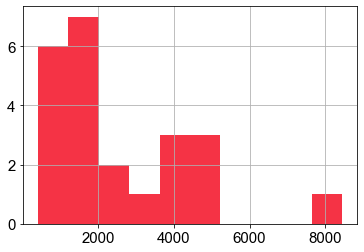

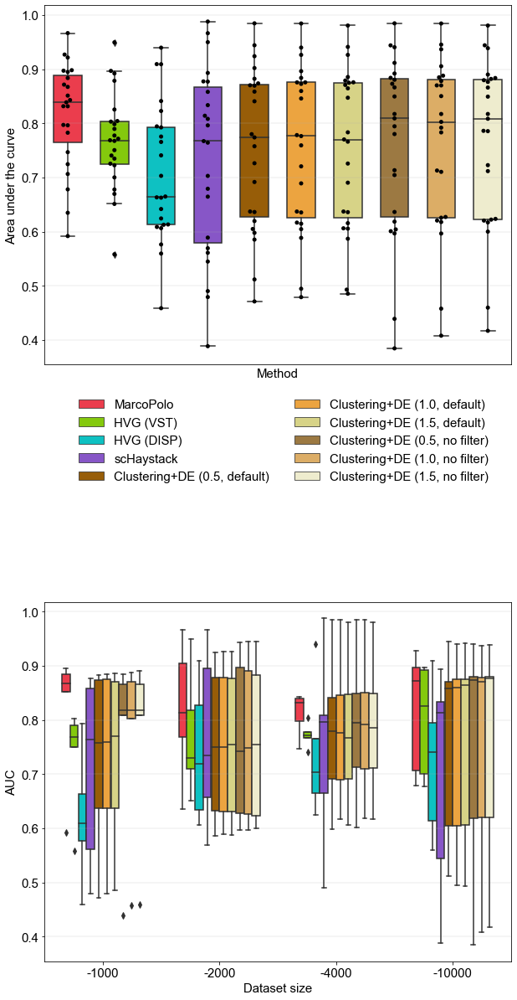

In [78]:
record_list_df_real=pd.DataFrame(record_list)
record_list_df_real

record_list_df_real['Area under the curve']=record_list_df_real['AUC']

record_list_df_real[~record_list_df_real['Dataset'].duplicated()]['num_cell'].hist()

record_list_df_real['Dataset size']=record_list_df_real['num_cell'].map(lambda x: 

                                                                        '-1000' if x<=1000 else                                                                        
                                                                        '-2000' if x<=2000 else
                                                                        '-4000' if x<=4000 else                                                                        
                                                                        '-10000').values


plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(10, 8+5+8)) 
gs=fig.add_gridspec(8+5+8,10)

fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.boxplot(x='Method',
            y='Area under the curve',
            data=record_list_df_real,
            palette=color_qual_7_3,
            width=0.6,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#fig_sub1.text(-0.1, 1.05, 'b', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Real Datasets')

leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.12, -0.45),
                   ncol=2
                   )#,fontsize=15)

fig_sub1.get_legend()._legend_box.align = "left"

fig_sub1.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

sns.swarmplot(x='Method',
            y='Area under the curve',
            data=record_list_df_real,
              
              color='black',
            ax=fig_sub1
           )


fig_sub1=fig.add_subplot(gs[8+5:16+5,0:10])

sns.boxplot(x='Dataset size',order=sorted(record_list_df_real['Dataset size'].unique(),key=lambda x: int(x.replace('-',''))),
            hue='Method',
            y='AUC',
            data=record_list_df_real[
                
                                     (~record_list_df_real['Method'].str.contains('no thres.'))
                                     
                
                
            ],
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )

fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#fig_sub1.set_title('Real Datasets')
"""
leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.15, 1.05),
                   ncol=2,
                   )#,fontsize=15)
"""
leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.05, 1.3),
                   ncol=2,
                   )#,fontsize=15)

In [79]:
record_list_df_real.groupby('Method').agg(np.median)

,num_marker,num_cell,num_gene,num_type,min_pop_size,cv,AUC,Precision,Recall (FPR),Recall,F-score,Area under the curve
Method,,,,,,,,,,,,
"Clustering+DE (0.5, default)",200,1697,7002,5,42,1.024717,0.774007,0.29,0.665,0.145,0.206667,0.774007
"Clustering+DE (0.5, no filter)",200,1697,7002,5,42,1.024717,0.809144,0.29,0.675,0.145,0.206667,0.809144
"Clustering+DE (1.0, default)",200,1697,7002,5,42,1.024717,0.776453,0.32,0.630,0.160,0.213333,0.776453
"Clustering+DE (1.0, no filter)",200,1697,7002,5,42,1.024717,0.802668,0.33,0.675,0.165,0.220000,0.802668
"Clustering+DE (1.5, default)",200,1697,7002,5,42,1.024717,0.770212,0.33,0.620,0.165,0.220000,0.770212
"Clustering+DE (1.5, no filter)",200,1697,7002,5,42,1.024717,0.808450,0.35,0.675,0.175,0.233333,0.808450
HVG (DISP),200,1697,7002,5,42,1.024717,0.664802,0.20,0.420,0.100,0.133333,0.664802
HVG (VST),200,1697,7002,5,42,1.024717,0.768684,0.25,0.585,0.125,0.166667,0.768684
MarcoPolo,200,1697,7002,5,42,1.024717,0.838862,0.29,0.730,0.155,0.206667,0.838862


In [80]:
fig.savefig('pub/real_auc_maxdiff_200.png', bbox_inches='tight')
fig.savefig('pub/real_auc_maxdiff_200.jpg', bbox_inches='tight')
fig.savefig('pub/real_auc_maxdiff_200.svg', bbox_inches='tight')

Kohinbulk_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
HumanLiver_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
Zhengmix8eq_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaAorta_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBladder_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBrainMyeloid_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBrainNonMyeloid_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaDiaphragm_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaFat_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


TabulaSpleen_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaThymus_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaTongue_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaTrachea_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter


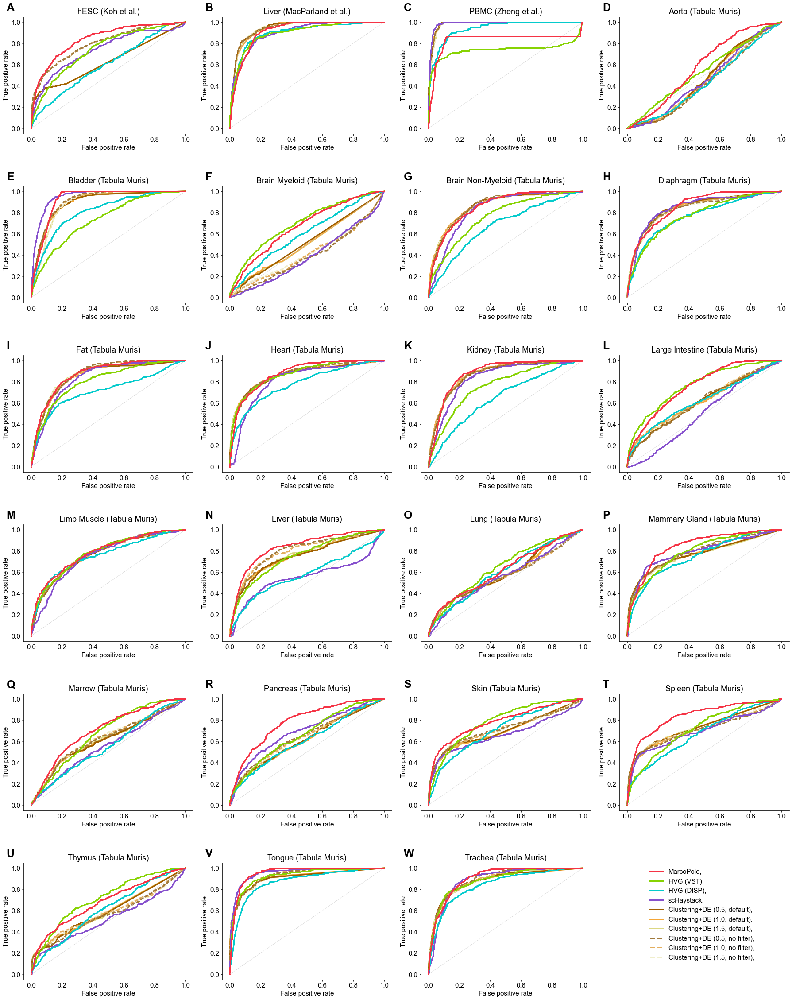

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [81]:
fig = plt.figure(figsize=((7+1)*4,(5+2)*6)) 
gs=fig.add_gridspec((5+2)*6,(7+1)*4)
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)

record_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')


    marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=300,lfc=2)          
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))

    fig_rocplot=fig.add_subplot(gs[7*(idx//4):7*(idx//4)+5,8*(idx%4):8*(idx%4)+7])
    #fig=plt.figure()
    #fig_rocplot=fig.add_subplot()
    fig_rocplot.text(-0.1, 1.05, 'abcdefghijklmnopqrstuvwxyz'[idx].upper(), fontproperties=font_prop(bold=True,size=25), transform=fig_rocplot.transAxes)
    
    fig_rocplot.set_xlabel('False positive rate')
    fig_rocplot.set_ylabel('True positive rate')
    
    fig_rocplot.plot(np.arange(0,1,0.01),np.arange(0,1,0.01),c=(0.8,0.8,0.8,0.8),linewidth=1.0,linestyle='--')
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    fig_rocplot.set_title(
        '{}'.format(dataset_name_mapper(dataset_name)))    
    for method in ['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]:
        print(method)
        score=load_score(dataset_name,method)
        auc=roc_auc_score(DE_bool,score)

        fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score)
        fpr_all, tpr_all, thresholds_all = metrics.roc_curve(DE_bool,score,drop_intermediate=False)
        

        fig_rocplot.plot(fpr,
                         tpr,
                         label='{method:}'.format(
                                                                method=method_mapper(method)+',',
                                                                AUC=auc),
                         linestyle='--' if 'without' in method else '-',
                         linewidth=3.0,
                         zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                        )
        
        
        #title()
        score_thres=sorted(score)[::-1][100]
        
        metric=get_metric(DE_bool,score>score_thres)
        
        #exp_data_row_confidencecheck=top_n_confidence(dataset_name,exp_data_row,6) 
        #score_check=pd.DataFrame([score,exp_data_row_confidencecheck]).T.sort_values(by=0,ascending=False)
        
        record_list.append({
            'Dataset':dataset_name_mapper(dataset_name),
            'num_marker':np.sum(DE_bool),
            'num_cell':len(exp_data_col),
            'num_gene':len(exp_data_row),
            'num_type':len(exp_data_meta['phenoid'].unique()),
            'min_pop_size':exp_data_meta['phenoid'].value_counts().values[-1],
            'cv':exp_data_meta['phenoid'].value_counts().std()/exp_data_meta['phenoid'].value_counts().mean(),
            'Method':method_mapper(method),
            'AUC':auc,
            'Precision':metric['precision'],
            'Recall (FPR)':tpr_all[fpr_all>0.2][0],
            'Recall':metric['recall'],
            'F-score':metric['F1'],
          
            
        })   
        
    """
            'confidence_50':score_check[1].iloc[:50].sum()/score_check[1].sum(),
            'confidence_100':score_check[1].iloc[:100].sum()/score_check[1].sum(),
            'confidence_200':score_check[1].iloc[:200].sum()/score_check[1].sum(),
            'confidence_300':score_check[1].iloc[:300].sum()/score_check[1].sum(),
            'confidence_400':score_check[1].iloc[:400].sum()/score_check[1].sum(),
            'confidence_500':score_check[1].iloc[:500].sum()/score_check[1].sum(),
            'confidence_600':score_check[1].iloc[:600].sum()/score_check[1].sum(),
            'confidence_700':score_check[1].iloc[:700].sum()/score_check[1].sum(),
            'confidence_800':score_check[1].iloc[:800].sum()/score_check[1].sum(),
            'confidence_900':score_check[1].iloc[:900].sum()/score_check[1].sum(),
            'confidence_1000':score_check[1].iloc[:1000].sum()/score_check[1].sum(),  
    
    
    """
        
    #if 'trachea' in dataset_name:
    if idx==len(dataset_name_all)-1:
        leg=fig_rocplot.legend(bbox_to_anchor=(2,1), fontsize=15)

        
    fig_rocplot.spines['right'].set_visible(False)
    fig_rocplot.spines['top'].set_visible(False)

    

In [82]:
fig.savefig('pub/real_roc_maxdiff_300.png', bbox_inches='tight')
fig.savefig('pub/real_roc_maxdiff_300.jpg', bbox_inches='tight')
fig.savefig('pub/real_roc_maxdiff_300.svg', bbox_inches='tight')

In [83]:
pd.DataFrame(record_list)#.groupby(['Dataset','Method']).mean()['AUC']
pd.DataFrame(record_list).pivot(index='Dataset', columns='Method', values='AUC')\
.loc[pd.Series(dataset_name_all).map(dataset_name_mapper)]\
[pd.Series(['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]).map(method_mapper)].round(3).to_csv('pub/real_roc_maxdiff_300.csv')

No handles with labels found to put in legend.


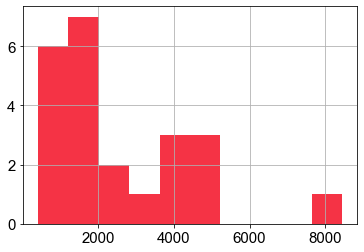

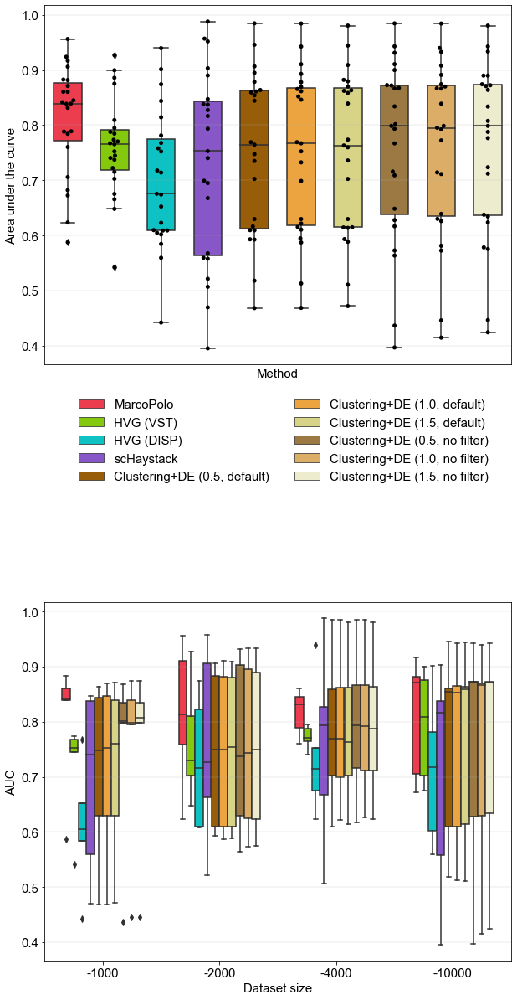

In [84]:
record_list_df_real=pd.DataFrame(record_list)
record_list_df_real

record_list_df_real['Area under the curve']=record_list_df_real['AUC']

record_list_df_real[~record_list_df_real['Dataset'].duplicated()]['num_cell'].hist()

record_list_df_real['Dataset size']=record_list_df_real['num_cell'].map(lambda x: 

                                                                        '-1000' if x<=1000 else                                                                        
                                                                        '-2000' if x<=2000 else
                                                                        '-4000' if x<=4000 else                                                                        
                                                                        '-10000').values


plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(10, 8+5+8)) 
gs=fig.add_gridspec(8+5+8,10)

fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.boxplot(x='Method',
            y='Area under the curve',
            data=record_list_df_real,
            palette=color_qual_7_3,
            width=0.6,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#fig_sub1.text(-0.1, 1.05, 'b', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Real Datasets')

leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.12, -0.45),
                   ncol=2
                   )#,fontsize=15)

fig_sub1.get_legend()._legend_box.align = "left"

fig_sub1.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

sns.swarmplot(x='Method',
            y='Area under the curve',
            data=record_list_df_real,
              
              color='black',
            ax=fig_sub1
           )


fig_sub1=fig.add_subplot(gs[8+5:16+5,0:10])

sns.boxplot(x='Dataset size',order=sorted(record_list_df_real['Dataset size'].unique(),key=lambda x: int(x.replace('-',''))),
            hue='Method',
            y='AUC',
            data=record_list_df_real[
                
                                     (~record_list_df_real['Method'].str.contains('no thres.'))
                                     
                
                
            ],
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )

fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#fig_sub1.set_title('Real Datasets')
"""
leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.15, 1.05),
                   ncol=2,
                   )#,fontsize=15)
"""
leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.05, 1.3),
                   ncol=2,
                   )#,fontsize=15)

In [85]:
fig.savefig('pub/real_auc_maxdiff_300.png', bbox_inches='tight')
fig.savefig('pub/real_auc_maxdiff_300.jpg', bbox_inches='tight')
fig.savefig('pub/real_auc_maxdiff_300.svg', bbox_inches='tight')

Kohinbulk_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
HumanLiver_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
Zhengmix8eq_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaAorta_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBladder_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBrainMyeloid_filtered
Mar

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


TabulaSpleen_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaThymus_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaTongue_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaTrachea_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter


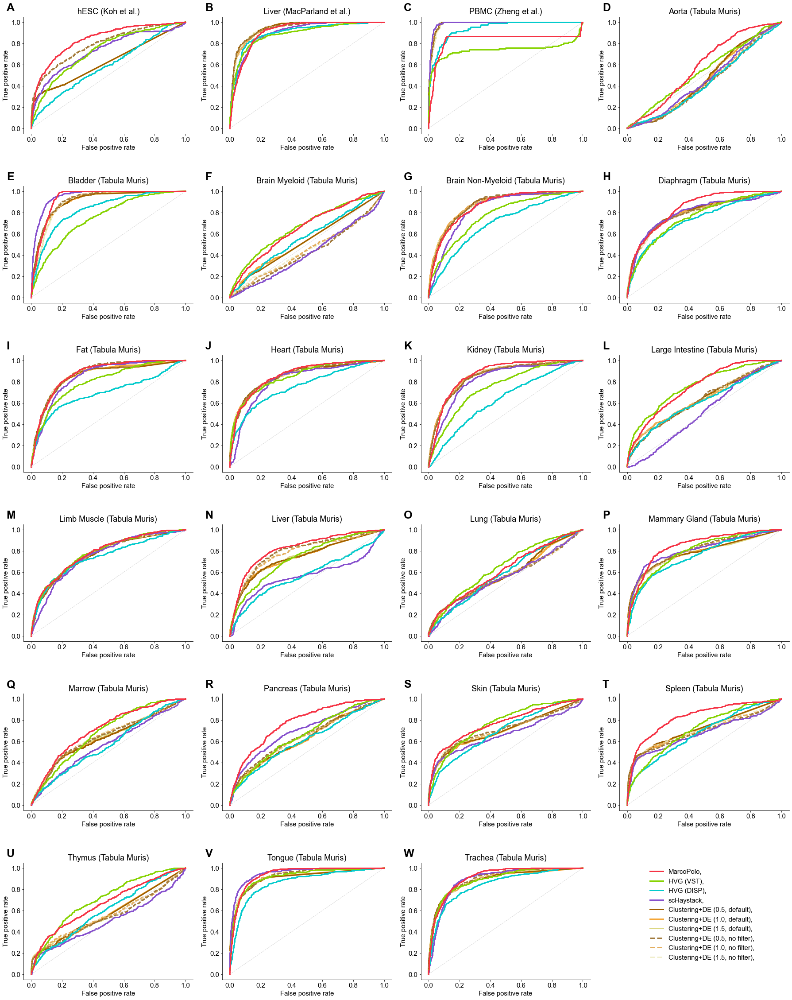

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [87]:
fig = plt.figure(figsize=((7+1)*4,(5+2)*6)) 
gs=fig.add_gridspec((5+2)*6,(7+1)*4)
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)

record_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')


    marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=400,lfc=2)          
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))

    fig_rocplot=fig.add_subplot(gs[7*(idx//4):7*(idx//4)+5,8*(idx%4):8*(idx%4)+7])
    #fig=plt.figure()
    #fig_rocplot=fig.add_subplot()
    fig_rocplot.text(-0.1, 1.05, 'abcdefghijklmnopqrstuvwxyz'[idx].upper(), fontproperties=font_prop(bold=True,size=25), transform=fig_rocplot.transAxes)
    
    fig_rocplot.set_xlabel('False positive rate')
    fig_rocplot.set_ylabel('True positive rate')
    
    fig_rocplot.plot(np.arange(0,1,0.01),np.arange(0,1,0.01),c=(0.8,0.8,0.8,0.8),linewidth=1.0,linestyle='--')
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    fig_rocplot.set_title(
        '{}'.format(dataset_name_mapper(dataset_name)))    
    for method in ['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]:
        print(method)
        score=load_score(dataset_name,method)
        auc=roc_auc_score(DE_bool,score)

        fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score)
        fpr_all, tpr_all, thresholds_all = metrics.roc_curve(DE_bool,score,drop_intermediate=False)
        

        fig_rocplot.plot(fpr,
                         tpr,
                         label='{method:}'.format(
                                                                method=method_mapper(method)+',',
                                                                AUC=auc),
                         linestyle='--' if 'without' in method else '-',
                         linewidth=3.0,
                         zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                        )
        
        
        #title()
        score_thres=sorted(score)[::-1][100]
        
        metric=get_metric(DE_bool,score>score_thres)
        
        #exp_data_row_confidencecheck=top_n_confidence(dataset_name,exp_data_row,6) 
        #score_check=pd.DataFrame([score,exp_data_row_confidencecheck]).T.sort_values(by=0,ascending=False)
        
        record_list.append({
            'Dataset':dataset_name_mapper(dataset_name),
            'num_marker':np.sum(DE_bool),
            'num_cell':len(exp_data_col),
            'num_gene':len(exp_data_row),
            'num_type':len(exp_data_meta['phenoid'].unique()),
            'min_pop_size':exp_data_meta['phenoid'].value_counts().values[-1],
            'cv':exp_data_meta['phenoid'].value_counts().std()/exp_data_meta['phenoid'].value_counts().mean(),
            'Method':method_mapper(method),
            'AUC':auc,
            'Precision':metric['precision'],
            'Recall (FPR)':tpr_all[fpr_all>0.2][0],
            'Recall':metric['recall'],
            'F-score':metric['F1'],
          
            
        })   
        
    """
            'confidence_50':score_check[1].iloc[:50].sum()/score_check[1].sum(),
            'confidence_100':score_check[1].iloc[:100].sum()/score_check[1].sum(),
            'confidence_200':score_check[1].iloc[:200].sum()/score_check[1].sum(),
            'confidence_300':score_check[1].iloc[:300].sum()/score_check[1].sum(),
            'confidence_400':score_check[1].iloc[:400].sum()/score_check[1].sum(),
            'confidence_500':score_check[1].iloc[:500].sum()/score_check[1].sum(),
            'confidence_600':score_check[1].iloc[:600].sum()/score_check[1].sum(),
            'confidence_700':score_check[1].iloc[:700].sum()/score_check[1].sum(),
            'confidence_800':score_check[1].iloc[:800].sum()/score_check[1].sum(),
            'confidence_900':score_check[1].iloc[:900].sum()/score_check[1].sum(),
            'confidence_1000':score_check[1].iloc[:1000].sum()/score_check[1].sum(),  
    
    
    """
        
    #if 'trachea' in dataset_name:
    if idx==len(dataset_name_all)-1:
        leg=fig_rocplot.legend(bbox_to_anchor=(2,1), fontsize=15)

        
    fig_rocplot.spines['right'].set_visible(False)
    fig_rocplot.spines['top'].set_visible(False)

    

In [88]:
fig.savefig('pub/real_roc_maxdiff_400.png', bbox_inches='tight')
fig.savefig('pub/real_roc_maxdiff_400.jpg', bbox_inches='tight')
fig.savefig('pub/real_roc_maxdiff_400.svg', bbox_inches='tight')

In [89]:
pd.DataFrame(record_list)#.groupby(['Dataset','Method']).mean()['AUC']
pd.DataFrame(record_list).pivot(index='Dataset', columns='Method', values='AUC')\
.loc[pd.Series(dataset_name_all).map(dataset_name_mapper)]\
[pd.Series(['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]).map(method_mapper)].round(3).to_csv('pub/real_roc_maxdiff_400.csv')

No handles with labels found to put in legend.


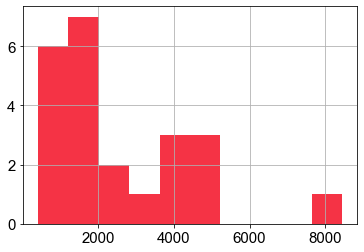

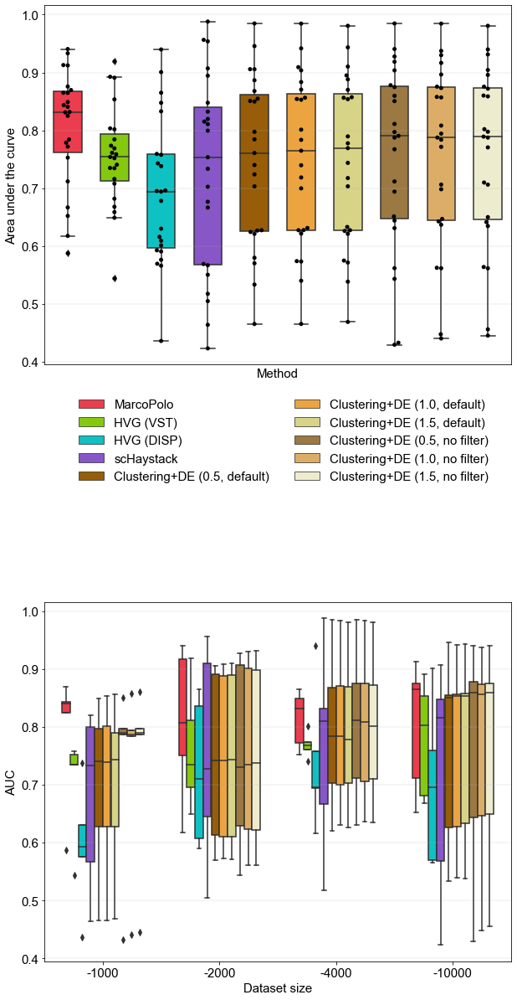

In [90]:
record_list_df_real=pd.DataFrame(record_list)
record_list_df_real

record_list_df_real['Area under the curve']=record_list_df_real['AUC']

record_list_df_real[~record_list_df_real['Dataset'].duplicated()]['num_cell'].hist()

record_list_df_real['Dataset size']=record_list_df_real['num_cell'].map(lambda x: 

                                                                        '-1000' if x<=1000 else                                                                        
                                                                        '-2000' if x<=2000 else
                                                                        '-4000' if x<=4000 else                                                                        
                                                                        '-10000').values


plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(10, 8+5+8)) 
gs=fig.add_gridspec(8+5+8,10)

fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.boxplot(x='Method',
            y='Area under the curve',
            data=record_list_df_real,
            palette=color_qual_7_3,
            width=0.6,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#fig_sub1.text(-0.1, 1.05, 'b', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Real Datasets')

leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.12, -0.45),
                   ncol=2
                   )#,fontsize=15)

fig_sub1.get_legend()._legend_box.align = "left"

fig_sub1.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

sns.swarmplot(x='Method',
            y='Area under the curve',
            data=record_list_df_real,
              
              color='black',
            ax=fig_sub1
           )


fig_sub1=fig.add_subplot(gs[8+5:16+5,0:10])

sns.boxplot(x='Dataset size',order=sorted(record_list_df_real['Dataset size'].unique(),key=lambda x: int(x.replace('-',''))),
            hue='Method',
            y='AUC',
            data=record_list_df_real[
                
                                     (~record_list_df_real['Method'].str.contains('no thres.'))
                                     
                
                
            ],
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )

fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#fig_sub1.set_title('Real Datasets')
"""
leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.15, 1.05),
                   ncol=2,
                   )#,fontsize=15)
"""
leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.05, 1.3),
                   ncol=2,
                   )#,fontsize=15)

In [91]:
fig.savefig('pub/real_auc_maxdiff_400.png', bbox_inches='tight')
fig.savefig('pub/real_auc_maxdiff_400.jpg', bbox_inches='tight')
fig.savefig('pub/real_auc_maxdiff_400.svg', bbox_inches='tight')

In [92]:
print(1)

1


Kohinbulk_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
HumanLiver_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
Zhengmix8eq_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaAorta_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBladder_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaBrainMyeloid_filtered
Mar

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


TabulaSpleen_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaThymus_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaTongue_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaTrachea_filtered
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter


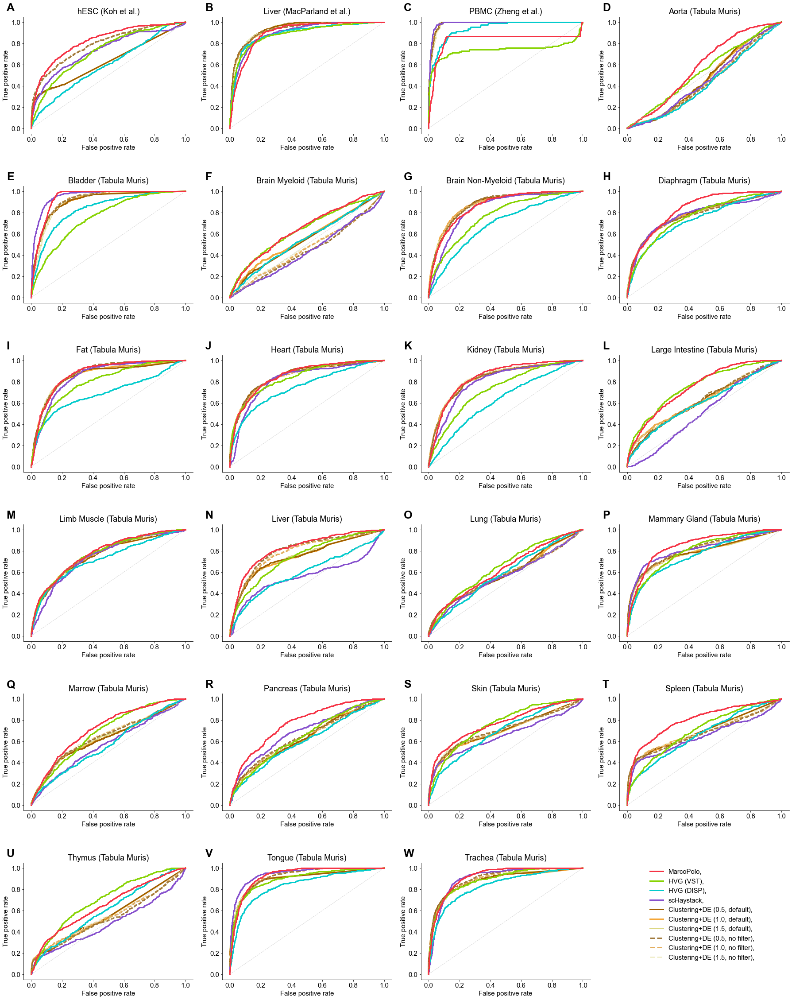

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [93]:
fig = plt.figure(figsize=((7+1)*4,(5+2)*6)) 
gs=fig.add_gridspec((5+2)*6,(7+1)*4)
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)

record_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')


    marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=500,lfc=2)          
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))

    fig_rocplot=fig.add_subplot(gs[7*(idx//4):7*(idx//4)+5,8*(idx%4):8*(idx%4)+7])
    #fig=plt.figure()
    #fig_rocplot=fig.add_subplot()
    fig_rocplot.text(-0.1, 1.05, 'abcdefghijklmnopqrstuvwxyz'[idx].upper(), fontproperties=font_prop(bold=True,size=25), transform=fig_rocplot.transAxes)
    
    fig_rocplot.set_xlabel('False positive rate')
    fig_rocplot.set_ylabel('True positive rate')
    
    fig_rocplot.plot(np.arange(0,1,0.01),np.arange(0,1,0.01),c=(0.8,0.8,0.8,0.8),linewidth=1.0,linestyle='--')
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    fig_rocplot.set_title(
        '{}'.format(dataset_name_mapper(dataset_name)))    
    for method in ['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]:
        print(method)
        score=load_score(dataset_name,method)
        auc=roc_auc_score(DE_bool,score)

        fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score)
        fpr_all, tpr_all, thresholds_all = metrics.roc_curve(DE_bool,score,drop_intermediate=False)
        

        fig_rocplot.plot(fpr,
                         tpr,
                         label='{method:}'.format(
                                                                method=method_mapper(method)+',',
                                                                AUC=auc),
                         linestyle='--' if 'without' in method else '-',
                         linewidth=3.0,
                         zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                        )
        
        
        #title()
        score_thres=sorted(score)[::-1][100]
        
        metric=get_metric(DE_bool,score>score_thres)
        
        #exp_data_row_confidencecheck=top_n_confidence(dataset_name,exp_data_row,6) 
        #score_check=pd.DataFrame([score,exp_data_row_confidencecheck]).T.sort_values(by=0,ascending=False)
        
        record_list.append({
            'Dataset':dataset_name_mapper(dataset_name),
            'num_marker':np.sum(DE_bool),
            'num_cell':len(exp_data_col),
            'num_gene':len(exp_data_row),
            'num_type':len(exp_data_meta['phenoid'].unique()),
            'min_pop_size':exp_data_meta['phenoid'].value_counts().values[-1],
            'cv':exp_data_meta['phenoid'].value_counts().std()/exp_data_meta['phenoid'].value_counts().mean(),
            'Method':method_mapper(method),
            'AUC':auc,
            'Precision':metric['precision'],
            'Recall (FPR)':tpr_all[fpr_all>0.2][0],
            'Recall':metric['recall'],
            'F-score':metric['F1'],
          
            
        })   
        
    """
            'confidence_50':score_check[1].iloc[:50].sum()/score_check[1].sum(),
            'confidence_100':score_check[1].iloc[:100].sum()/score_check[1].sum(),
            'confidence_200':score_check[1].iloc[:200].sum()/score_check[1].sum(),
            'confidence_300':score_check[1].iloc[:300].sum()/score_check[1].sum(),
            'confidence_400':score_check[1].iloc[:400].sum()/score_check[1].sum(),
            'confidence_500':score_check[1].iloc[:500].sum()/score_check[1].sum(),
            'confidence_600':score_check[1].iloc[:600].sum()/score_check[1].sum(),
            'confidence_700':score_check[1].iloc[:700].sum()/score_check[1].sum(),
            'confidence_800':score_check[1].iloc[:800].sum()/score_check[1].sum(),
            'confidence_900':score_check[1].iloc[:900].sum()/score_check[1].sum(),
            'confidence_1000':score_check[1].iloc[:1000].sum()/score_check[1].sum(),  
    
    
    """
        
    #if 'trachea' in dataset_name:
    if idx==len(dataset_name_all)-1:
        leg=fig_rocplot.legend(bbox_to_anchor=(2,1), fontsize=15)

        
    fig_rocplot.spines['right'].set_visible(False)
    fig_rocplot.spines['top'].set_visible(False)

    

In [94]:
fig.savefig('pub/real_roc_maxdiff_500.png', bbox_inches='tight')
fig.savefig('pub/real_roc_maxdiff_500.jpg', bbox_inches='tight')
fig.savefig('pub/real_roc_maxdiff_500.svg', bbox_inches='tight')

In [95]:
pd.DataFrame(record_list)#.groupby(['Dataset','Method']).mean()['AUC']
pd.DataFrame(record_list).pivot(index='Dataset', columns='Method', values='AUC')\
.loc[pd.Series(dataset_name_all).map(dataset_name_mapper)]\
[pd.Series(['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]).map(method_mapper)].round(3).to_csv('pub/real_roc_maxdiff_500.csv')        

No handles with labels found to put in legend.


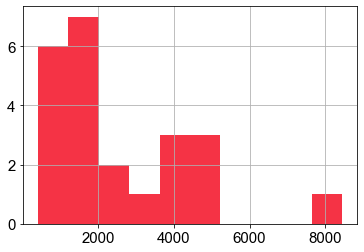

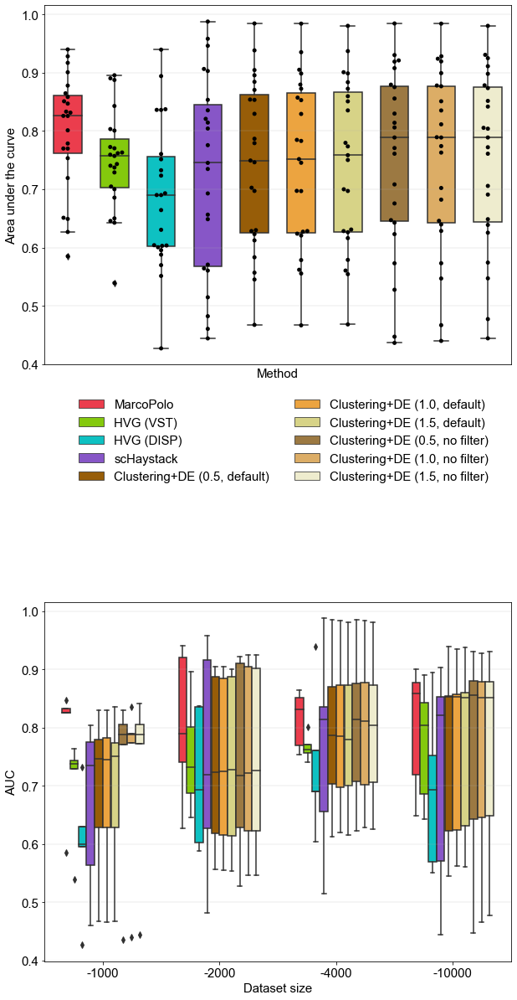

In [96]:
record_list_df_real=pd.DataFrame(record_list)
record_list_df_real

record_list_df_real['Area under the curve']=record_list_df_real['AUC']

record_list_df_real[~record_list_df_real['Dataset'].duplicated()]['num_cell'].hist()

record_list_df_real['Dataset size']=record_list_df_real['num_cell'].map(lambda x: 

                                                                        '-1000' if x<=1000 else                                                                        
                                                                        '-2000' if x<=2000 else
                                                                        '-4000' if x<=4000 else                                                                        
                                                                        '-10000').values


plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(10, 8+5+8)) 
gs=fig.add_gridspec(8+5+8,10)

fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.boxplot(x='Method',
            y='Area under the curve',
            data=record_list_df_real,
            palette=color_qual_7_3,
            width=0.6,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#fig_sub1.text(-0.1, 1.05, 'b', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Real Datasets')

leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.12, -0.45),
                   ncol=2
                   )#,fontsize=15)

fig_sub1.get_legend()._legend_box.align = "left"

fig_sub1.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

sns.swarmplot(x='Method',
            y='Area under the curve',
            data=record_list_df_real,
              
              color='black',
            ax=fig_sub1
           )


fig_sub1=fig.add_subplot(gs[8+5:16+5,0:10])

sns.boxplot(x='Dataset size',order=sorted(record_list_df_real['Dataset size'].unique(),key=lambda x: int(x.replace('-',''))),
            hue='Method',
            y='AUC',
            data=record_list_df_real[
                
                                     (~record_list_df_real['Method'].str.contains('no thres.'))
                                     
                
                
            ],
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )

fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#fig_sub1.set_title('Real Datasets')
"""
leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.15, 1.05),
                   ncol=2,
                   )#,fontsize=15)
"""
leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.05, 1.3),
                   ncol=2,
                   )#,fontsize=15)

In [97]:
fig.savefig('pub/real_auc_maxdiff_500.png', bbox_inches='tight')
fig.savefig('pub/real_auc_maxdiff_500.jpg', bbox_inches='tight')
fig.savefig('pub/real_auc_maxdiff_500.svg', bbox_inches='tight')

In [55]:
len(load_marker('HumanLiver_filtered',method='truelabel_maxdiff',num_genes=500,lfc=4))

500

In [95]:
for dataset_name in dataset_name_all:

    a=pd.read_csv("datasets/extract/{}.maxdiff.100.2.tsv".format(dataset_name),sep='\t')
    b=pd.read_csv("datasets/extract/{}.markerrho.100.2.tsv".format(dataset_name),sep='\t')
    
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]    
        
    print(dataset_name,
          a.set_index("Unnamed: 0").loc[b.columns[1:]]['0'].sort_values().iloc[0],
         len(a.set_index("Unnamed: 0").loc[b.columns[1:]])
         )

Kohinbulk_filtered 1.2050458580094154 100
HumanLiver_filtered 1.3205626106962922 100
Zhengmix8eq_filtered 0.3296472035341367 100
TabulaAorta_filtered 3.2101875530156523 100
TabulaBladder_filtered 3.453807773260461 100
TabulaBrainMyeloid_filtered 1.1438944108283051 100
TabulaBrainNonMyeloid_filtered 2.0022908650827578 100
TabulaDiaphragm_filtered 3.270285373714505 100
TabulaFat_filtered 2.855646413882507 100
TabulaHeart_filtered 2.469744525660908 100
TabulaKidney_filtered 3.785969151282583 100
TabulaLargeIntestine_filtered 2.011262135836927 100
TabulaLimbMuscle_filtered 2.810447014425521 100
TabulaLiver_filtered 2.806973417052988 100
TabulaLung_filtered 2.760080526536928 100
TabulaMammaryGland_filtered 2.748639007817134 100
TabulaMarrow_filtered 1.891005006510143 100
TabulaPancreas_filtered 2.574406850428593 100
TabulaSkin_filtered 1.4679931843962055 100
TabulaSpleen_filtered 2.603488835997067 100
TabulaThymus_filtered 2.7344921994492477 100
TabulaTongue_filtered 1.0154148961504068 100


In [107]:
np.log10(4)

0.6020599913279624

In [108]:
np.log10(2)

0.3010299956639812

# DB based

In [98]:
#'Embryoid body',
dataset_metadict={
'Kohinbulk_filtered':{'species':'human',
                      'tissue':['Embryonic stem cell','Primitive streak'],
                      'tissue_':['Embryo'],
                      'gene_format':'ensembl'                 
                     },
'HumanLiver_filtered':{'species':'human',
                      'tissue':['Liver'],
                       'tissue_':['Liver'],
                      'gene_format':'symbol'                 
                     },
'Zhengmix8eq_filtered':{'species':'human',
                      'tissue':['Peripheral blood'],
                      'tissue_':['Blood'],
                      'gene_format':'ensembl'                 
                     },
'TabulaAorta_filtered':{'species':'mouse',
                      'tissue':[],
                      'tissue_':[],
                      'gene_format':'symbol'                 
                     },
'TabulaBladder_filtered':{'species':'mouse',
                      'tissue':[],
                    'tissue_':['Urinary bladder'],
                      'gene_format':'symbol'                 
                     },
'TabulaBrainMyeloid_filtered':{'species':'mouse',
                      'tissue':[],
                       'tissue_':[],
                      'gene_format':'symbol'                 
                     },
'TabulaBrainNonMyeloid_filtered':{'species':'mouse',
                      'tissue':[],
                                  'tissue_':[],
                      'gene_format':'symbol'                 
                     },
'TabulaDiaphragm_filtered':{'species':'mouse',
                      'tissue':[],
                       'tissue_':[],
                      'gene_format':'symbol'                 
                     },
'TabulaFat_filtered':{'species':'mouse',
                      'tissue':[],
                      'tissue_':[],
                      'gene_format':'symbol'                 
                     },
'TabulaHeart_filtered':{'species':'mouse',
                      'tissue':['Heart'],
                        'tissue_':['Heart'],
                      'gene_format':'symbol'                 
                     },
'TabulaKidney_filtered':{'species':'mouse',
                      'tissue':['Kidney'],
                         'tissue_':['Kidney'],
                      'gene_format':'symbol'                 
                     },
'TabulaLargeIntestine_filtered':{'species':'mouse',
                      'tissue':[],
                       'tissue_':[],
                      'gene_format':'symbol'                 
                     },
'TabulaLimbMuscle_filtered':{'species':'mouse',
                      'tissue':['Muscle'],
                      'tissue_':['Skeletal muscle'],
                      'gene_format':'symbol'                 
                     },
'TabulaLiver_filtered':{'species':'mouse',
                      'tissue':['Liver'],
                        'tissue_':['Liver'],
                      'gene_format':'symbol'                 
                     },
'TabulaLung_filtered':{'species':'mouse',
                      'tissue':['Lung'],
                       'tissue_':['Lungs'],
                      'gene_format':'symbol'                 
                     },
'TabulaMammaryGland_filtered':{'species':'mouse',
                      'tissue':[],
                        'tissue_':['Mammary gland'],
                      'gene_format':'symbol'                 
                     },
'TabulaMarrow_filtered':{'species':'mouse',
                      'tissue':['Bone marrow'],
                         'tissue_':[],
                      'gene_format':'symbol'                 
                     },
'TabulaPancreas_filtered':{'species':'mouse',
                      'tissue':['Pancreas'],
                           'tissue_':['Pancreas'],
                      'gene_format':'symbol'                 
                     },
'TabulaSkin_filtered':{'species':'mouse',
                      'tissue':['Skin'],
                       'tissue_':[],
                      'gene_format':'symbol'                 
                     },
'TabulaSpleen_filtered':{'species':'mouse',
                      'tissue':['Spleen'],
                         'tissue_':[],
                      'gene_format':'symbol'                 
                     },
'TabulaThymus_filtered':{'species':'mouse',
                      'tissue':['Thymus'],
                         'tissue_':['Thymus'],
                      'gene_format':'symbol'                 
                     },
'TabulaTongue_filtered':{'species':'mouse',
                      'tissue':['Taste bud'],
                         'tissue_':[],
                      'gene_format':'symbol'                 
                     },
'TabulaTrachea_filtered':{'species':'mouse',
                      'tissue':['Trachea'],
                          'tissue_':[],
                      'gene_format':'symbol'                 
                     }

}   

In [99]:
dataset_meta_df=pd.DataFrame(dataset_metadict).T
dataset_meta_df.index=dataset_meta_df.index.map(dataset_name_mapper)
dataset_meta_df=dataset_meta_df.rename(columns={'tissue':'CellMarker','tissue_':'Panglao'})
dataset_meta_df['CellMarker']=dataset_meta_df['CellMarker'].astype(str).str.replace('[','').str.replace(']','').str.replace("'",'')
dataset_meta_df['Panglao']=dataset_meta_df['Panglao'].astype(str).str.replace('[','').str.replace(']','').str.replace("'",'')

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  after removing the cwd from sys.path.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  """


In [107]:
dataset_meta_df.iloc[:,:-1].to_csv("pub/marker_match.tsv",sep='\t')

In [108]:
dataset_metadict

{'Kohinbulk_filtered': {'species': 'human',
  'tissue': ['Embryonic stem cell', 'Primitive streak'],
  'tissue_': ['Embryo'],
  'gene_format': 'ensembl'},
 'HumanLiver_filtered': {'species': 'human',
  'tissue': ['Liver'],
  'tissue_': ['Liver'],
  'gene_format': 'symbol'},
 'Zhengmix8eq_filtered': {'species': 'human',
  'tissue': ['Peripheral blood'],
  'tissue_': ['Blood'],
  'gene_format': 'ensembl'},
 'TabulaAorta_filtered': {'species': 'mouse',
  'tissue': [],
  'tissue_': [],
  'gene_format': 'symbol'},
 'TabulaBladder_filtered': {'species': 'mouse',
  'tissue': [],
  'tissue_': ['Urinary bladder'],
  'gene_format': 'symbol'},
 'TabulaBrainMyeloid_filtered': {'species': 'mouse',
  'tissue': [],
  'tissue_': [],
  'gene_format': 'symbol'},
 'TabulaBrainNonMyeloid_filtered': {'species': 'mouse',
  'tissue': [],
  'tissue_': [],
  'gene_format': 'symbol'},
 'TabulaDiaphragm_filtered': {'species': 'mouse',
  'tissue': [],
  'tissue_': [],
  'gene_format': 'symbol'},
 'TabulaFat_filte

In [24]:
def load_marker(dataset_name,method='cellmarker',num_genes=100,lfc=2,type_list=None,debug=False):
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    if method=='cellmarker':
    
        #species,tissue,gene_format=dataset_metadict[dataset_name]
        
        if dataset_metadict[dataset_name]['species']=='human':
            marker_db=cellmarker_db_human
        elif dataset_metadict[dataset_name]['species']=='mouse':
            marker_db=cellmarker_db_mouse
        else:
            raise
        
        marker_db=marker_db[marker_db['cellType']=='Normal cell']
        
        
        if dataset_metadict[dataset_name]['gene_format']=='symbol':
            gene_col='geneSymbol_cleaned'
        elif dataset_metadict[dataset_name]['gene_format']=='ensembl':
            gene_col='ensembl_cleaned'            
        
        marker_db_select=marker_db[marker_db['tissueType'].map(lambda x: x in dataset_metadict[dataset_name]['tissue'])]
        
        #return marker_db_select
        print(marker_db_select['tissueType'].unique())
        #assert len(marker_db_select['tissueType'].unique())==1
        
        marker_flatten=[j.lower() for i in marker_db_select[gene_col] for j in i]
        
        marker_flatten=pd.Series(marker_flatten).value_counts()
        #marker_flatten=marker_flatten.sort_values()
        #marker_flatten=marker_flatten.sort_values()
        
        #print(marker_flatten.sort_values(),marker_flatten[marker_flatten>1])
        print(len(marker_flatten))
        marker_flatten=marker_flatten[marker_flatten>0].index
        print(len(marker_flatten))
        marker=[]
        for gene_name in exp_data_row:
            if gene_name.lower() in marker_flatten:
                marker.append(gene_name)
        print(len(marker))
        assert np.all(list(map(lambda x: x in exp_data_row, marker)))
        
    elif method=='panglao':
    
        #species,tissue,gene_format=dataset_metadict[dataset_name]
        
        if dataset_metadict[dataset_name]['species']=='human':
            marker_db=panglao_db_human
        elif dataset_metadict[dataset_name]['species']=='mouse':
            marker_db=panglao_db_mouse
        else:
            raise
        
        #marker_db=marker_db[marker_db['cellType']=='Normal cell']
        
        
        if dataset_metadict[dataset_name]['gene_format']=='symbol':
            gene_col='geneSymbol_cleaned'
        elif dataset_metadict[dataset_name]['gene_format']=='ensembl':
            gene_col='ensembl_cleaned'            
        
        marker_db_select=marker_db[marker_db['organ'].map(lambda x: x in dataset_metadict[dataset_name]['tissue_'])]
        #print(marker_db_select)
        #return marker_db_select
        print(marker_db_select['organ'].unique())
        #assert len(marker_db_select['tissueType'].unique())==1
        
        marker_flatten=[j.lower() for i in marker_db_select[gene_col] for j in i]
        
        marker_flatten=pd.Series(marker_flatten).value_counts()
        #marker_flatten=marker_flatten.sort_values()
        #marker_flatten=marker_flatten.sort_values()
        
        #print(marker_flatten.sort_values(),marker_flatten[marker_flatten>1])
        print(len(marker_flatten))
        marker_flatten=marker_flatten[marker_flatten>0].index
        print(len(marker_flatten))
        marker=[]
        for gene_name in exp_data_row:
            if gene_name.lower() in marker_flatten:
                marker.append(gene_name)
        print(len(marker))
        assert np.all(list(map(lambda x: x in exp_data_row, marker)))    
        
    elif method=='cellmarker_panglao':
        ##Cellmarker
        
        #species,tissue,gene_format=dataset_metadict[dataset_name]
        
        if dataset_metadict[dataset_name]['species']=='human':
            marker_db=cellmarker_db_human
        elif dataset_metadict[dataset_name]['species']=='mouse':
            marker_db=cellmarker_db_mouse
        else:
            raise
        
        marker_db=marker_db[marker_db['cellType']=='Normal cell']
        
        
        if dataset_metadict[dataset_name]['gene_format']=='symbol':
            gene_col='geneSymbol_cleaned'
        elif dataset_metadict[dataset_name]['gene_format']=='ensembl':
            gene_col='ensembl_cleaned'            
        
        marker_db_select=marker_db[marker_db['tissueType'].map(lambda x: x in dataset_metadict[dataset_name]['tissue'])]
        
        #return marker_db_select
        print(marker_db_select['tissueType'].unique())
        #assert len(marker_db_select['tissueType'].unique())==1
        
        marker_flatten_cellmarker=[j.lower() for i in marker_db_select[gene_col] for j in i]        
        
        
        ###Panglao
        #species,tissue,gene_format=dataset_metadict[dataset_name]
        
        if dataset_metadict[dataset_name]['species']=='human':
            marker_db=panglao_db_human
        elif dataset_metadict[dataset_name]['species']=='mouse':
            marker_db=panglao_db_mouse
        else:
            raise
        
        #marker_db=marker_db[marker_db['cellType']=='Normal cell']
        
        
        if dataset_metadict[dataset_name]['gene_format']=='symbol':
            gene_col='geneSymbol_cleaned'
        elif dataset_metadict[dataset_name]['gene_format']=='ensembl':
            gene_col='ensembl_cleaned'            
        
        marker_db_select=marker_db[marker_db['organ'].map(lambda x: x in dataset_metadict[dataset_name]['tissue_'])]
        #print(marker_db_select)
        #return marker_db_select
        print(marker_db_select['organ'].unique())
        #assert len(marker_db_select['tissueType'].unique())==1
        
        marker_flatten=[j.lower() for i in marker_db_select[gene_col] for j in i]
        marker_flatten=marker_flatten+marker_flatten_cellmarker
        
        if debug:
            return marker_flatten
        
        marker_flatten=pd.Series(marker_flatten).value_counts()
        #marker_flatten=marker_flatten.sort_values()
        #marker_flatten=marker_flatten.sort_values()
        
        #print(marker_flatten.sort_values(),marker_flatten[marker_flatten>1])
        print(len(marker_flatten))
        marker_flatten=marker_flatten[marker_flatten>1].index
        print(len(marker_flatten))
        marker=[]
        for gene_name in exp_data_row:
            if gene_name.lower() in marker_flatten:
                marker.append(gene_name)
        print(len(marker))
        assert np.all(list(map(lambda x: x in exp_data_row, marker)))            
        
        
    elif method=='truelabel_maxdiff':
        markerrho=pd.read_csv('datasets/extract/{}.markerrho.{}.{}.tsv'.format(dataset_name,num_genes,lfc),index_col=0,sep='\t')
        if type_list is not None:
            #pass
            markerrho=markerrho.loc[type_list]
            markerrho=markerrho.iloc[:,(markerrho.sum(axis=0)!=0).values]
            markerrho=markerrho.iloc[:,(markerrho.sum(axis=0)!=markerrho.shape[0]).values]
        marker=markerrho.columns.values
        
        assert np.all(list(map(lambda x: x in exp_data_row, marker)))
        
    elif method=='EVF':
        marker=pd.read_csv('datasets/extract/{}.nDiffEVF.tsv'.format(dataset_name),sep='\t',index_col=0)
        #print(marker)
        marker=marker[marker.iloc[:,0]!=0].index.astype(str).tolist()
        
    elif method=='wilcox':

        deg_result=pd.read_csv('datasets/extract/{}.realdeg.{}.tsv'.format(dataset_name,method),sep='\t',index_col=0)
        deg_result['avg_logFC_abs']=np.abs(deg_result['avg_logFC'])

        deg_result_sorted=deg_result.sort_values(['p_val','avg_logFC_abs'],ascending=[True,False])

        gene_list=[]
        for phenoid in deg_result_sorted['cluster'].unique():
            deg_result_sorted_cluster=deg_result_sorted[deg_result_sorted['cluster']==phenoid]
            #print(deg_result_sorted_cluster.iloc[:10])
            gene_list+=deg_result_sorted_cluster.iloc[:10]['gene'].values.tolist()

        top_gene=np.array(gene_list)
        _,idx=np.unique(top_gene,return_index=True)
        top_gene_unique=top_gene[np.sort(idx)]

        assert set(top_gene_unique).issubset(exp_data_row)  

        marker=top_gene_unique        
    
    elif method=='consensus':
        
        top_gene_unique_list=[]

        for method in ['wilcox','bimod','roc','t']:
            deg_result=pd.read_csv('datasets/extract/{}.realdeg.{}.tsv'.format(dataset_name,method),sep='\t',index_col=0)
            deg_result['avg_logFC_abs']=np.abs(deg_result['avg_logFC'])
            if method=='wilcox':
                deg_result_sorted=deg_result.sort_values(['p_val','avg_logFC_abs'],ascending=[True,False])
            elif method=='bimod':
                deg_result_sorted=deg_result.sort_values(['p_val','avg_logFC_abs'],ascending=[True,False])
            elif method=='roc':
                deg_result['myAUC_diff']=np.abs(deg_result['myAUC']-0.5)
                deg_result_sorted=deg_result.sort_values(['myAUC_diff','avg_logFC_abs'],ascending=[False,False])
            elif method=='t':
                deg_result_sorted=deg_result.sort_values(['p_val','avg_logFC_abs'],ascending=[True,False])

            gene_list=[]
            for phenoid in deg_result_sorted['cluster'].unique():
                deg_result_sorted_cluster=deg_result_sorted[deg_result_sorted['cluster']==phenoid]
                gene_list+=deg_result_sorted_cluster.iloc[:10]['gene'].values.tolist()

            top_gene=np.array(gene_list)
            _,idx=np.unique(top_gene,return_index=True)
            top_gene_unique=top_gene[np.sort(idx)]        

            top_gene_unique_list+=top_gene_unique.tolist()

            assert set(top_gene_unique).issubset(exp_data_row)  

        top_gene_unique_list_counts=pd.Series(top_gene_unique_list).value_counts()    
        top_gene_unique_list_counts=top_gene_unique_list_counts[top_gene_unique_list_counts>1]
        
        marker=top_gene_unique_list_counts.index.tolist()


    else:
        raise

    #print(sorted([int(i) for i in exp_data_row]))
    
    return marker

In [110]:
load_marker('Kohinbulk_filtered',method='panglao')          

['Embryo']
54
54
30


['ENSG00000176887',
 'ENSG00000117122',
 'ENSG00000143799',
 'ENSG00000135074',
 'ENSG00000241186',
 'ENSG00000072832',
 'ENSG00000039068',
 'ENSG00000138795',
 'ENSG00000119866',
 'ENSG00000164458',
 'ENSG00000096717',
 'ENSG00000112378',
 'ENSG00000049249',
 'ENSG00000111704',
 'ENSG00000119888',
 'ENSG00000087510',
 'ENSG00000167244',
 'ENSG00000204531',
 'ENSG00000184697',
 'ENSG00000181885',
 'ENSG00000107562',
 'ENSG00000172183',
 'ENSG00000165556',
 'ENSG00000171476',
 'ENSG00000113196',
 'ENSG00000148798',
 'ENSG00000157851',
 'ENSG00000144648',
 'ENSG00000137270',
 'ENSG00000106366']

# panglao

Kohinbulk_filtered
['Embryo']
54
54
30
MarcoPolo
vst
disp


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
HumanLiver_filtered
['Liver']
284
284
165
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
Zhengmix8eq_filtered
['Blood']
221
221
62
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaAorta_filtered
[]
0
0
0
TabulaBladder_filtered
['Urinary bladder']
11
11
7
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:73: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


disp
ht.pca
seurat,0_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:73: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:73: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:73: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence th

TabulaBrainMyeloid_filtered
[]
0
0
0
TabulaBrainNonMyeloid_filtered
[]
0
0
0
TabulaDiaphragm_filtered
[]
0
0
0
TabulaFat_filtered
[]
0
0
0
TabulaHeart_filtered
['Heart']
121
121
63
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaKidney_filtered
['Kidney']
409
409
225
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLargeIntestine_filtered
[]
0
0
0
TabulaLimbMuscle_filtered
['Skeletal muscle']
140
140
67
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:73: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,without_filter
TabulaLiver_filtered
['Liver']
271
271
144
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLung_filtered
['Lungs']
178
178
81
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaMammaryGland_filtered
['Mammary gland']
82
82
52
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaMarrow_filtered
[]
0
0
0
TabulaPancreas_filtered
['Pancreas']
297
297
122
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:73: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaSkin_filtered
[]
0
0
0
TabulaSpleen_filtered
[]
0
0
0
TabulaThymus_filtered
['Thymus']
20
20
14
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:73: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:73: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_l

disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaTongue_filtered
[]
0
0
0
TabulaTrachea_filtered
[]
0
0
0


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:73: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:73: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


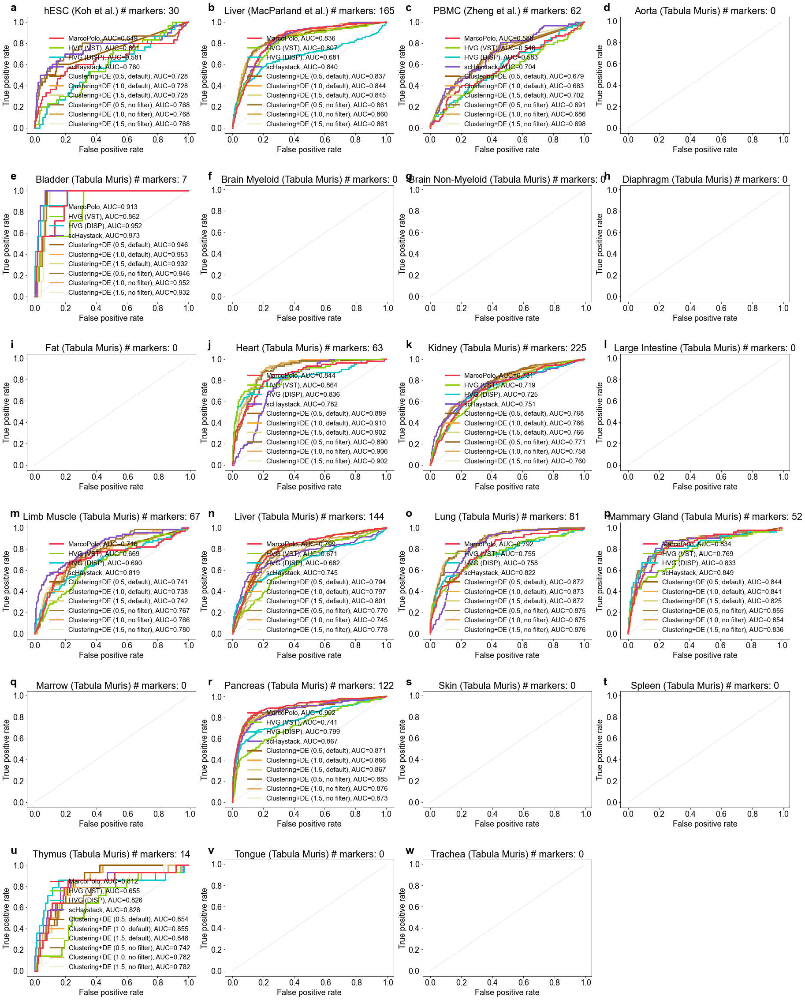

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [126]:
fig = plt.figure(figsize=((7+1)*4,(5+2)*6)) 
gs=fig.add_gridspec((5+2)*6,(7+1)*4)
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)

record_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])

fpr_list=[]
tpr_list=[]
thresholds_list=[]
tpr_dict={}

for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')


    marker=load_marker(dataset_name,method='panglao')          
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))

    fig_rocplot=fig.add_subplot(gs[7*(idx//4):7*(idx//4)+5,8*(idx%4):8*(idx%4)+7])
    #fig=plt.figure()
    #fig_rocplot=fig.add_subplot()
    fig_rocplot.text(-0.1, 1.05, 'abcdefghijklmnopqrstuvwxyz'[idx], fontproperties=font_prop(bold=True,size=25), transform=fig_rocplot.transAxes)
    
    fig_rocplot.set_xlabel('False positive rate')
    fig_rocplot.set_ylabel('True positive rate')
    
    fig_rocplot.plot(np.arange(0,1,0.01),np.arange(0,1,0.01),c=(0.8,0.8,0.8,0.8),linewidth=1.0,linestyle='--')
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    #fig_rocplot.set_title(
    #    '{}'.format(dataset_name_mapper(dataset_name))) 
    
    fig_rocplot.set_title(
        '{} # markers: {}'.format(dataset_name_mapper(dataset_name),sum(DE_bool)))        
    
    if sum(DE_bool)<=5:
        continue    
    for method in ['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]:
        print(method)
        score=load_score(dataset_name,method)
        auc=roc_auc_score(DE_bool,score)

        fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score)
        fpr_all, tpr_all, thresholds_all = metrics.roc_curve(DE_bool,score,drop_intermediate=False)
        
        fpr_list.append(fpr_all)
        tpr_list.append(tpr_all)
        thresholds_list.append(thresholds_all)
        tpr_dict[method]=tpr_dict.get(method,[])+[[tpr_all[fpr_all>=i][0] for i in np.linspace(0,1,100)]]
        #[[tpr_all[fpr_all>i][0] for i in np.arange(0,1,100)]]
        

        fig_rocplot.plot(fpr,
                         tpr,
                         label='{method:} AUC={AUC:.3f}'.format(
                                                                method=method_mapper(method)+',',
                                                                AUC=auc),
                         linestyle='--' if 'without' in method else '-',
                         linewidth=3.0,
                         zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                        )
        
        
        #title()
        score_thres=sorted(score)[::-1][100]
        
        metric=get_metric(DE_bool,score>score_thres)
        
        #exp_data_row_confidencecheck=top_n_confidence(dataset_name,exp_data_row,6) 
        #score_check=pd.DataFrame([score,exp_data_row_confidencecheck]).T.sort_values(by=0,ascending=False)
        
        record_list.append({
            'Dataset':dataset_name_mapper(dataset_name),
            'num_marker':np.sum(DE_bool),
            'num_cell':len(exp_data_col),
            'num_gene':len(exp_data_row),
            'num_type':len(exp_data_meta['phenoid'].unique()),
            'min_pop_size':exp_data_meta['phenoid'].value_counts().values[-1],
            'cv':exp_data_meta['phenoid'].value_counts().std()/exp_data_meta['phenoid'].value_counts().mean(),
            'Method':method_mapper(method),
            'AUC':auc,
            'Precision':metric['precision'],
            'Recall (FPR)':tpr_all[fpr_all>0.2][0],
            'Recall':metric['recall'],
            'F-score':metric['F1'],
          
            
        })   
        
    """
            'confidence_50':score_check[1].iloc[:50].sum()/score_check[1].sum(),
            'confidence_100':score_check[1].iloc[:100].sum()/score_check[1].sum(),
            'confidence_200':score_check[1].iloc[:200].sum()/score_check[1].sum(),
            'confidence_300':score_check[1].iloc[:300].sum()/score_check[1].sum(),
            'confidence_400':score_check[1].iloc[:400].sum()/score_check[1].sum(),
            'confidence_500':score_check[1].iloc[:500].sum()/score_check[1].sum(),
            'confidence_600':score_check[1].iloc[:600].sum()/score_check[1].sum(),
            'confidence_700':score_check[1].iloc[:700].sum()/score_check[1].sum(),
            'confidence_800':score_check[1].iloc[:800].sum()/score_check[1].sum(),
            'confidence_900':score_check[1].iloc[:900].sum()/score_check[1].sum(),
            'confidence_1000':score_check[1].iloc[:1000].sum()/score_check[1].sum(),  
    
    
    """
        
    leg=fig_rocplot.legend(loc='lower right',fontsize=15)

        
    fig_rocplot.spines['right'].set_visible(False)
    fig_rocplot.spines['top'].set_visible(False)

    

In [60]:
np.arange(0,1,100)

array([0])

In [119]:
fig.savefig('pub/real_roc_panglao1.png', bbox_inches='tight')
fig.savefig('pub/real_roc_panglao1.jpg', bbox_inches='tight')
fig.savefig('pub/real_roc_panglao1.svg', bbox_inches='tight')

12
12
12
12
12
12
12
12
12
12


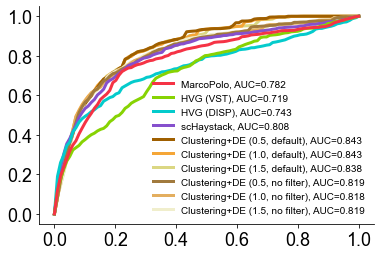

In [127]:
fig=plt.figure()

fig_rocplot=fig.add_subplot(1,1,1)

for method in ['MarcoPolo','vst','disp','ht.pca',
               'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
               'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
               ]:
    tpr_average=np.array(tpr_dict[method]).mean(axis=0)
    auc=np.sum(tpr_average)/100
    print(len(tpr_dict[method]))
    fig_rocplot.plot(np.linspace(0,1,100),
                     tpr_average,
                     label='{method:} AUC={AUC:.3f}'.format(
                                                            method=method_mapper(method)+',',
                                                            AUC=auc),
                     linewidth=3.0,
                     zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                    )
leg=fig_rocplot.legend(loc='lower right',fontsize=10)


fig_rocplot.spines['right'].set_visible(False)
fig_rocplot.spines['top'].set_visible(False)    

ENSG00000213719    0.483093
ENSG00000135404    0.483112
ENSG00000179144    0.485022
ENSG00000133321    0.485316
ENSG00000185201    0.491851
                     ...   
ENSG00000100453    2.456935
ENSG00000011600    2.572420
ENSG00000163220    3.038399
ENSG00000143546    3.678063
ENSG00000085265         inf
Name: 0, Length: 81, dtype: float64

In [66]:
b

,Unnamed: 0,ENSG00000251562,ENSG00000177954,ENSG00000087086,ENSG00000162244,ENSG00000118181,ENSG00000133112,ENSG00000167996,ENSG00000122406,ENSG00000168028,...,ENSG00000180644,ENSG00000170458,ENSG00000159674,ENSG00000156738,ENSG00000150045,ENSG00000172116,ENSG00000203747,ENSG00000100450,ENSG00000100721,ENSG00000254709
0,b.cells,1,1,0,1,1,1,0,1,1,...,0,0,0,1,0,0,0,0,1,1
1,cd14.monocytes,0,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
2,cd4.t.helper,1,1,0,1,1,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
3,cd56.nk,1,1,0,1,1,1,0,1,1,...,1,0,1,0,1,0,1,1,0,0
4,memory.t,1,1,0,1,1,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
5,naive.cytotoxic,1,1,0,1,1,1,0,1,1,...,0,0,0,0,0,1,0,0,0,0
6,naive.t,1,1,0,1,1,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
7,regulatory.t,1,1,0,1,1,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0


In [61]:
b

,Unnamed: 0,0
0,ENSG00000251562,0.333335
1,ENSG00000167526,0.213585
2,ENSG00000140988,0.151569
3,ENSG00000147403,0.168843
4,ENSG00000142541,0.119398
...,...,...
4709,ENSG00000253626,0.365800
4710,ENSG00000147162,0.237837
4711,ENSG00000166046,0.399247
4712,ENSG00000133027,0.163857


In [31]:
record_list_df_real = pd.DataFrame(record_list)
record_list_df_real

,Dataset,num_marker,num_cell,num_gene,num_type,min_pop_size,cv,Method,AUC,Precision,Recall (FPR),Recall,F-score
0,hESC (Koh et al.),500,446,14694,8,22,0.299496,MarcoPolo,0.825914,0.45,0.694,0.090,0.150000
1,hESC (Koh et al.),500,446,14694,8,22,0.299496,HVG (VST),0.728998,0.27,0.518,0.054,0.090000
2,hESC (Koh et al.),500,446,14694,8,22,0.299496,HVG (DISP),0.595493,0.18,0.330,0.036,0.060000
3,hESC (Koh et al.),500,446,14694,8,22,0.299496,scHaystack,0.683289,0.45,0.554,0.090,0.150000
4,hESC (Koh et al.),500,446,14694,8,22,0.299496,"Clustering+DE (0.5, default)",0.628295,0.58,0.408,0.116,0.193333
...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (1.0, default)",0.879747,0.78,0.818,0.156,0.260000
226,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (1.5, default)",0.883881,0.75,0.820,0.150,0.250000
227,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (0.5, no filter)",0.908026,0.80,0.840,0.160,0.266667
228,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (1.0, no filter)",0.899457,0.78,0.834,0.156,0.260000


<AxesSubplot:>

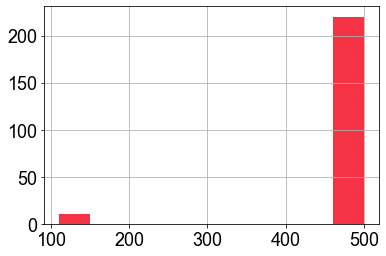

In [32]:
record_list_df_real['num_marker'].hist()

In [36]:
cellmarker_db_human['tissueType'].unique()

array(['Kidney', 'Liver', 'Endometrium', 'Germ', 'Corneal epithelium',
       'Placenta', 'Periosteum', 'Amniotic membrane', 'Primitive streak',
       'Adipose tissue', 'Scalp', 'Heart', 'Chorionic villus', 'Brain',
       'Amniotic fluid', 'Cartilage', 'Bone', 'Retina',
       'Peripheral blood', 'Blood', 'Tongue', 'Gingiva', 'Undefined',
       'Uterus', 'Dental pulp', 'Breast', 'Stomach', 'Nucleus pulposus',
       'Urine', 'Pancreas', 'Colon', 'Gonad', 'Testis', 'Bone marrow',
       'Lung', 'Embryo', 'Skin', 'Thymus', 'Blood vessel',
       'Synovial fluid', 'Periodontal ligament', 'Lymph node',
       'Colorectum', 'Pancreatic islet', 'Synovium', 'Oral mucosa',
       'Skeletal muscle', 'Eye', 'Esophagus', 'Umbilical cord blood',
       'Hair follicle', 'Ovarian follicle', 'Limbal epithelium',
       'Oral cavity', 'Nasal concha', 'Oviduct', 'Cornea',
       'Sclerocorneal tissue', 'Intervertebral disc', 'Plasma',
       'Embryoid body', 'Inferior colliculus', 'Ovary', 'Ovarian 

In [80]:
cellmarker_db_human.loc[cellmarker_db_human['tissueType'].map(lambda x: x in ['Embryonic brain',
                                                                                        'Embryonic stem cell',
                                                                                        'Embryonic prefrontal cortex',
                                                                                        'Embryoid body',
                                                                                        'Embryo'])]['cellType']

85      Normal cell
284     Normal cell
495     Normal cell
598     Normal cell
603     Normal cell
           ...     
4112    Normal cell
4114    Normal cell
4116    Normal cell
4118    Normal cell
4120    Normal cell
Name: cellType, Length: 73, dtype: object

In [37]:
panglao_db['germ layer'].unique()

array(['Endoderm', 'Mesoderm', 'Ectoderm', nan, 'Epiblast', 'Zygote',
       'mesoderm', 'Trophoblast'], dtype=object)

In [35]:
panglao_db['organ'].unique()

array(['Pancreas', 'Connective tissue', 'Brain', 'Lungs', 'Smooth muscle',
       'Immune system', 'Epithelium', 'Heart', 'Liver', 'Adrenal glands',
       'GI tract', 'Reproductive', 'Kidney', 'Zygote', 'Vasculature',
       'Embryo', 'Blood', 'Thyroid', nan, 'Bone', 'Skin', 'Mammary gland',
       'Eye', 'Skeletal muscle', 'Olfactory system', 'Parathyroid glands',
       'Oral cavity', 'Thymus', 'Placenta', 'Urinary bladder'],
      dtype=object)

In [163]:
len(load_marker('HumanLiver_filtered',method='wilcox'))

101

In [164]:
len(load_marker('HumanLiver_filtered',method='consensus'))

70

In [30]:
dataset_name='HumanLiver_filtered';method='roc'

In [213]:
cellmarker_db_human[cellmarker_db_human['tissueType']=='Primitive streak']

,speciesType,tissueType,UberonOntologyID,cancerType,cellType,cellName,CellOntologyID,cellMarker,geneSymbol,geneID,proteinName,proteinID,markerResource,PMID,Company,geneSymbol_cleaned,ensembl_cleaned
8,Human,Primitive streak,UBERON_0004341,Normal,Normal cell,Primitive streak cell,NaN,"LHX1, MIXL1","LHX1, MIXL1","3975, 83881","LHX1, MIXL1","P48742, Q9H2W2",Experiment,16258519,NaN,"[LHX1, MIXL1]","[ENSG00000273706, ENSG00000185155]"


# cellmarker

Kohinbulk_filtered
['Primitive streak' 'Embryonic stem cell']
31
31
22
MarcoPolo
vst
disp


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
HumanLiver_filtered
['Liver']
604
604
381
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
Zhengmix8eq_filtered
['Peripheral blood']
409
409
229
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaAorta_filtered
[]
0
0
0
TabulaBladder_filtered
[]
0
0
0
TabulaBrainMyeloid_filtered
[]
0
0
0
TabulaBrainNonMyeloid_filtered
[]
0
0
0
TabulaDiaphragm_filtered
[]
0
0
0
TabulaFat_filtered


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future v

[]
0
0
0
TabulaHeart_filtered
['Heart']
47
47
37
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaKidney_filtered
['Kidney']
1495
1495
950
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLargeIntestine_filtered
[]
0
0
0
TabulaLimbMuscle_filtered
['Muscle']
18
18
12
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


disp


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLiver_filtered
['Liver']
74
74
39
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLung_filtered
['Lung']
1374
1374
747
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaMammaryGland_filtered
[]
0
0
0
TabulaMarrow_filtered
['Bone marrow']
1073
1073
439
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaPancreas_filtered
['Pancreas']
15
15
9
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaSkin_filtered
['Skin']
12
12
7
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


TabulaSpleen_filtered
['Spleen']
541
541
444
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaThymus_filtered
['Thymus']
15
15
11
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


TabulaTongue_filtered
['Taste bud']
8
8
0
TabulaTrachea_filtered
['Trachea']
1811
1811
727
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter


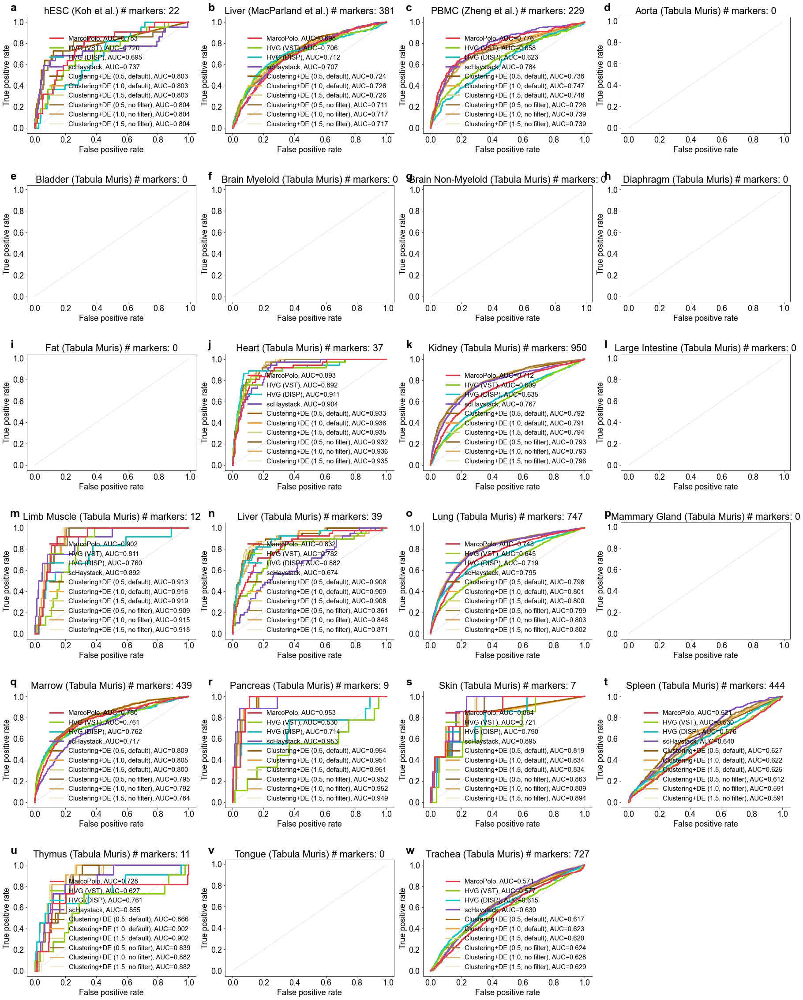

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [129]:
record_list_marker=[]

fig = plt.figure(figsize=((7+1)*4,(5+2)*6)) 
gs=fig.add_gridspec((5+2)*6,(7+1)*4)
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)


fpr_list=[]
tpr_list=[]
thresholds_list=[]
tpr_dict={}

for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')


    #marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=500,lfc=2)          
    marker=load_marker(dataset_name,method='cellmarker')
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))
    #print(sum(DE_bool))
    fig_rocplot=fig.add_subplot(gs[7*(idx//4):7*(idx//4)+5,8*(idx%4):8*(idx%4)+7])
    #fig=plt.figure()
    #fig_rocplot=fig.add_subplot()
    fig_rocplot.text(-0.1, 1.05, 'abcdefghijklmnopqrstuvwxyz'[idx], fontproperties=font_prop(bold=True,size=25), transform=fig_rocplot.transAxes)
    
    fig_rocplot.set_xlabel('False positive rate')
    fig_rocplot.set_ylabel('True positive rate')
    
    fig_rocplot.plot(np.arange(0,1,0.01),np.arange(0,1,0.01),c=(0.8,0.8,0.8,0.8),linewidth=1.0,linestyle='--')
    
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    #fig_rocplot.set_title(
    #    '{}'.format(dataset_name_mapper(dataset_name)))  
    fig_rocplot.set_title(
        '{} # markers: {}'.format(dataset_name_mapper(dataset_name),sum(DE_bool)))    
    if sum(DE_bool)<=5:
        continue
    for method in ['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]:
        print(method)
        score=load_score(dataset_name,method)
        auc=roc_auc_score(DE_bool,score)

        fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score)
        fpr_all, tpr_all, thresholds_all = metrics.roc_curve(DE_bool,score,drop_intermediate=False)
        
        
        fpr_list.append(fpr_all)
        tpr_list.append(tpr_all)
        thresholds_list.append(thresholds_all)
        tpr_dict[method]=tpr_dict.get(method,[])+[[tpr_all[fpr_all>=i][0] for i in np.linspace(0,1,100)]]        

        fig_rocplot.plot(fpr,
                         tpr,
                         label='{method:} AUC={AUC:.3f}'.format(
                                                                method=method_mapper(method)+',',
                                                                AUC=auc),
                         linestyle='--' if 'without' in method else '-',
                         linewidth=3.0,
                         zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                        )
        
        
        #title()
        score_thres=sorted(score)[::-1][100]
        
        metric=get_metric(DE_bool,score>score_thres)
        
        #exp_data_row_confidencecheck=top_n_confidence(dataset_name,exp_data_row,6) 

        
        record_list_marker.append({
            'Dataset':dataset_name_mapper(dataset_name),
            'num_marker':np.sum(DE_bool),
            'num_cell':len(exp_data_col),
            'num_gene':len(exp_data_row),
            'num_type':len(exp_data_meta['phenoid'].unique()),
            'min_pop_size':exp_data_meta['phenoid'].value_counts().values[-1],
            'cv':exp_data_meta['phenoid'].value_counts().std()/exp_data_meta['phenoid'].value_counts().mean(),
            'Method':method_mapper(method),
            'AUC':auc,
            'Precision':metric['precision'],
            'Recall (FPR)':tpr_all[fpr_all>0.2][0],
            'Recall':metric['recall'],
            'F-score':metric['F1'],
          
            
        })   
        
        leg=fig_rocplot.legend(loc='lower right',fontsize=15)


        fig_rocplot.spines['right'].set_visible(False)
        fig_rocplot.spines['top'].set_visible(False)        

In [36]:
fig.savefig('pub/real_roc_cellmarker.png', bbox_inches='tight')
fig.savefig('pub/real_roc_cellmarker.jpg', bbox_inches='tight')
fig.savefig('pub/real_roc_cellmarker.svg', bbox_inches='tight')

14
14
14
14
14
14
14
14
14
14


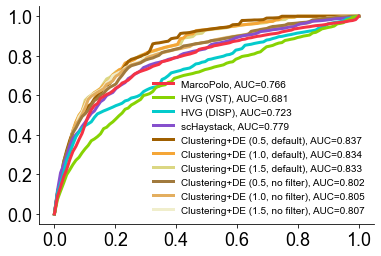

In [130]:
fig=plt.figure()

fig_rocplot=fig.add_subplot(1,1,1)

for method in ['MarcoPolo','vst','disp','ht.pca',
               'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
               'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
               ]:
    tpr_average=np.array(tpr_dict[method]).mean(axis=0)
    auc=np.sum(tpr_average)/100
    print(len(tpr_dict[method]))
    fig_rocplot.plot(np.linspace(0,1,100),
                     tpr_average,
                     label='{method:} AUC={AUC:.3f}'.format(
                                                            method=method_mapper(method)+',',
                                                            AUC=auc),
                     linewidth=3.0,
                     zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                    )
leg=fig_rocplot.legend(loc='lower right',fontsize=10)


fig_rocplot.spines['right'].set_visible(False)
fig_rocplot.spines['top'].set_visible(False)    

In [48]:
dataset_name_all

['Kohinbulk_filtered',
 'HumanLiver_filtered',
 'Zhengmix8eq_filtered',
 'TabulaAorta_filtered',
 'TabulaBladder_filtered',
 'TabulaBrainMyeloid_filtered',
 'TabulaBrainNonMyeloid_filtered',
 'TabulaDiaphragm_filtered',
 'TabulaFat_filtered',
 'TabulaHeart_filtered',
 'TabulaKidney_filtered',
 'TabulaLargeIntestine_filtered',
 'TabulaLimbMuscle_filtered',
 'TabulaLiver_filtered',
 'TabulaLung_filtered',
 'TabulaMammaryGland_filtered',
 'TabulaMarrow_filtered',
 'TabulaPancreas_filtered',
 'TabulaSkin_filtered',
 'TabulaSpleen_filtered',
 'TabulaThymus_filtered',
 'TabulaTongue_filtered',
 'TabulaTrachea_filtered']

,0
HBM,3.316855
HBD,2.776700
IGHG2,2.671612
IGHG3,2.648743
IGHG1,2.473689
...,...
PCOLCE,1.341561
MEG3,1.339980
SLC25A37,1.334188
APOH,1.322860


In [66]:
a,b

(     Unnamed: 0         0
 0        MT-CO1  0.064384
 1        MT-CO2  0.175581
 2        MT-CO3  0.078044
 3        MT-ND4  0.074717
 4       MT-ATP6  0.068590
 ...         ...       ...
 5997   IQCH-AS1  0.402425
 5998       XPO6  0.494996
 5999       ERI3  0.154942
 6000      PARP4  0.194813
 6001     AKAP11  0.515335
 
 [6002 rows x 2 columns],
                 Unnamed: 0  HP  APOC3  ORM1  APOA2  APOC1  APOA1  FGB  TF  \
 0           Cholangiocytes   0      0     0      0      0      0    0   0   
 1          Erythroid cells   0      0     0      0      0      0    0   0   
 2   Hepatic Stellate Cells   0      0     0      0      0      0    0   0   
 3              Hepatocytes   1      1     1      1      1      1    1   1   
 4                    LSECs   0      0     0      0      0      0    0   0   
 5              Macrophages   0      0     0      0      0      0    0   0   
 6           Mature B cells   0      0     0      0      0      0    0   0   
 7                 NK ce

# cellmarker / panglao

Kohinbulk_filtered
['Primitive streak' 'Embryonic stem cell']
['Embryo']
84
9
6
HumanLiver_filtered
['Liver']
['Liver']
834
115
66
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
Zhengmix8eq_filtered
['Peripheral blood']
['Blood']
592
144
70
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaAorta_filtered
[]
[]
0
0
0
TabulaBladder_filtered
[]
['Urinary bladder']
11
0
0
TabulaBrainMyeloid_filtered
[]
[]
0
0
0
TabulaBrainNonMyeloid_filtered
[]
[]
0
0
0
TabulaDiaphragm_filtered
[]
[]
0
0
0
TabulaFat_filtered
[]
[]
0
0
0
TabulaHeart_filtered
['Heart']
['Heart']
154
27
18
MarcoPolo


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:147: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:147: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:147: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:147: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a futu

vst
disp
ht.pca


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaKidney_filtered
['Kidney']
['Kidney']
1654
352
237
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLargeIntestine_filtered
[]
[]
0
0
0
TabulaLimbMuscle_filtered
['Muscle']
['Skeletal muscle']
152
25
15
MarcoPolo
vst


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:147: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


disp
ht.pca
seurat,0_5,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,with_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,with_filter
seurat,0_5,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_0,without_filter


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


seurat,1_5,without_filter
TabulaLiver_filtered
['Liver']
['Liver']
320
49
23
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaLung_filtered
['Lung']
['Lungs']
1479
272
175
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaMammaryGland_filtered
[]
['Mammary gland']
82
6
5
TabulaMarrow_filtered
['Bone marrow']
[]
1073
187
108
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaPancreas_filtered
['Pancreas']
['Pancreas']
302
41
29
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaSki

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter
TabulaThymus_filtered
['Thymus']
['Thymus']
31
4
3
TabulaTongue_filtered
['Taste bud']
[]
8
0
0
TabulaTrachea_filtered
['Trachea']
[]
1811
327
91
MarcoPolo
vst
disp
ht.pca
seurat,0_5,with_filter
seurat,1_0,with_filter
seurat,1_5,with_filter
seurat,0_5,without_filter
seurat,1_0,without_filter
seurat,1_5,without_filter


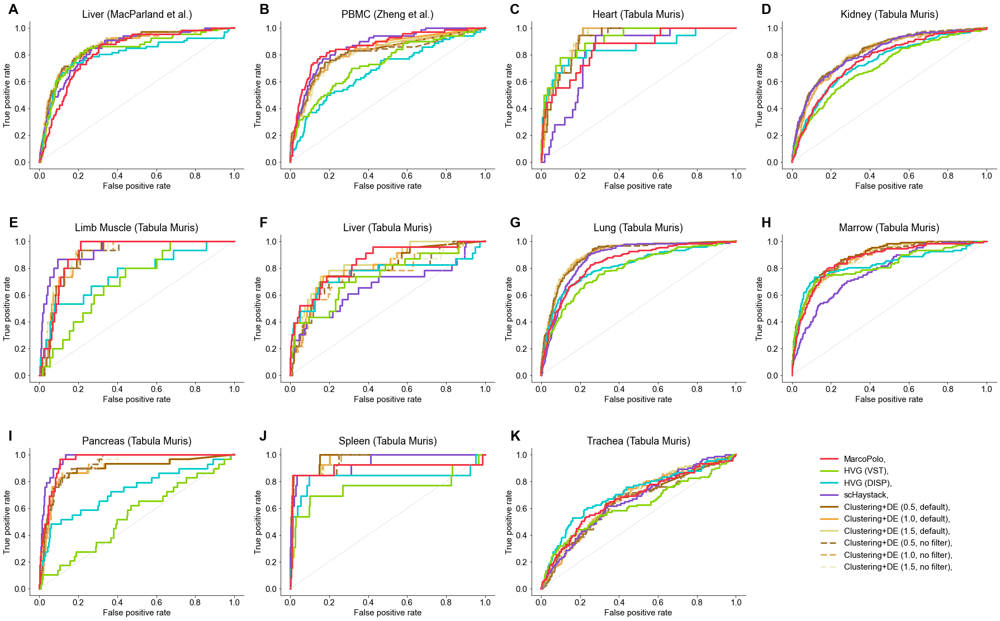

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [102]:
record_list_marker=[]

fig = plt.figure(figsize=((7+1)*4,(5+2)*6)) 
gs=fig.add_gridspec((5+2)*6,(7+1)*4)
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)


fpr_list=[]
tpr_list=[]
thresholds_list=[]
tpr_dict={}

idx_count=0
for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')


    #marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=500,lfc=2)          
    marker=load_marker(dataset_name,method='cellmarker_panglao')
    #arker=marker1+marker2
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))
    if sum(DE_bool)<=10:
        continue    
    #print(sum(DE_bool))
    fig_rocplot=fig.add_subplot(gs[7*(idx_count//4):7*(idx_count//4)+5,8*(idx_count%4):8*(idx_count%4)+7])
    #fig=plt.figure()
    #fig_rocplot=fig.add_subplot()
    fig_rocplot.text(-0.1, 1.05, 'abcdefghijklmnopqrstuvwxyz'[idx_count].upper(), fontproperties=font_prop(bold=True,size=25), transform=fig_rocplot.transAxes)
    
    fig_rocplot.set_xlabel('False positive rate')
    fig_rocplot.set_ylabel('True positive rate')
    
    fig_rocplot.plot(np.arange(0,1,0.01),np.arange(0,1,0.01),c=(0.8,0.8,0.8,0.8),linewidth=1.0,linestyle='--')
    
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    fig_rocplot.set_title(
        '{}'.format(dataset_name_mapper(dataset_name)))  
    #fig_rocplot.set_title(
    #    '{} # markers: {}'.format(dataset_name_mapper(dataset_name),sum(DE_bool)))    

    
    for method in ['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]:
        print(method)
        score=load_score(dataset_name,method)
        auc=roc_auc_score(DE_bool,score)

        fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score)
        fpr_all, tpr_all, thresholds_all = metrics.roc_curve(DE_bool,score,drop_intermediate=False)
        
        
        fpr_list.append(fpr_all)
        tpr_list.append(tpr_all)
        thresholds_list.append(thresholds_all)
        tpr_dict[method]=tpr_dict.get(method,[])+[[tpr_all[fpr_all>=i][0] for i in np.linspace(0,1,100)]]        

        fig_rocplot.plot(fpr,
                         tpr,
                         label='{method:}'.format(
                                                                method=method_mapper(method)+',',
                                                                AUC=auc),
                         linestyle='--' if 'without' in method else '-',
                         linewidth=3.0,
                         zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                        )
        
        
        #title()
        score_thres=sorted(score)[::-1][100]
        
        metric=get_metric(DE_bool,score>score_thres)
        
        #exp_data_row_confidencecheck=top_n_confidence(dataset_name,exp_data_row,6) 

        
        record_list_marker.append({
            'Dataset':dataset_name_mapper(dataset_name),
            'num_marker':np.sum(DE_bool),
            'num_cell':len(exp_data_col),
            'num_gene':len(exp_data_row),
            'num_type':len(exp_data_meta['phenoid'].unique()),
            'min_pop_size':exp_data_meta['phenoid'].value_counts().values[-1],
            'cv':exp_data_meta['phenoid'].value_counts().std()/exp_data_meta['phenoid'].value_counts().mean(),
            'Method':method_mapper(method),
            'AUC':auc,
            'Precision':metric['precision'],
            'Recall (FPR)':tpr_all[fpr_all>0.2][0],
            'Recall':metric['recall'],
            'F-score':metric['F1'],
          
            
        })   
        
        #leg=fig_rocplot.legend(loc='lower right',fontsize=15)
        #if 'trachea' in dataset_name:
        if idx==len(dataset_name_all)-1:
            leg=fig_rocplot.legend(bbox_to_anchor=(2,1), fontsize=15)        


        fig_rocplot.spines['right'].set_visible(False)
        fig_rocplot.spines['top'].set_visible(False)        
    idx_count+=1

In [132]:
marker1

['Gsn',
 'Fth1',
 'Dcn',
 'Junb',
 'Rplp0',
 'Anxa2',
 'Lmna',
 'Cd9',
 'Cd81',
 'Dusp1',
 'Nr4a1',
 'Rpl4',
 'Igfbp7',
 'Rpl18a',
 'Calm2',
 'Calm1',
 'Gnas',
 'Anxa1',
 'Rpl13',
 'Rps3',
 'Tuba1a',
 'Sat1',
 'Hsp90aa1',
 'Id3',
 'Ahnak',
 'Ly6a',
 'Pmp22',
 'Rps14',
 'S100a6',
 'Ppia',
 'Rps5',
 'Rps2',
 'Tmem59',
 'Mxra8',
 'Rpl7',
 'Ifrd1',
 'Ubc',
 'Rpl8',
 'Rps18',
 'Ecm1',
 'Aplp2',
 'Tubb6',
 'Jund',
 'Icam1',
 'Rps19',
 'Rps4x',
 'Bhlhe40',
 'Crip2',
 'Tuba1c',
 'Tuba1b',
 'Emp1',
 'Ptma',
 'Oat',
 'Iqgap1',
 'Tspo',
 'Atp1b3',
 'Klf6',
 'Cd47',
 'Mfge8',
 'Rpl9',
 'Tppp3',
 'Tubb4b',
 'Dynll1',
 'Pcolce',
 'Tubb5',
 'Serpine2',
 'Pttg1ip',
 'Rnh1',
 'Atp6ap2',
 'Pnp',
 'Clic1',
 'Hmgb1',
 'Glul',
 'Xbp1',
 'Cpe',
 'Pam',
 'Fn1',
 'Rpl23',
 'Fhl1',
 'Ly6c1',
 'Ptges3',
 'Colec12',
 'Serinc1',
 'Txndc5',
 'Gas6',
 'Sgk1',
 'Cd44',
 'Tm4sf1',
 'Rps10',
 'Capg',
 'Mtch1',
 'Pgrmc1',
 'Rps8',
 'Anapc5',
 'Gsk3b',
 'Abi3bp',
 'Ywhah',
 'Vapa',
 'Sh3bgrl3',
 'Nrp1',
 'H2afz',
 'Hexb

In [103]:
fig.savefig('pub/real_roc_cellmarker_panglao.png', bbox_inches='tight')
fig.savefig('pub/real_roc_cellmarker_panglao.jpg', bbox_inches='tight')
fig.savefig('pub/real_roc_cellmarker_panglao.svg', bbox_inches='tight')

In [106]:
pd.DataFrame(record_list_marker)#.groupby(['Dataset','Method']).mean()['AUC']
pd.DataFrame(record_list_marker).pivot(index='Dataset', columns='Method', values='AUC')\
[pd.Series(['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]).map(method_mapper)].round(3).to_csv('pub/real_roc_cellmarker_panglao.csv')   

No handles with labels found to put in legend.


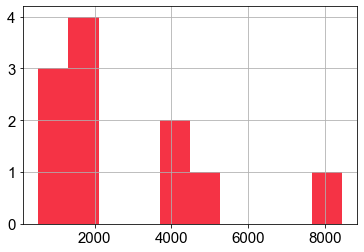

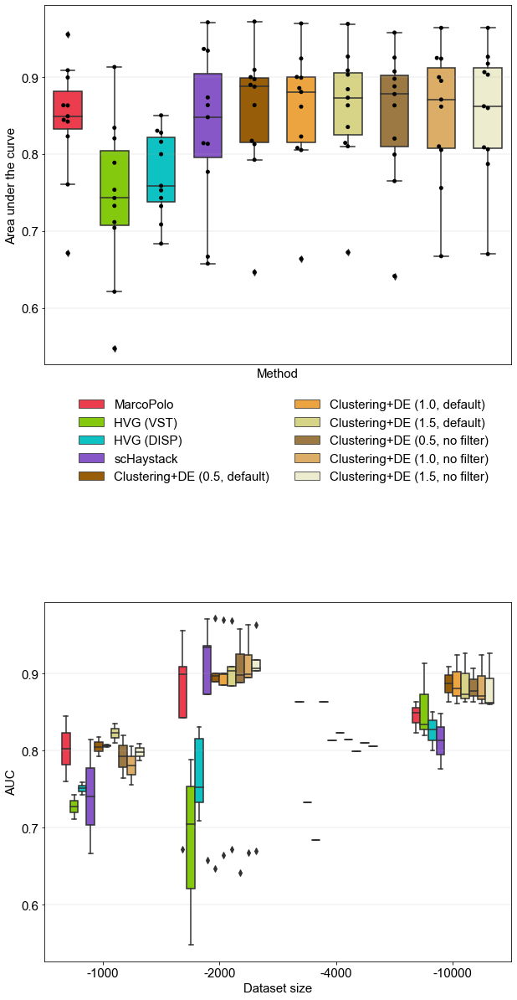

In [107]:
record_list_df_real=pd.DataFrame(record_list_marker)
record_list_df_real

record_list_df_real['Area under the curve']=record_list_df_real['AUC']

record_list_df_real[~record_list_df_real['Dataset'].duplicated()]['num_cell'].hist()

record_list_df_real['Dataset size']=record_list_df_real['num_cell'].map(lambda x: 

                                                                        '-1000' if x<=1000 else                                                                        
                                                                        '-2000' if x<=2000 else
                                                                        '-4000' if x<=4000 else                                                                        
                                                                        '-10000').values


plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(10, 8+5+8)) 
gs=fig.add_gridspec(8+5+8,10)

fig_sub1=fig.add_subplot(gs[0:8,0:10])

sns.boxplot(x='Method',
            y='Area under the curve',
            data=record_list_df_real,
            palette=color_qual_7_3,
            width=0.6,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#fig_sub1.text(-0.1, 1.05, 'b', fontproperties=font_prop(bold=True,size=25), transform=fig_sub1.transAxes)
#fig_sub1.set_title('Real Datasets')

leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.12, -0.45),
                   ncol=2
                   )#,fontsize=15)

fig_sub1.get_legend()._legend_box.align = "left"

fig_sub1.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

sns.swarmplot(x='Method',
            y='Area under the curve',
            data=record_list_df_real,
              
              color='black',
            ax=fig_sub1
           )


fig_sub1=fig.add_subplot(gs[8+5:16+5,0:10])

sns.boxplot(x='Dataset size',order=sorted(record_list_df_real['Dataset size'].unique(),key=lambda x: int(x.replace('-',''))),
            hue='Method',
            y='AUC',
            data=record_list_df_real[
                
                                     (~record_list_df_real['Method'].str.contains('no thres.'))
                                     
                
                
            ],
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )

fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#fig_sub1.set_title('Real Datasets')
"""
leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.15, 1.05),
                   ncol=2,
                   )#,fontsize=15)
"""
leg=fig_sub1.legend(loc='lower left',
                   bbox_to_anchor=(0.05, 1.3),
                   ncol=2,
                   )#,fontsize=15)

In [108]:
fig.savefig('pub/real_auc_cellmarker_panglao.png', bbox_inches='tight')
fig.savefig('pub/real_auc_cellmarker_panglao.jpg', bbox_inches='tight')
fig.savefig('pub/real_auc_cellmarker_panglao.svg', bbox_inches='tight')

11
11
11
11
11
11
11
11
11
11


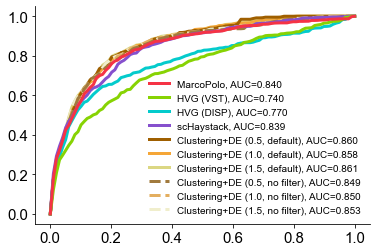

In [176]:
fig=plt.figure()

fig_rocplot=fig.add_subplot(1,1,1)

for method in ['MarcoPolo','vst','disp','ht.pca',
               'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
               'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
               ]:
    tpr_average=np.array(tpr_dict[method]).mean(axis=0)
    auc=np.sum(tpr_average)/100
    print(len(tpr_dict[method]))
    fig_rocplot.plot(np.linspace(0,1,100),
                     tpr_average,
                     label='{method:} AUC={AUC:.3f}'.format(
                                                            method=method_mapper(method)+',',
                                                            AUC=auc),
                     linewidth=3.0,
                     linestyle='--' if 'without' in method else '-',
                     zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                    )
leg=fig_rocplot.legend(loc='lower right',fontsize=10)


fig_rocplot.spines['right'].set_visible(False)
fig_rocplot.spines['top'].set_visible(False)    

In [185]:
datasets_meta_dict

NameError: name 'datasets_meta_dict' is not defined

In [64]:
load_marker(dataset_name,method='truelabel_maxdiff',num_genes=100,lfc=2,type_list=None,debug=False)

array(['HP', 'APOC3', 'ORM1', 'APOA2', 'APOC1', 'APOA1', 'FGB', 'TF',
       'HPX', 'APOH', 'CYP2E1', 'MAT1A', 'TAT', 'GC', 'SERPINC1', 'C9',
       'HSD17B6', 'CPS1', 'PLG', 'SAA4', 'SPINK1', 'CYP2C9', 'IGKC',
       'HAMP', 'CYP3A4', 'TAT-AS1', 'APOA5', 'F2', 'APOC2', 'HBB',
       'PRAP1', 'CYP8B1', 'UGT2B4', 'MASP2', 'HULC', 'BHMT', 'TM4SF4',
       'ANGPTL3', 'S100A9', 'C1QA', 'SERPINA4', 'CYP2D6', 'TTC36', 'C1QB',
       'AIF1', 'S100A8', 'HBA2', 'LYZ', 'GYPC', 'CYP2B6', 'IGLC2', 'BCHE',
       'JCHAIN', 'HBA1', 'IGHM', 'IGHA1', 'RP11-434D9.1', 'RBP5', 'CD163',
       'DEFB1', 'C1QC', 'CYP2A6', 'IGHG1', 'IGLC3', 'MZB1', 'TRBC1',
       'MS4A7', 'SLC25A37', 'IGHG3', 'MARCO', 'IGHG4', 'VSIG4', 'ANXA4',
       'C7', 'MPEG1', 'MGP', 'IGHG2', 'CLEC7A', 'FCN1', 'HBD', 'S100A12',
       'IGHA2', 'INMT', 'CD5L', 'TAGLN', 'SRPX', 'VWF', 'DERL3', 'LGALS4',
       'AHSP', 'CA1', 'PTGDS', 'HBM', 'CD79A', 'NR2F1', 'TNFRSF17',
       'ALAS2', 'PCOLCE', 'MEG3', 'ELF3'], dtype=object)

['Primitive streak' 'Embryonic stem cell']
['Embryo']
84
9
6
['Liver']
['Liver']
834
115
66
['Liver']
['Liver']
834
na        27
krt19     13
acta2     13
cd3g      12
cd3e      12
          ..
zbed2      1
tmem98     1
dusp1      1
cfh        1
crem       1
Length: 834, dtype: int64
66
66


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


['Peripheral blood']
['Blood']
592
144
70
['Peripheral blood']
['Blood']
592
ensg00000010610    30
ensg00000081237    27
ensg00000203747    26
ensg00000162747    25
ensg00000139193    25
                   ..
ensg00000117602     1
ensg00000122223     1
ensg00000262246     1
ensg00000135821     1
ensg00000204628     1
Length: 592, dtype: int64
70
70


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


[]
[]
0
0
0
[]
['Urinary bladder']
11
0
0
[]
[]
0
0
0
[]
[]
0
0
0
[]
[]
0
0
0
[]
[]
0
0
0
['Heart']
['Heart']
154
27
18
['Heart']
['Heart']
154
itga6     3
actc1     3
itga1     3
myh6      3
tnnc1     3
         ..
trdn      1
bdnf      1
sorbs2    1
hey2      1
dmd       1
Length: 154, dtype: int64
18
18


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:147: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:147: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:147: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:147: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a futu

['Kidney']
['Kidney']
1654
352
237
['Kidney']
['Kidney']
1654
na        72
clcnkb     5
aqp2       4
avpr2      4
ctgf       4
          ..
noct       1
efemp2     1
riok3      1
timp2      1
cpsf4l     1
Length: 1654, dtype: int64
237
237


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


[]
[]
0
0
0
['Muscle']
['Skeletal muscle']
152
25
15
['Muscle']
['Skeletal muscle']
152
pax7      15
myf5       5
cdh15      4
met        4
pax3       3
          ..
pdgfra     1
nfatc2     1
six4       1
myd88      1
heyl       1
Length: 152, dtype: int64
15
15


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:147: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


['Liver']
['Liver']
320
49
23
['Liver']
['Liver']
320
afp      7
cd3d     6
cd3e     6
cd3g     6
alb      5
        ..
fosl1    1
kcnn2    1
c1qa     1
gck      1
gc       1
Length: 320, dtype: int64
23
23


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


['Lung']
['Lungs']
1479
272
175
['Lung']
['Lungs']
1479
na         39
scgb1a1    14
acta2      12
adgre1      8
itgam       7
           ..
cecr2       1
mmrn2       1
atp8a1      1
frem2       1
frk         1
Length: 1479, dtype: int64
175
175


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


[]
['Mammary gland']
82
6
5
['Bone marrow']
[]
1073
187
108
['Bone marrow']
[]
1073
na               328
ly6a              29
kit               26
ptprc             22
cd34              20
                ... 
p2rx1              1
il6                1
5830408b19rik      1
glipr1l1           1
csf2rb2            1
Length: 1073, dtype: int64
108
108


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


['Pancreas']
['Pancreas']
302
41
29
['Pancreas']
['Pancreas']
302
pdx1       7
nkx2-2     4
pax6       4
scgn       4
arx        4
          ..
cxcl2      1
s100a10    1
vtcn1      1
sfrp2      1
edaradd    1
Length: 302, dtype: int64
29
29


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


['Skin']
[]
12
0
0
['Spleen']
[]
541
25
13
['Spleen']
[]
541
na        108
cd3d       15
cd3g       14
cd3e       14
ly6g        8
         ... 
emg1        1
trim8       1
alkbh6      1
cxcr3       1
rps20       1
Length: 541, dtype: int64
13
13


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


['Thymus']
['Thymus']
31
4
3
['Taste bud']
[]
8
0
0
['Trachea']
[]
1811
327
91
['Trachea']
[]
1811
na               137
ptp4a3             2
meis2              2
ttc12              2
ankrd66            2
                ... 
elavl4             1
tuba1c             1
8430408g22rik      1
ebpl               1
aldh3b2            1
Length: 1811, dtype: int64
91
91


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


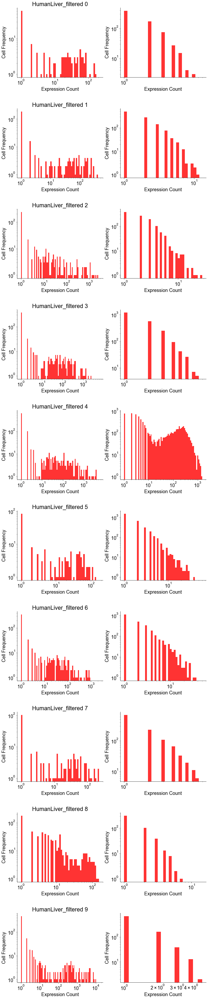

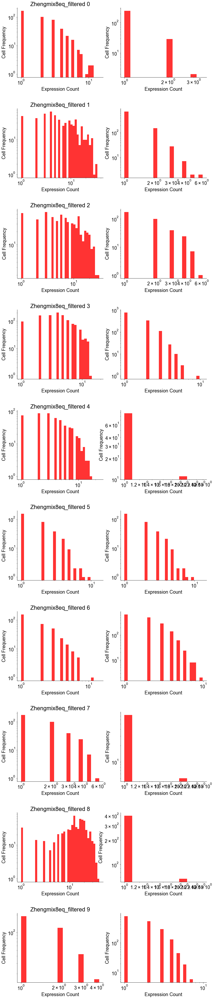

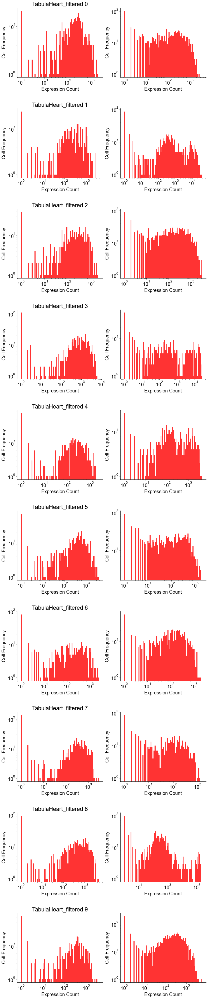

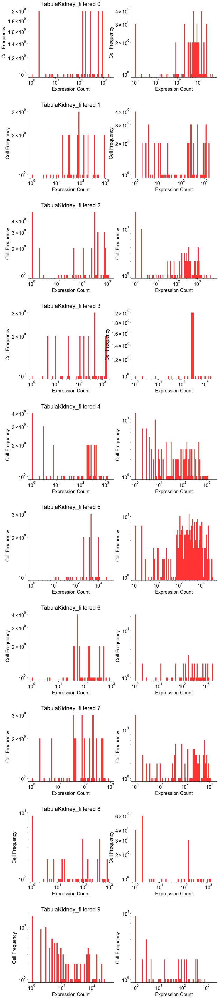

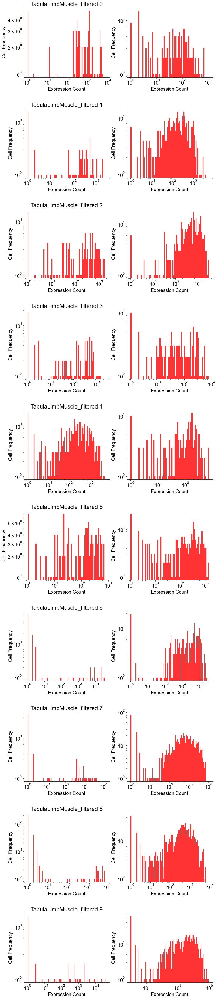

...

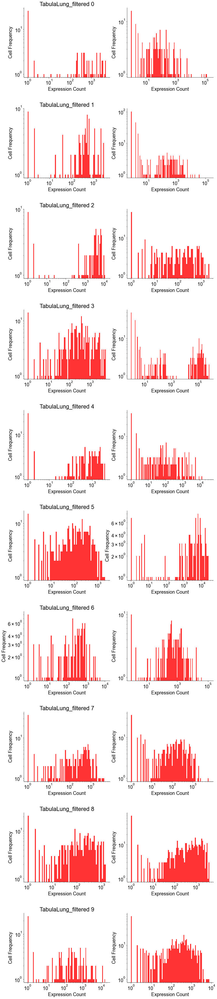

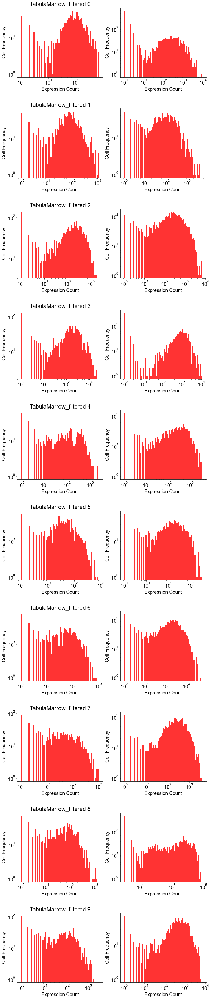

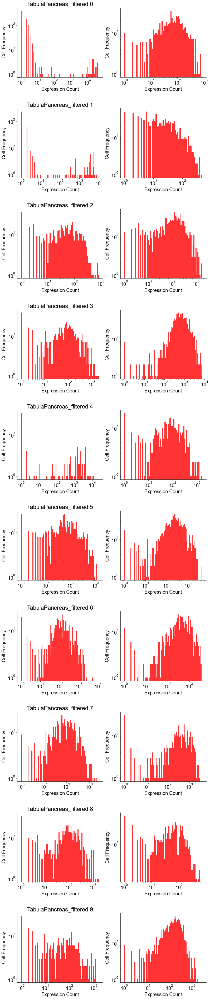

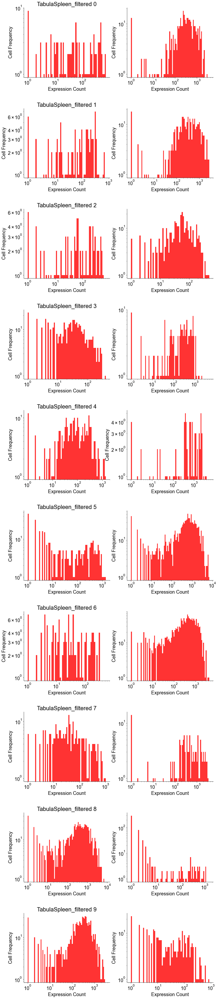

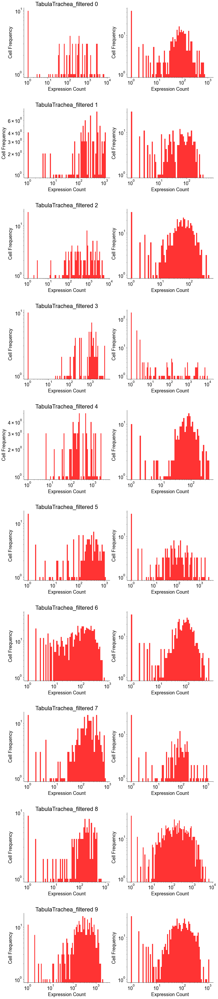

In [130]:
for idx,dataset_name in enumerate(dataset_name_all[:]):


    
    
    exp_data_meta_transformed=exp_data_meta_dict[dataset_name]
    exp_data=exp_data_dict[dataset_name]
    exp_data_row=exp_data_row_dict[dataset_name]
    exp_data_s=exp_data_s_dict[dataset_name]
    gamma_argmax_list=gamma_argmax_dict[dataset_name]    
    
    #result_list=result_list_dict[dataset_name]
    
    MarcoPolo_result=pd.read_csv('datasets/extract/{}.MarcoPolo.2.rank.tsv'.format(dataset_name),sep='\t',index_col=0)
    
    marker=load_marker(dataset_name,method='cellmarker_panglao')
    DE_bool=list(map(lambda x: x in marker, exp_data_row))
    if sum(DE_bool)<=10:
        continue
        
    fig = plt.figure(figsize=((7+1)*8,(5+2)*10)) 
    gs=fig.add_gridspec((5+2)*10,(7+1)*8)        
    
    marker_flatten=load_marker(dataset_name,method='cellmarker_panglao',debug=True)
    
    
    
    marker_flatten=pd.Series(marker_flatten).value_counts()

    #print(marker_flatten.sort_values(),marker_flatten[marker_flatten>1])
    print(len(marker_flatten))
    print(marker_flatten)
    marker_flatten=marker_flatten[marker_flatten>1].to_frame()
    marker_flatten['match_name']=np.nan
    #print(marker_flatten.to_frame())
    #print(len(marker_flatten))
    for gene_name in exp_data_row:
        if gene_name.lower() in marker_flatten.index:
            marker_flatten['match_name'][gene_name.lower()]=gene_name
    print(len(marker_flatten[~marker_flatten['match_name'].isnull()]))
    print(len(marker))
    
    
    maxdiff=pd.read_csv("datasets/extract/{}.maxdiff.100.2.tsv".format(dataset_name),sep='\t')
    markerroh=pd.read_csv("datasets/extract/{}.markerrho.100.2.tsv".format(dataset_name),sep='\t')
    crit1=maxdiff.set_index('Unnamed: 0').loc[markerroh.columns[1:]].sort_values('0',ascending=False)
    crit2=marker_flatten[~marker_flatten['match_name'].isnull()].set_index('match_name')
    #print(crit2)
    
    for i in range(10):
        #fig_subplot=fig.add_subplot(gs[7*(idx//4):7*(idx//4)+5,8*(idx%4):8*(idx%4)+7])
        fig_sub1=fig.add_subplot(gs[7*i: 7*i+5, 0:6])
        fig_sub2=fig.add_subplot(gs[7*i: 7*i+5, 6+1:6+1+6])
        
        #arkerroh.loc[a]
        
        crit1_name=crit1.index[i]
        
        phenoids=markerroh.set_index('Unnamed: 0')[crit1_name]
        phenoids_on=phenoids[phenoids==1]
        phenoids_off=phenoids[phenoids==0]        
        #rit2_name=crit2.index[i]
        
        data_on=(exp_data[exp_data_row.index(crit1_name)])#[exp_data_meta_transformed['phenoid'].map(lambda x: x in phenoids_on.index.values)]    
        bins=[np.power(1.5,i) for i in range(37)]
        #bins=np.clip(bins,a_min=0,a_max=exp_data.max())
        bins=[np.power(1.1,i) for i in range(int(np.log(np.max(data_on))/np.log(1.1)))]
        fig_sub1.hist(data_on,
                      alpha=0.8,
                      bins=bins,
                      color=[1,0,0,1],
                      label='On'
                      )

        handles_on, labels_on=fig_sub2.get_legend_handles_labels()
        #legt=fig_sub2.legend(markerscale=0.0) 
        #[rec.set_height(5) for rec in leg.get_patches()]    
        
        fig_sub1.set_xscale('log')
        fig_sub1.set_yscale('log')


        fig_sub1.set_xlabel('Expression Count')
        fig_sub1.set_ylabel('Cell Frequency')

        fig_sub1.spines['right'].set_visible(False)
        fig_sub1.spines['top'].set_visible(False)  
        
        fig_sub1.set_title('{} {}'.format(dataset_name,i))
        """
        data_off=(exp_data[exp_data_row.index(crit1_name)])[exp_data_meta_transformed['phenoid'].map(lambda x: x in phenoids_off.index.values)]    
        bins=[np.power(1.5,i) for i in range(37)]
        #bins=np.clip(bins,a_min=0,a_max=exp_data.max())
        bins=[np.power(1.1,i) for i in range(int(np.log(np.max(data_off))/np.log(1.1)))]
        fig_sub1.hist(data_off,
                      alpha=0.8,
                      bins=bins,
                      color=[0,0,0,1],
                      label='Off'
                      )

        handles_on, labels_on=fig_sub2.get_legend_handles_labels()
        #legt=fig_sub2.legend(markerscale=0.0) 
        #[rec.set_height(5) for rec in leg.get_patches()]    
        
        fig_sub1.set_xscale('log')
        fig_sub1.set_yscale('log')


        fig_sub1.set_xlabel('Expression Count')
        fig_sub1.set_ylabel('Cell Frequency')

        fig_sub1.spines['right'].set_visible(False)
        fig_sub1.spines['top'].set_visible(False)          
        """
        
        
        
        
        
        crit2_name=crit2.index[i]
        
        #phenoids=markerroh.set_index('Unnamed: 0')[crit1_name]
        #phenoids_on=phenoids[phenoids==1]
        #phenoids_off=phenoids[phenoids==0]        
        #rit2_name=crit2.index[i]
        
        data_on=(exp_data[exp_data_row.index(crit2_name)])#[exp_data_meta_transformed['phenoid'].map(lambda x: x in phenoids_on.index.values)]    
        bins=[np.power(1.5,i) for i in range(37)]
        #bins=np.clip(bins,a_min=0,a_max=exp_data.max())
        bins=[np.power(1.1,i) for i in range(int(np.log(np.max(data_on))/np.log(1.1)))]
        fig_sub2.hist(data_on,
                      alpha=0.8,
                      bins=bins,
                      color=[1,0,0,1],
                      label='On'
                      )

        handles_on, labels_on=fig_sub2.get_legend_handles_labels()
        #legt=fig_sub2.legend(markerscale=0.0) 
        #[rec.set_height(5) for rec in leg.get_patches()]    
        
        fig_sub2.set_xscale('log')
        fig_sub2.set_yscale('log')


        fig_sub2.set_xlabel('Expression Count')
        fig_sub2.set_ylabel('Cell Frequency')

        fig_sub2.spines['right'].set_visible(False)
        fig_sub2.spines['top'].set_visible(False)          
        
        
        
        #""
        

    if idx==5:
        break
    

In [156]:
param_df[i]

0       7000
1       6994
2       6990
3       6898
4       6997
        ... 
6997    4999
6998    3420
6999     282
7000    2619
7001    3362
Name: 0.9, Length: 7002, dtype: int64

In [130]:
pd.read_csv(path+'.hyperparamter.voting_thres.{}.MarcoPolo.2.rank.tsv'.format(str(voting_thres).replace('.','_')),sep='\t',index_col=0)

,QQratio,intersectioncount,PCstd,lfc,mean_0_all,minorsize,maxdiff,ismarker,QQratio_rank,intersectioncount_rank,PCstd_rank,lfc_rank,mean_0_all_rank,minorsize_rank,votingscore_rank,bimodalityscore_rank,proximityscore_rank,MarcoPolo,MarcoPolo_rank
0,2.943829,2,14.755548,0.438659,36511.822101,844,0.159029,False,6576,445,3087,6999,5,15,7002,7002,7002,7002,6999
1,2.784632,1,12.998850,0.396623,4629.730145,795,0.140275,False,6696,999999,1374,7000,48,43,7002,7002,7002,7002,7000
2,2.980997,1,11.369871,0.678353,13512.617622,400,0.232403,False,6544,999999,928,6971,14,1505,999999,14,928,14,44
3,3.244012,11,12.881129,0.674574,4019.355635,888,0.356038,False,6338,114,1324,6974,56,3,114,56,1324,56,159
4,2.778985,2,11.093114,0.465067,2280.212062,651,0.224612,False,6703,600,878,6998,101,254,7002,7002,7002,7002,6998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6997,8.821643,1,10.448057,3.151932,545.321437,87,1.417873,False,168,999999,776,109,614,6927,999999,168,776,168,449
6998,11.000912,1,14.936105,3.186797,278.456294,99,1.382368,False,35,999999,3489,92,2678,6848,999999,35,3489,35,96
6999,8.358478,1,15.546391,2.952304,251.390443,110,0.228636,False,242,999999,5475,281,3383,6697,999999,242,5475,242,597
7000,4.002928,1,15.029957,2.136506,111.771863,155,0.255408,False,5463,999999,3764,4005,6683,5435,999999,5463,3764,3764,6014


# sensitivity

['Bone marrow']
[]
1073
187
108
['Lung']
['Lungs']
1479
272
175


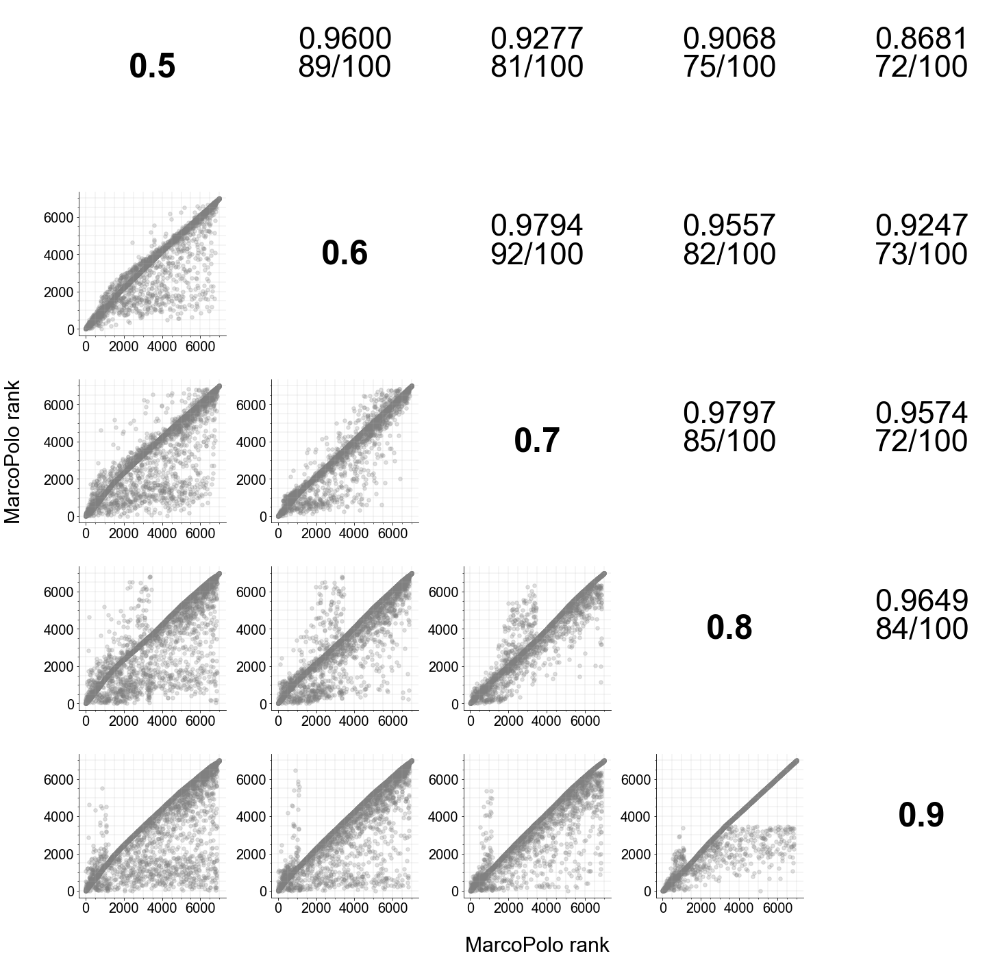

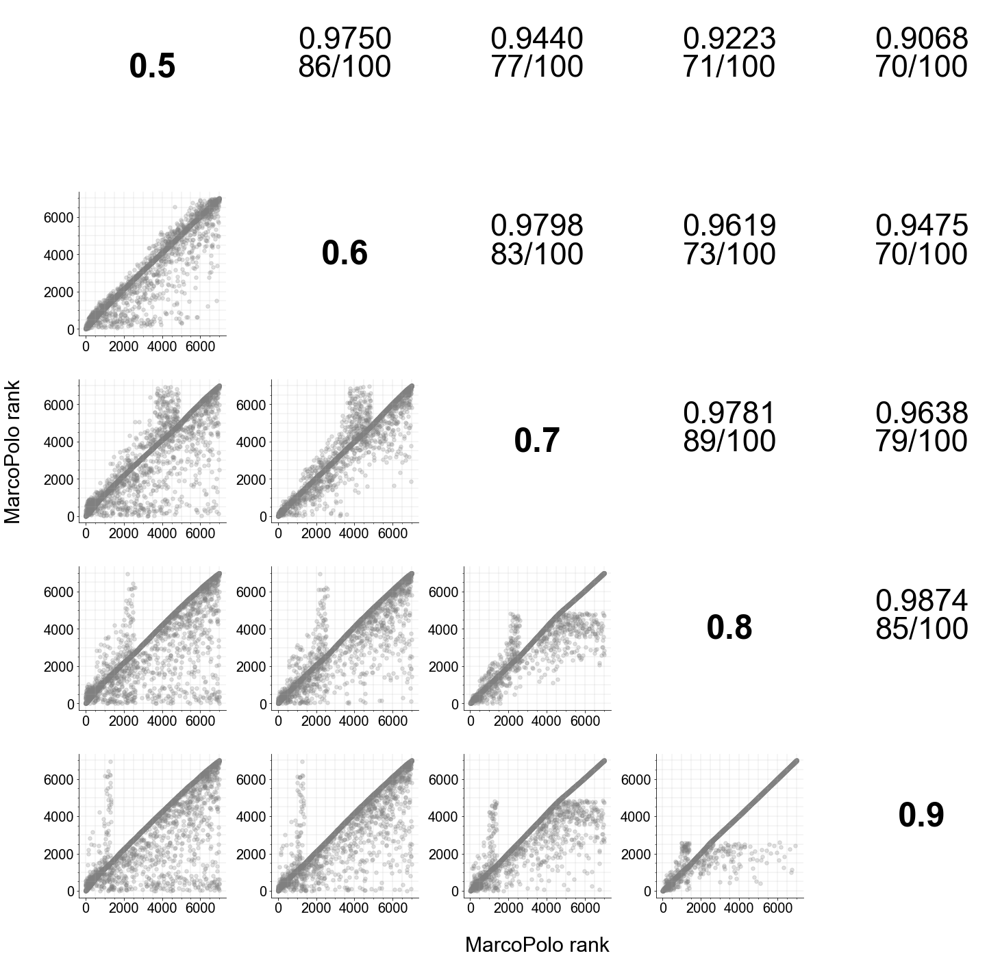

In [164]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)


for dataset_name in ['TabulaMarrow_filtered','TabulaLung_filtered']:
    path='datasets/extract/{}'.format(dataset_name)
    
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    marker1=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=100,lfc=2)
    marker2=load_marker(dataset_name,method='cellmarker_panglao',num_genes=100,lfc=2)

    voting_thres_range=[0.5,0.6,0.7,0.8,0.9]

    hyper_voting_thres=[]
    for voting_thres in voting_thres_range:
        result=pd.read_csv(path+'.hyperparamter.voting_thres.{}.MarcoPolo.2.rank.tsv'.format(str(voting_thres).replace('.','_')),sep='\t',index_col=0)
        hyper_voting_thres.append(result['MarcoPolo_rank'].tolist())
    hyper_voting_thres_df=pd.DataFrame(hyper_voting_thres,index=voting_thres_range).T


    param_range=voting_thres_range
    param_df=hyper_voting_thres_df


    plt.rcParams["font.size"] = 20

    fig = plt.figure(figsize=(25, 25)) 
    gs=fig.add_gridspec(25,25)


    for i in param_range:
        for j in param_range:
            if i<j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                r_result=stats.spearmanr(param_df[i], param_df[j])
                r_result1=stats.spearmanr(param_df[[i in marker1 for i in exp_data_row]][i],
                                          param_df[[i in marker1 for i in exp_data_row]][j])
                r_result2=stats.spearmanr(param_df[[i in marker2 for i in exp_data_row]][i],
                                          param_df[[i in marker2 for i in exp_data_row]][j])
                
                fig_sub1.text(x=0.5, y=0.7, s='{:.4f}'.format(r_result[0]),size=45,
                             horizontalalignment='center',
                             )
                """
                fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result1[0]),size=45,color='red',
                             horizontalalignment='center',
                             )
                """
                """
                fig_sub1.text(x=0.5, y=0.3, s='{:.4f}'.format(r_result2[0]),size=45,color='blue',
                             horizontalalignment='center',
                             )       
                """
                
                fig_sub1.text(x=0.5, y=0.5, s='{:d}/100'.format(
                    len(param_df[i][param_df[i]<100].index.intersection(param_df[j][param_df[j]<100].index))),
                             size=45,color='black',
                             horizontalalignment='center')                
                
                
                
                fig_sub1.axis('off')
                

            elif i==j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                fig_sub1.text(x=0.5, y=0.5, s=str(i),
                              fontproperties=font_prop(bold=True,size=50),
                              horizontalalignment='center',
                             )
                fig_sub1.axis('off')
            else:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])

                #param_df.plot.scatter(x=i ,y=j, ax=fig_sub1, s=30, alpha=0.8, color='grey')

                fig_sub1.scatter(x=param_df[i],
                                 y=param_df[j],
                                 s=30,
                                 color='grey',
                                 alpha=0.25
                                )
                """
                fig_sub1.scatter(x=param_df[[i in marker1 for i in exp_data_row]][i],
                                 y=param_df[[i in marker1 for i in exp_data_row]][j],
                                 s=20,
                                 color='red',
                                 alpha=0.8
                                )
                """
                """
                fig_sub1.scatter(x=param_df[[i in marker2 for i in exp_data_row]][i],
                                 y=param_df[[i in marker2 for i in exp_data_row]][j],
                                 s=20,
                                 color='blue',
                                 alpha=0.8
                                )      
                """
            
                #fig_sub1.set_yscale('log')
                fig_sub1.set_xlabel('')
                fig_sub1.set_ylabel('')

                fig_sub1.xaxis.set_major_locator(MultipleLocator(2000))
                fig_sub1.yaxis.set_major_locator(MultipleLocator(2000))

                fig_sub1.yaxis.set_minor_locator(MultipleLocator(500))
                fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
                fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            

                fig_sub1.xaxis.set_minor_locator(MultipleLocator(500))
                fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
                fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)   

                fig_sub1.spines['right'].set_visible(False)
                fig_sub1.spines['top'].set_visible(False)            

    fig_sub=fig.add_subplot(gs[0:24,0:24])            
    fig_sub.axis('off')
    #fig_sub.set_xlabel('MarcoPolo rank')   
    #fig_sub.set_ylabel('MarcoPolo rank')  
    fig_sub.text(x=0.5, y=-0.06, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                )

    fig_sub.text(x=-0.07, y=0.5, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                 verticalalignment='center',
                 rotation=90
                )

    fig.savefig('pub/simul_sensitivity_voting_{}.png'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_voting_{}.jpg'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_voting_{}.svg'.format(dataset_name), bbox_inches='tight')

['Bone marrow']
[]
1073
187
108
['Lung']
['Lungs']
1479
272
175


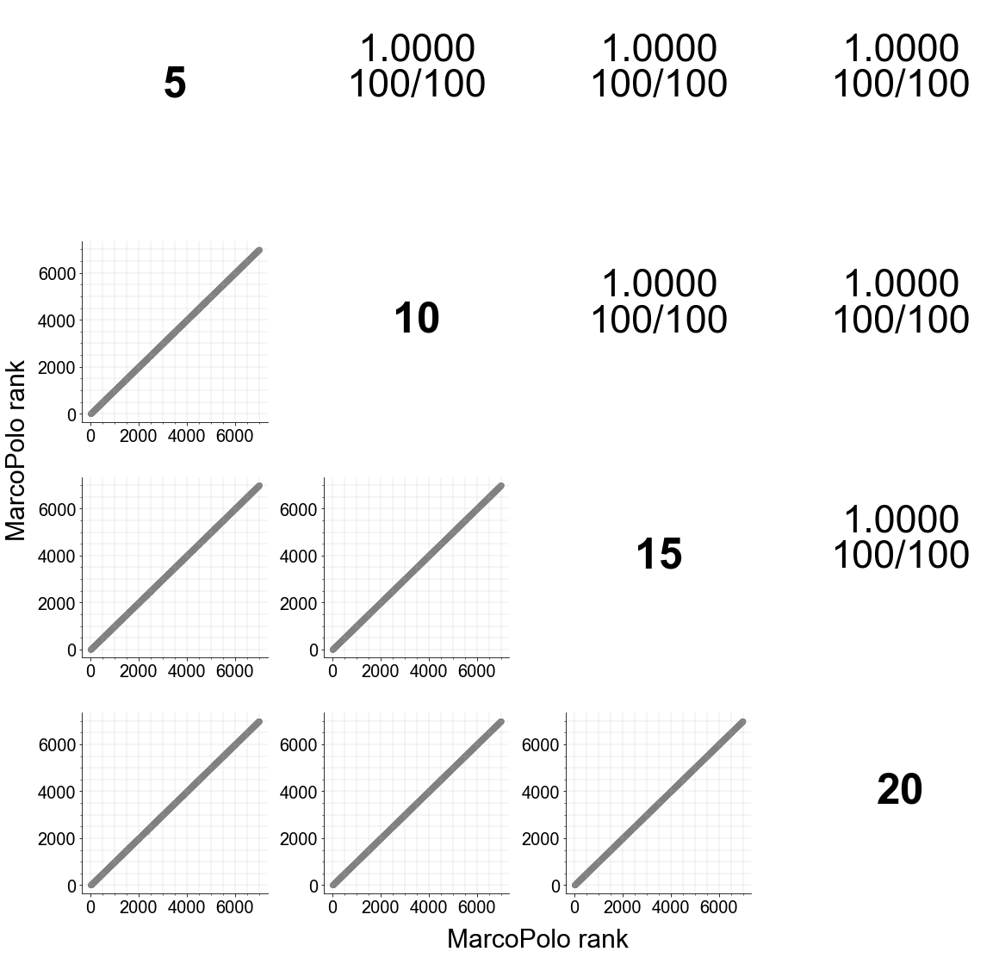

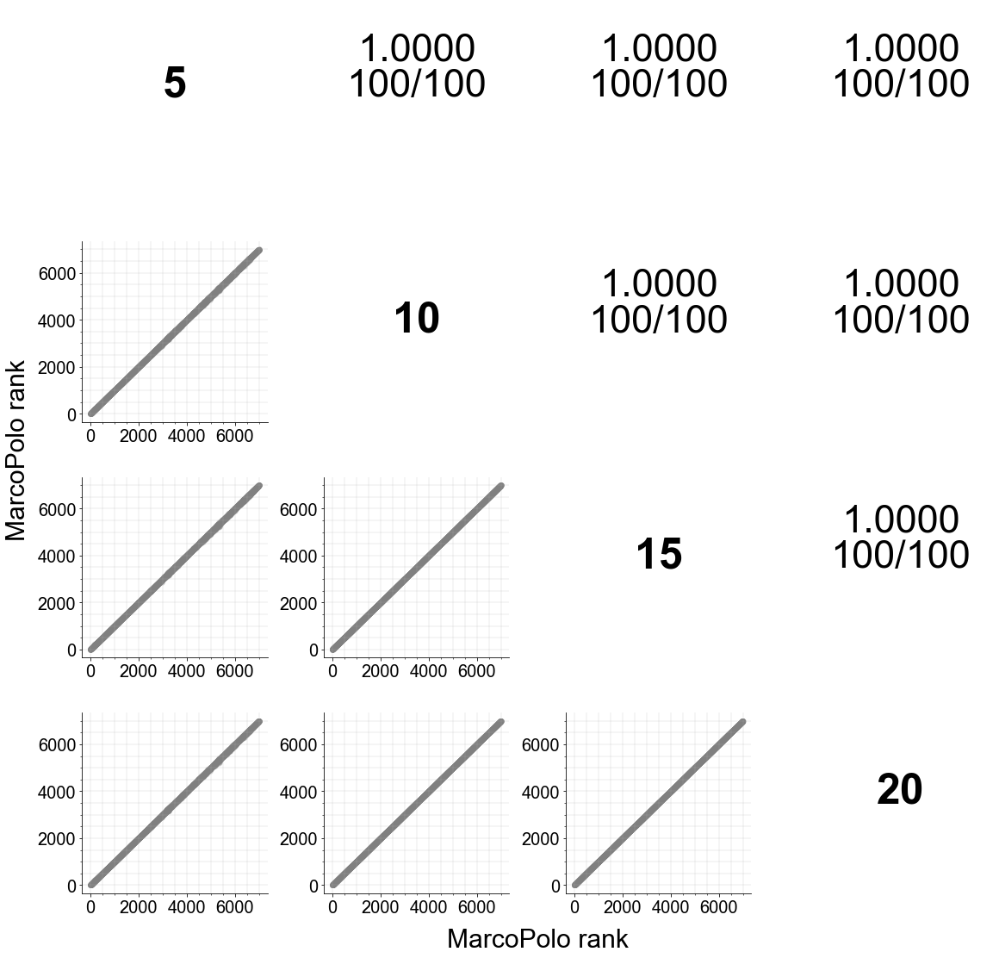

In [165]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)


for dataset_name in ['TabulaMarrow_filtered','TabulaLung_filtered']:
    path='datasets/extract/{}'.format(dataset_name)
    
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    marker1=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=100,lfc=2)
    marker2=load_marker(dataset_name,method='cellmarker_panglao',num_genes=100,lfc=2)



    norm_thres_range=[5,10,15,20]

    hyper_norm_thres=[]
    for norm_thres in norm_thres_range:
        result=pd.read_csv(path+'.hyperparamter.norm_thres.{}.MarcoPolo.2.rank.tsv'.format(str(norm_thres).replace('.','_')),sep='\t',index_col=0)
        hyper_norm_thres.append(result['MarcoPolo_rank'].tolist())

    hyper_norm_thres_df=pd.DataFrame(hyper_norm_thres,index=norm_thres_range).T

    param_range=norm_thres_range
    param_df=hyper_norm_thres_df
    


    plt.rcParams["font.size"] = 20

    fig = plt.figure(figsize=(25, 25)) 
    gs=fig.add_gridspec(25,25)


    for i in param_range:
        for j in param_range:
            if i<j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                r_result=stats.spearmanr(param_df[i], param_df[j])
                r_result1=stats.spearmanr(param_df[[i in marker1 for i in exp_data_row]][i],
                                          param_df[[i in marker1 for i in exp_data_row]][j])
                r_result2=stats.spearmanr(param_df[[i in marker2 for i in exp_data_row]][i],
                                          param_df[[i in marker2 for i in exp_data_row]][j])
                
                fig_sub1.text(x=0.5, y=0.7, s='{:.4f}'.format(r_result[0]),size=45,
                             horizontalalignment='center',
                             )

                fig_sub1.text(x=0.5, y=0.5, s='{:d}/100'.format(
                            len(param_df[i][param_df[i]<100].index.intersection(param_df[j][param_df[j]<100].index))),
                                     size=45,color='black',
                                     horizontalalignment='center')  
                """
                fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result1[0]),size=45,color='red',
                             horizontalalignment='center',
                             )
                """
                """          
                fig_sub1.text(x=0.5, y=0.3, s='{:.4f}'.format(r_result2[0]),size=45,color='blue',
                             horizontalalignment='center',
                             )               
                """
                
                
                fig_sub1.axis('off')

            elif i==j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                fig_sub1.text(x=0.5, y=0.5, s=str(i),
                              fontproperties=font_prop(bold=True,size=50),
                              horizontalalignment='center',
                             )
                fig_sub1.axis('off')
            else:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])

                #param_df.plot.scatter(x=i ,y=j, ax=fig_sub1, s=30, alpha=0.8, color='grey')

                fig_sub1.scatter(x=param_df[i],
                                 y=param_df[j],
                                 s=30,
                                 color='grey',
                                 alpha=0.25
                                )
                """
                fig_sub1.scatter(x=param_df[[i in marker1 for i in exp_data_row]][i],
                                 y=param_df[[i in marker1 for i in exp_data_row]][j],
                                 s=20,
                                 color='red',
                                 alpha=0.8
                                )
                
                
                fig_sub1.scatter(x=param_df[[i in marker2 for i in exp_data_row]][i],
                                 y=param_df[[i in marker2 for i in exp_data_row]][j],
                                 s=20,
                                 color='blue',
                                 alpha=0.8
                                )  
                """
            
                #fig_sub1.set_yscale('log')
                fig_sub1.set_xlabel('')
                fig_sub1.set_ylabel('')

                fig_sub1.xaxis.set_major_locator(MultipleLocator(2000))
                fig_sub1.yaxis.set_major_locator(MultipleLocator(2000))

                fig_sub1.yaxis.set_minor_locator(MultipleLocator(500))
                fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
                fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            

                fig_sub1.xaxis.set_minor_locator(MultipleLocator(500))
                fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
                fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)   

                fig_sub1.spines['right'].set_visible(False)
                fig_sub1.spines['top'].set_visible(False)            

    fig_sub=fig.add_subplot(gs[0:19,0:19])            
    fig_sub.axis('off')
    #fig_sub.set_xlabel('MarcoPolo rank')   
    #fig_sub.set_ylabel('MarcoPolo rank')  
    fig_sub.text(x=0.5, y=-0.06, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                )

    fig_sub.text(x=-0.07, y=0.5, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                 verticalalignment='center',
                 rotation=90
                )

    fig.savefig('pub/simul_sensitivity_norm_{}.png'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_norm_{}.jpg'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_norm_{}.svg'.format(dataset_name), bbox_inches='tight')

['Bone marrow']
[]
1073
187
108
['Lung']
['Lungs']
1479
272
175


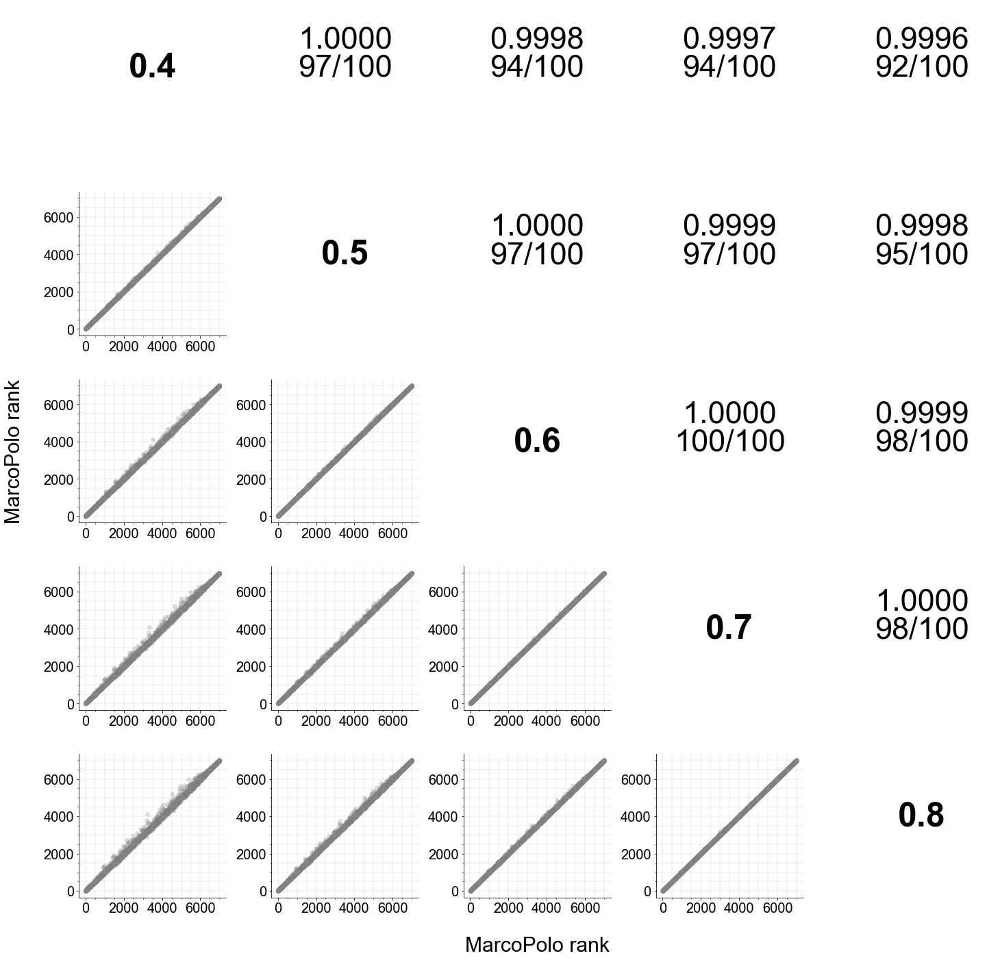

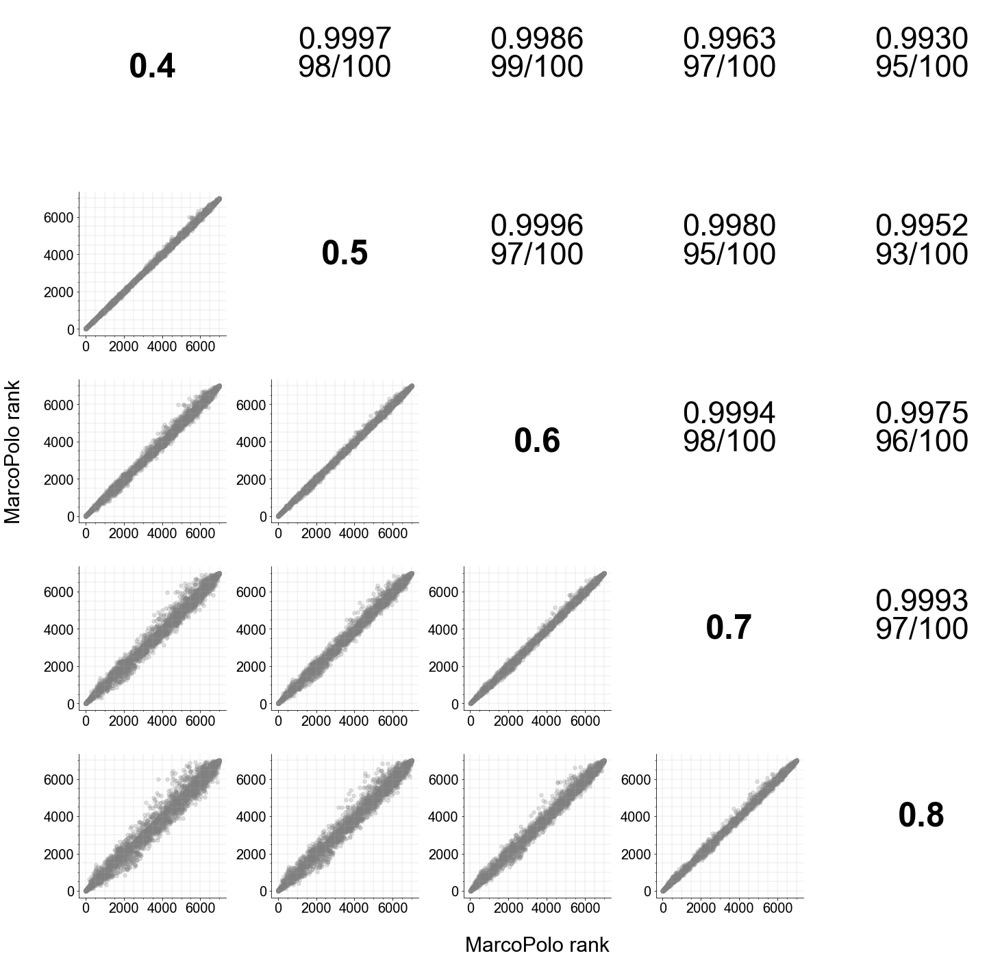

In [166]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)


for dataset_name in ['TabulaMarrow_filtered','TabulaLung_filtered']:
    path='datasets/extract/{}'.format(dataset_name)
    
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    marker1=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=100,lfc=2)
    marker2=load_marker(dataset_name,method='cellmarker_panglao',num_genes=100,lfc=2)



    lfc_thres_range=[0.4,0.5,0.6,0.7,0.8]

    hyper_lfc_thres=[]
    for lfc_thres in lfc_thres_range:
        result=pd.read_csv(path+'.hyperparamter.lfc_thres.{}.MarcoPolo.2.rank.tsv'.format(str(lfc_thres).replace('.','_')),sep='\t',index_col=0)
        hyper_lfc_thres.append(result['MarcoPolo_rank'].tolist())
    hyper_lfc_thres_df=pd.DataFrame(hyper_lfc_thres,index=lfc_thres_range).T    

    param_range=lfc_thres_range
    param_df=hyper_lfc_thres_df



    plt.rcParams["font.size"] = 20

    fig = plt.figure(figsize=(25, 25)) 
    gs=fig.add_gridspec(25,25)


    for i in param_range:
        for j in param_range:
            if i<j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                r_result=stats.spearmanr(param_df[i], param_df[j])
                r_result1=stats.spearmanr(param_df[[i in marker1 for i in exp_data_row]][i],
                                          param_df[[i in marker1 for i in exp_data_row]][j])
                r_result2=stats.spearmanr(param_df[[i in marker2 for i in exp_data_row]][i],
                                          param_df[[i in marker2 for i in exp_data_row]][j])
                
                fig_sub1.text(x=0.5, y=0.7, s='{:.4f}'.format(r_result[0]),size=45,
                             horizontalalignment='center',
                             )
                
                fig_sub1.text(x=0.5, y=0.5, s='{:d}/100'.format(
                            len(param_df[i][param_df[i]<100].index.intersection(param_df[j][param_df[j]<100].index))),
                                     size=45,color='black',
                                     horizontalalignment='center')                  
                """
                fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result1[0]),size=45,color='red',
                             horizontalalignment='center',
                             )
                fig_sub1.text(x=0.5, y=0.3, s='{:.4f}'.format(r_result2[0]),size=45,color='blue',
                             horizontalalignment='center',
                             )           
                """
                
                
                fig_sub1.axis('off')

            elif i==j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                fig_sub1.text(x=0.5, y=0.5, s=str(i),
                              fontproperties=font_prop(bold=True,size=50),
                              horizontalalignment='center',
                             )
                fig_sub1.axis('off')
            else:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])

                #param_df.plot.scatter(x=i ,y=j, ax=fig_sub1, s=30, alpha=0.8, color='grey')

                fig_sub1.scatter(x=param_df[i],
                                 y=param_df[j],
                                 s=30,
                                 color='grey',
                                 alpha=0.25
                                )
                """
                fig_sub1.scatter(x=param_df[[i in marker1 for i in exp_data_row]][i],
                                 y=param_df[[i in marker1 for i in exp_data_row]][j],
                                 s=20,
                                 color='red',
                                 alpha=0.8
                                )
                
                fig_sub1.scatter(x=param_df[[i in marker2 for i in exp_data_row]][i],
                                 y=param_df[[i in marker2 for i in exp_data_row]][j],
                                 s=20,
                                 color='blue',
                                 alpha=0.8
                                )   
                """
            
                #fig_sub1.set_yscale('log')
                fig_sub1.set_xlabel('')
                fig_sub1.set_ylabel('')

                fig_sub1.xaxis.set_major_locator(MultipleLocator(2000))
                fig_sub1.yaxis.set_major_locator(MultipleLocator(2000))

                fig_sub1.yaxis.set_minor_locator(MultipleLocator(500))
                fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
                fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            

                fig_sub1.xaxis.set_minor_locator(MultipleLocator(500))
                fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
                fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)   

                fig_sub1.spines['right'].set_visible(False)
                fig_sub1.spines['top'].set_visible(False)            

    fig_sub=fig.add_subplot(gs[0:24,0:24])            
    fig_sub.axis('off')
    #fig_sub.set_xlabel('MarcoPolo rank')   
    #fig_sub.set_ylabel('MarcoPolo rank')  
    fig_sub.text(x=0.5, y=-0.06, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                )

    fig_sub.text(x=-0.07, y=0.5, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                 verticalalignment='center',
                 rotation=90
                )

    fig.savefig('pub/simul_sensitivity_lfc_{}.png'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_lfc_{}.jpg'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_lfc_{}.svg'.format(dataset_name), bbox_inches='tight')

['Bone marrow']
[]
1073
187
108
['Lung']
['Lungs']
1479
272
175


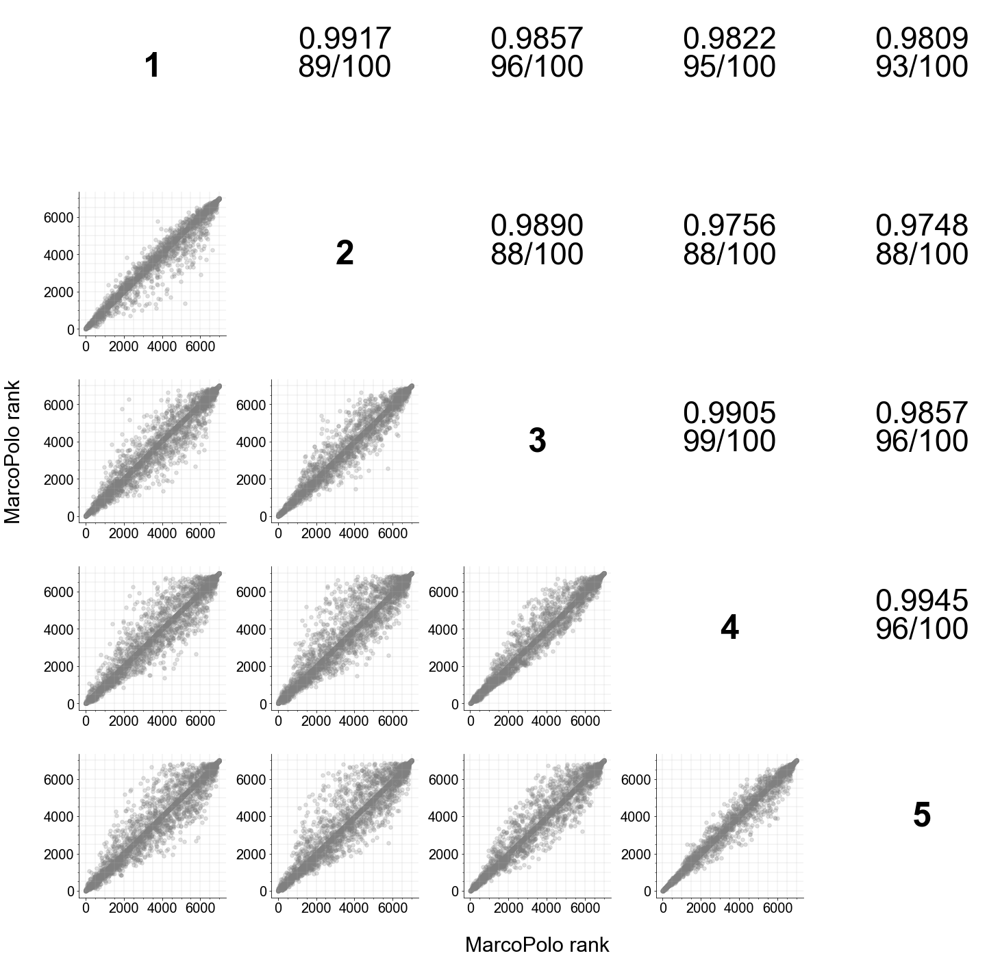

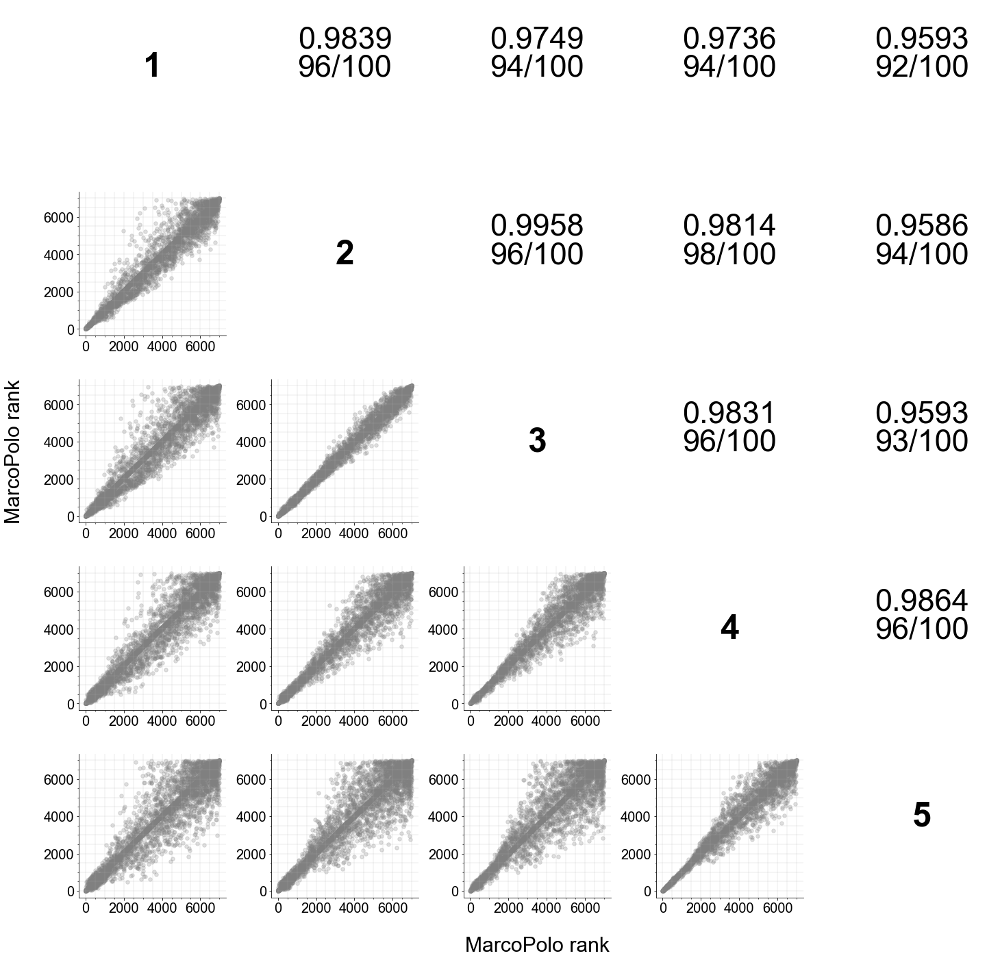

In [167]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)


for dataset_name in ['TabulaMarrow_filtered','TabulaLung_filtered']:
    path='datasets/extract/{}'.format(dataset_name)
    
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    marker1=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=100,lfc=2)
    marker2=load_marker(dataset_name,method='cellmarker_panglao',num_genes=100,lfc=2)


    n_pc_range=[1,2,3,4,5]

    hyper_n_pc=[]
    for n_pc in n_pc_range:
        result=pd.read_csv(path+'.hyperparamter.n_pc.{}.MarcoPolo.2.rank.tsv'.format(str(n_pc).replace('.','_')),sep='\t',index_col=0)
        hyper_n_pc.append(result['MarcoPolo_rank'].tolist())
    hyper_n_pc_df=pd.DataFrame(hyper_n_pc,index=[1,2,3,4,5]).T  

    param_range=n_pc_range
    param_df=hyper_n_pc_df



    plt.rcParams["font.size"] = 20

    fig = plt.figure(figsize=(25, 25)) 
    gs=fig.add_gridspec(25,25)


    for i in param_range:
        for j in param_range:
            if i<j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                r_result=stats.spearmanr(param_df[i], param_df[j])
                r_result1=stats.spearmanr(param_df[[i in marker1 for i in exp_data_row]][i],
                                          param_df[[i in marker1 for i in exp_data_row]][j])
                r_result2=stats.spearmanr(param_df[[i in marker2 for i in exp_data_row]][i],
                                          param_df[[i in marker2 for i in exp_data_row]][j])
                
                fig_sub1.text(x=0.5, y=0.7, s='{:.4f}'.format(r_result[0]),size=45,
                             horizontalalignment='center',
                             )
                
                fig_sub1.text(x=0.5, y=0.5, s='{:d}/100'.format(
                            len(param_df[i][param_df[i]<100].index.intersection(param_df[j][param_df[j]<100].index))),
                                     size=45,color='black',
                                     horizontalalignment='center')                  
                """
                fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result1[0]),size=45,color='red',
                             horizontalalignment='center',
                             )
                
                fig_sub1.text(x=0.5, y=0.3, s='{:.4f}'.format(r_result2[0]),size=45,color='blue',
                             horizontalalignment='center',
                             )  
                """
                
                
                fig_sub1.axis('off')

            elif i==j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                fig_sub1.text(x=0.5, y=0.5, s=str(i),
                              fontproperties=font_prop(bold=True,size=50),
                              horizontalalignment='center',
                             )
                fig_sub1.axis('off')
            else:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])

                #param_df.plot.scatter(x=i ,y=j, ax=fig_sub1, s=30, alpha=0.8, color='grey')

                fig_sub1.scatter(x=param_df[i],
                                 y=param_df[j],
                                 s=30,
                                 color='grey',
                                 alpha=0.25
                                )
                """
                fig_sub1.scatter(x=param_df[[i in marker1 for i in exp_data_row]][i],
                                 y=param_df[[i in marker1 for i in exp_data_row]][j],
                                 s=20,
                                 color='red',
                                 alpha=0.8
                                )
                
                fig_sub1.scatter(x=param_df[[i in marker2 for i in exp_data_row]][i],
                                 y=param_df[[i in marker2 for i in exp_data_row]][j],
                                 s=20,
                                 color='blue',
                                 alpha=0.8
                                )  
                """
            
                #fig_sub1.set_yscale('log')
                fig_sub1.set_xlabel('')
                fig_sub1.set_ylabel('')

                fig_sub1.xaxis.set_major_locator(MultipleLocator(2000))
                fig_sub1.yaxis.set_major_locator(MultipleLocator(2000))

                fig_sub1.yaxis.set_minor_locator(MultipleLocator(500))
                fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
                fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            

                fig_sub1.xaxis.set_minor_locator(MultipleLocator(500))
                fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
                fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)   

                fig_sub1.spines['right'].set_visible(False)
                fig_sub1.spines['top'].set_visible(False)            

    fig_sub=fig.add_subplot(gs[0:24,0:24])            
    fig_sub.axis('off')
    #fig_sub.set_xlabel('MarcoPolo rank')   
    #fig_sub.set_ylabel('MarcoPolo rank')  
    fig_sub.text(x=0.5, y=-0.06, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                )

    fig_sub.text(x=-0.07, y=0.5, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                 verticalalignment='center',
                 rotation=90
                )

    fig.savefig('pub/simul_sensitivity_n_pc_{}.png'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_n_pc_{}.jpg'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_n_pc_{}.svg'.format(dataset_name), bbox_inches='tight')

['Bone marrow']
[]
1073
187
108
['Lung']
['Lungs']
1479
272
175


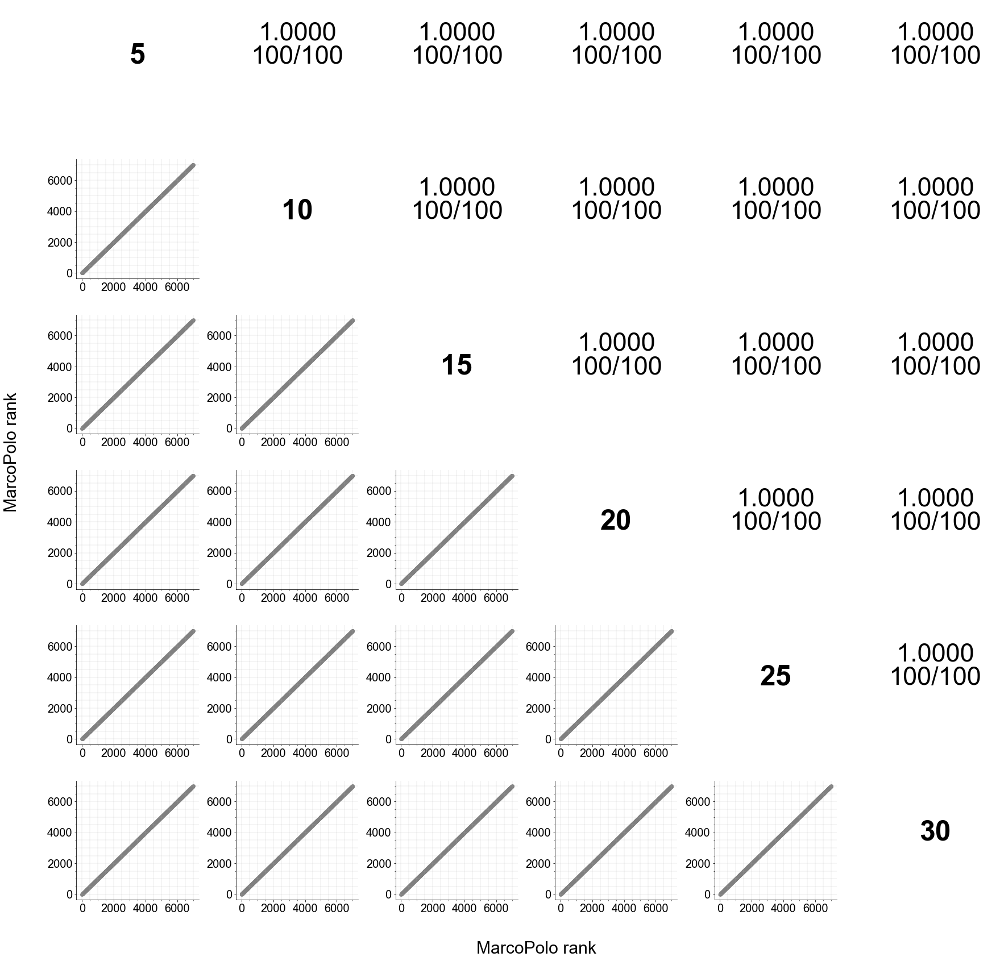

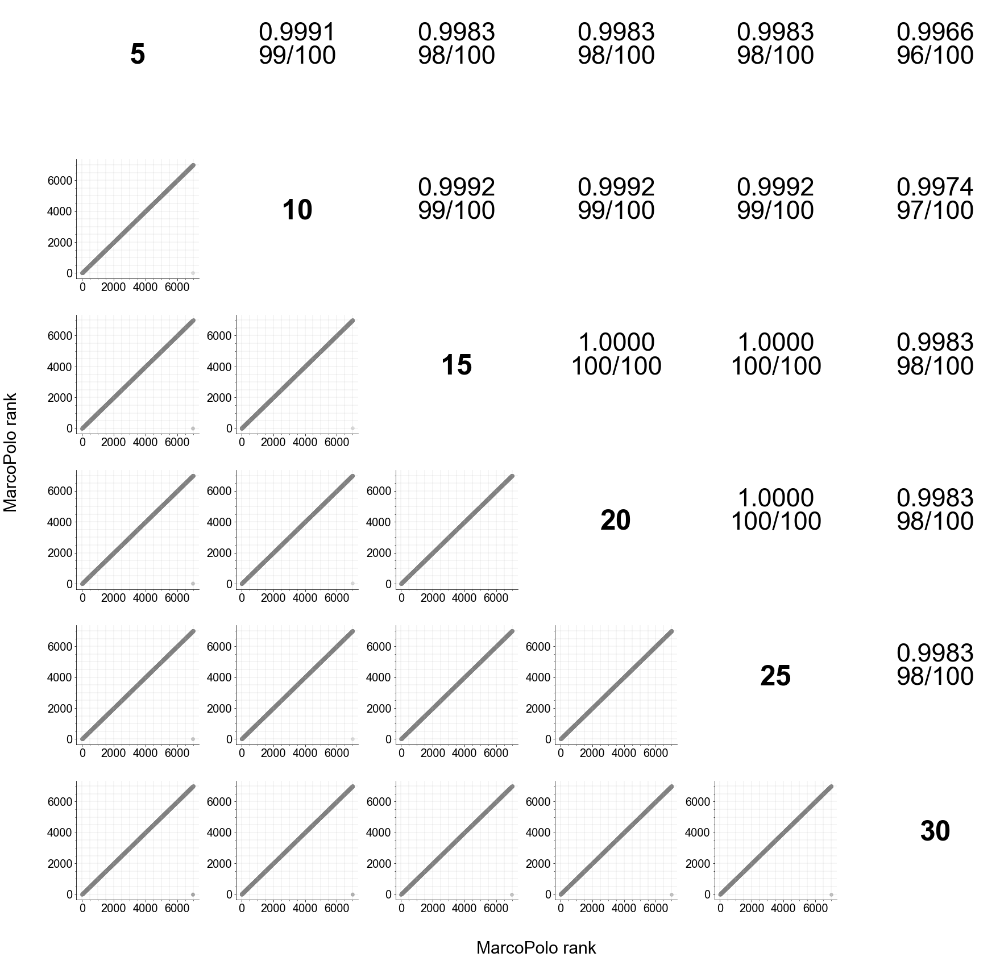

In [168]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)


for dataset_name in ['TabulaMarrow_filtered','TabulaLung_filtered']:
    path='datasets/extract/{}'.format(dataset_name)
    
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    marker1=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=100,lfc=2)
    marker2=load_marker(dataset_name,method='cellmarker_panglao',num_genes=100,lfc=2)


    minor_size_min_range=[5,10,15,20,25,30]


    hyper_minor_size_min=[]
    for minor_size_min in minor_size_min_range:
        result=pd.read_csv(path+'.hyperparamter.minor_size_min.{}.MarcoPolo.2.rank.tsv'.format(str(minor_size_min).replace('.','_')),sep='\t',index_col=0)
        hyper_minor_size_min.append(result['MarcoPolo_rank'].tolist())
    hyper_minor_size_min_df=pd.DataFrame(hyper_minor_size_min,index=minor_size_min_range).T  


    param_range=minor_size_min_range
    param_df=hyper_minor_size_min_df


    plt.rcParams["font.size"] = 20

    fig = plt.figure(figsize=(30, 30)) 
    gs=fig.add_gridspec(30,30)


    for i in param_range:
        for j in param_range:
            if i<j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                r_result=stats.spearmanr(param_df[i], param_df[j])
                r_result1=stats.spearmanr(param_df[[i in marker1 for i in exp_data_row]][i],
                                          param_df[[i in marker1 for i in exp_data_row]][j])
                r_result2=stats.spearmanr(param_df[[i in marker2 for i in exp_data_row]][i],
                                          param_df[[i in marker2 for i in exp_data_row]][j])
                
                fig_sub1.text(x=0.5, y=0.7, s='{:.4f}'.format(r_result[0]),size=45,
                             horizontalalignment='center',
                             )
                fig_sub1.text(x=0.5, y=0.5, s='{:d}/100'.format(
                            len(param_df[i][param_df[i]<100].index.intersection(param_df[j][param_df[j]<100].index))),
                                     size=45,color='black',
                                     horizontalalignment='center')                  
                
                """
                fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result1[0]),size=45,color='red',
                             horizontalalignment='center',
                             )
                fig_sub1.text(x=0.5, y=0.3, s='{:.4f}'.format(r_result2[0]),size=45,color='blue',
                             horizontalalignment='center',
                             )                
                """
                
                fig_sub1.axis('off')

            elif i==j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                fig_sub1.text(x=0.5, y=0.5, s=str(i),
                              fontproperties=font_prop(bold=True,size=50),
                              horizontalalignment='center',
                             )
                fig_sub1.axis('off')
            else:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])

                #param_df.plot.scatter(x=i ,y=j, ax=fig_sub1, s=30, alpha=0.8, color='grey')

                fig_sub1.scatter(x=param_df[i],
                                 y=param_df[j],
                                 s=30,
                                 color='grey',
                                 alpha=0.25
                                )
                """
                fig_sub1.scatter(x=param_df[[i in marker1 for i in exp_data_row]][i],
                                 y=param_df[[i in marker1 for i in exp_data_row]][j],
                                 s=20,
                                 color='red',
                                 alpha=0.8
                                )
                
                fig_sub1.scatter(x=param_df[[i in marker2 for i in exp_data_row]][i],
                                 y=param_df[[i in marker2 for i in exp_data_row]][j],
                                 s=20,
                                 color='blue',
                                 alpha=0.8
                                )                
                """
                #fig_sub1.set_yscale('log')
                fig_sub1.set_xlabel('')
                fig_sub1.set_ylabel('')

                fig_sub1.xaxis.set_major_locator(MultipleLocator(2000))
                fig_sub1.yaxis.set_major_locator(MultipleLocator(2000))

                fig_sub1.yaxis.set_minor_locator(MultipleLocator(500))
                fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
                fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            

                fig_sub1.xaxis.set_minor_locator(MultipleLocator(500))
                fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
                fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)   

                fig_sub1.spines['right'].set_visible(False)
                fig_sub1.spines['top'].set_visible(False)            

    fig_sub=fig.add_subplot(gs[0:29,0:29])            
    fig_sub.axis('off')
    #fig_sub.set_xlabel('MarcoPolo rank')   
    #fig_sub.set_ylabel('MarcoPolo rank')  
    fig_sub.text(x=0.5, y=-0.06, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                )

    fig_sub.text(x=-0.07, y=0.5, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                 verticalalignment='center',
                 rotation=90
                )

    fig.savefig('pub/simul_sensitivity_minor_size_min_{}.png'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_minor_size_min_{}.jpg'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_minor_size_min_{}.svg'.format(dataset_name), bbox_inches='tight')

['Bone marrow']
[]
1073
187
108
['Lung']
['Lungs']
1479
272
175


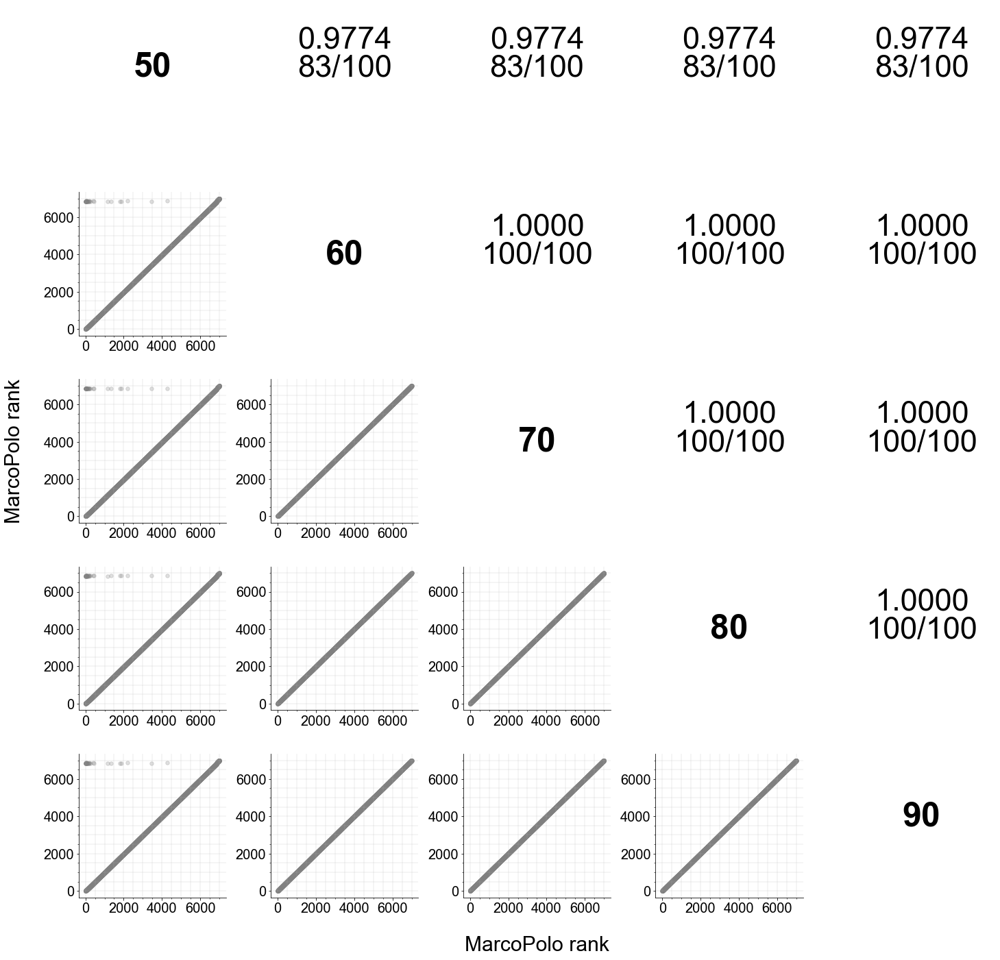

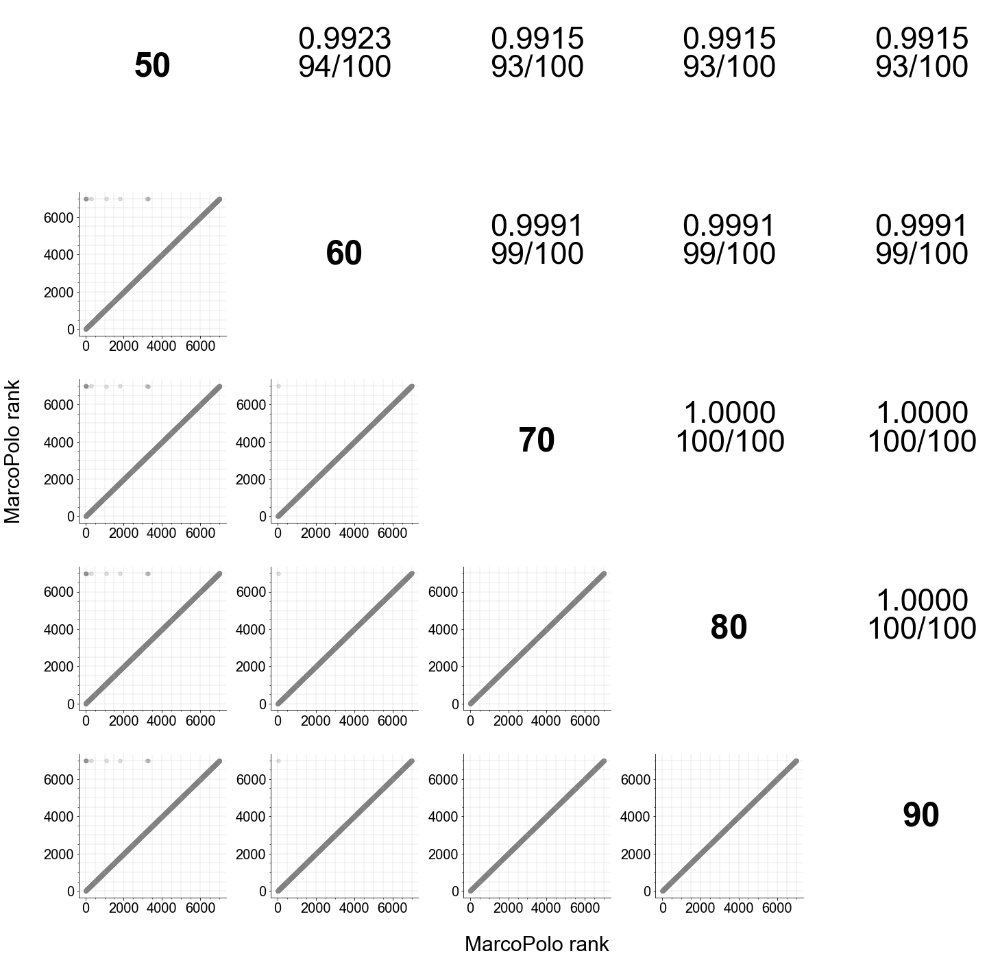

In [169]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)


for dataset_name in ['TabulaMarrow_filtered','TabulaLung_filtered']:
    path='datasets/extract/{}'.format(dataset_name)
    
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    marker1=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=100,lfc=2)
    marker2=load_marker(dataset_name,method='cellmarker_panglao',num_genes=100,lfc=2)


    minor_size_max_percent_range=[50,60,70,80,90]


    hyper_minor_size_max_percent=[]
    for minor_size_max_percent in minor_size_max_percent_range:
        result=pd.read_csv(path+'.hyperparamter.minor_size_max_percent.{}.MarcoPolo.2.rank.tsv'.format(str(minor_size_max_percent).replace('.','_')),sep='\t',index_col=0)
        hyper_minor_size_max_percent.append(result['MarcoPolo_rank'].tolist())    
    hyper_minor_size_max_percent_df=pd.DataFrame(hyper_minor_size_max_percent,index=minor_size_max_percent_range).T   



    param_range=minor_size_max_percent_range
    param_df=hyper_minor_size_max_percent_df


    plt.rcParams["font.size"] = 20

    fig = plt.figure(figsize=(30, 30)) 
    gs=fig.add_gridspec(30,30)


    for i in param_range:
        for j in param_range:
            if i<j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                r_result=stats.spearmanr(param_df[i], param_df[j])
                r_result1=stats.spearmanr(param_df[[i in marker1 for i in exp_data_row]][i],
                                          param_df[[i in marker1 for i in exp_data_row]][j])
                r_result2=stats.spearmanr(param_df[[i in marker2 for i in exp_data_row]][i],
                                          param_df[[i in marker2 for i in exp_data_row]][j])
                
                fig_sub1.text(x=0.5, y=0.7, s='{:.4f}'.format(r_result[0]),size=45,
                             horizontalalignment='center',
                             )
                fig_sub1.text(x=0.5, y=0.5, s='{:d}/100'.format(
                            len(param_df[i][param_df[i]<100].index.intersection(param_df[j][param_df[j]<100].index))),
                                     size=45,color='black',
                                     horizontalalignment='center')                  
                
                """
                fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result1[0]),size=45,color='red',
                             horizontalalignment='center',
                             )
                fig_sub1.text(x=0.5, y=0.3, s='{:.4f}'.format(r_result2[0]),size=45,color='blue',
                             horizontalalignment='center',
                             )       
                """
                
                
                fig_sub1.axis('off')

            elif i==j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                fig_sub1.text(x=0.5, y=0.5, s=str(i),
                              fontproperties=font_prop(bold=True,size=50),
                              horizontalalignment='center',
                             )
                fig_sub1.axis('off')
            else:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])

                #param_df.plot.scatter(x=i ,y=j, ax=fig_sub1, s=30, alpha=0.8, color='grey')

                fig_sub1.scatter(x=param_df[i],
                                 y=param_df[j],
                                 s=30,
                                 color='grey',
                                 alpha=0.25
                                )
                """
                fig_sub1.scatter(x=param_df[[i in marker1 for i in exp_data_row]][i],
                                 y=param_df[[i in marker1 for i in exp_data_row]][j],
                                 s=20,
                                 color='red',
                                 alpha=0.8
                                )
                
                fig_sub1.scatter(x=param_df[[i in marker2 for i in exp_data_row]][i],
                                 y=param_df[[i in marker2 for i in exp_data_row]][j],
                                 s=20,
                                 color='blue',
                                 alpha=0.8
                                )    
                """
            
                #fig_sub1.set_yscale('log')
                fig_sub1.set_xlabel('')
                fig_sub1.set_ylabel('')

                fig_sub1.xaxis.set_major_locator(MultipleLocator(2000))
                fig_sub1.yaxis.set_major_locator(MultipleLocator(2000))

                fig_sub1.yaxis.set_minor_locator(MultipleLocator(500))
                fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
                fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            

                fig_sub1.xaxis.set_minor_locator(MultipleLocator(500))
                fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
                fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)   

                fig_sub1.spines['right'].set_visible(False)
                fig_sub1.spines['top'].set_visible(False)            

    fig_sub=fig.add_subplot(gs[0:24,0:24])            
    fig_sub.axis('off')
    #fig_sub.set_xlabel('MarcoPolo rank')   
    #fig_sub.set_ylabel('MarcoPolo rank')  
    fig_sub.text(x=0.5, y=-0.06, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                )

    fig_sub.text(x=-0.07, y=0.5, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                 verticalalignment='center',
                 rotation=90
                )

    fig.savefig('pub/simul_sensitivity_minor_size_max_percent_{}.png'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_minor_size_max_percent_{}.jpg'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_minor_size_max_percent_{}.svg'.format(dataset_name), bbox_inches='tight')

In [1]:
aa

NameError: name 'aa' is not defined

# type finding

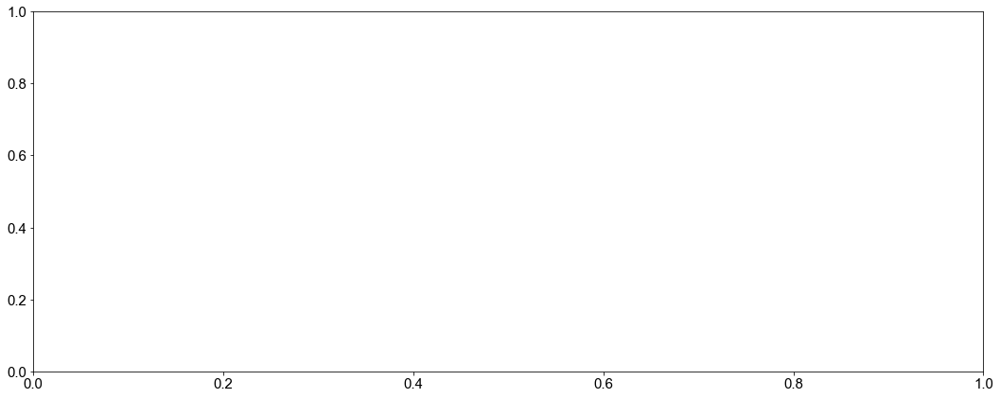

In [110]:
fig_temp1=fig.add_subplot(gs[0:1,0:1])
fig_temp=plt.figure(figsize=(18, 7))
fig_temp_sub1=fig_temp.add_subplot(111)

mode=2

Kohinbulk_filtered
MarcoPolo: 7/8 Haystack: 5/8
0.920300552287914
------------------------------
HumanLiver_filtered


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_inde

MarcoPolo: 4/11 Haystack: 2/11
0.37912410127665447
------------------------------
Zhengmix8eq_filtered
MarcoPolo: 4/8 Haystack: 4/8
0.632021011852223
------------------------------
TabulaAorta_filtered
TabulaBladder_filtered
TabulaBrainMyeloid_filtered
TabulaBrainNonMyeloid_filtered
MarcoPolo: 6/7 Haystack: 2/7
0.32846015362085695
------------------------------
TabulaDiaphragm_filtered
TabulaFat_filtered
MarcoPolo: 6/7 Haystack: 2/7
NA 102
0.28415245262332506
------------------------------
TabulaHeart_filtered


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


MarcoPolo: 7/8 Haystack: 3/8
NA 28
0.29621847623234504
------------------------------
TabulaKidney_filtered
TabulaLargeIntestine_filtered
TabulaLimbMuscle_filtered
MarcoPolo: 5/6 Haystack: 3/6
0.44447841110420844
------------------------------
TabulaLiver_filtered
TabulaLung_filtered


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


MarcoPolo: 8/12 Haystack: 2/12
NA 40
0.36356673500498293
------------------------------
TabulaMammaryGland_filtered
TabulaMarrow_filtered
MarcoPolo: 4/22 Haystack: 1/22
0.6273798582479878
------------------------------
TabulaPancreas_filtered


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


MarcoPolo: 9/9 Haystack: 6/9
0.5083905077763046
------------------------------
TabulaSkin_filtered
TabulaSpleen_filtered
TabulaThymus_filtered
TabulaTongue_filtered
TabulaTrachea_filtered


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(-0.07, 1.0, 'D')

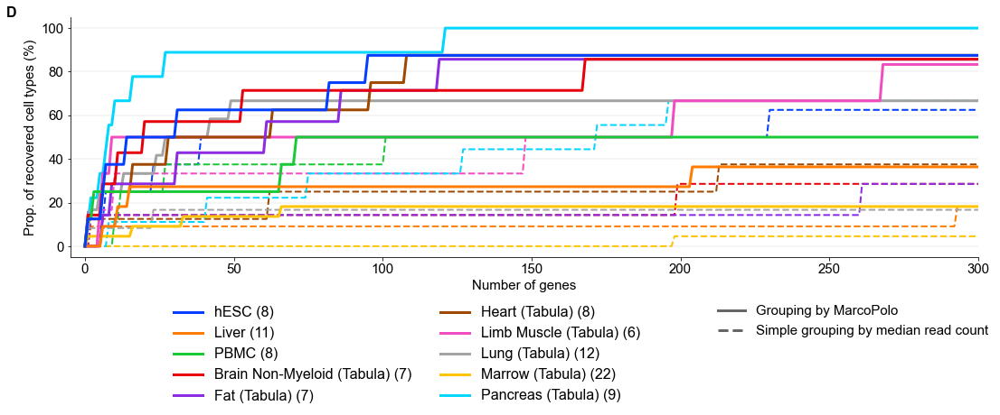

In [181]:
plt.rcParams["font.size"] = 15
#plt.rcParams["axes.prop_cycle"]=cycler('color',DiscretePalette(23))
#plt.rcParams["axes.prop_cycle"]=cycler('color',DiscretePalette(15))
#plt.rcParams["axes.prop_cycle"]=cycler('color',np.repeat(DiscretePalette(10),2))
plt.rcParams["axes.prop_cycle"]=cycler('color',np.repeat(np.array(sns.color_palette("bright",10)),2,axis=0))

fig=plt.figure(figsize=(18, 14))
gs=fig.add_gridspec(14,16)


fig_sub1=fig.add_subplot(gs[0:5,0:16])

bool_select_dict={}
MarcoPolo_count=[]
all_count=[]

unique_type=lambda df: np.sum([((df.T==value.values).T).apply(np.all).astype(int).sum()==1 for col,value in df.iteritems()])



x_lim=300
for idx,dataset_name in enumerate(dataset_name_all[:]):
    print(dataset_name)
    
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')
    if len(exp_data_meta['phenoid'].unique())<=5:
        #print('pass')
        continue
        pass
    
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
        
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')
    clustering_label=pd.read_csv('datasets/extract/{}.clustering.{}.label.tsv'.format(dataset_name,'1_0'),sep='\t')


        
   
        
        
    
    allscore_MarcoPolo=pd.read_csv('datasets/extract/{}.MarcoPolo.{}.rank.tsv'.format(dataset_name,mode),sep='\t',index_col=0)
    marker_matrix_MarcoPolo=pd.read_csv('datasets/extract/{}.typefinding.MarcoPolo.tsv'.format(dataset_name),sep='\t',index_col=0)
    marker_matrix_MarcoPolo_sorted=marker_matrix_MarcoPolo.loc[np.array(exp_data_row)[allscore_MarcoPolo.sort_values('MarcoPolo_rank').index.values]]        
    
    marker_matrix_MarcoPolo_sorted_bool=(marker_matrix_MarcoPolo_sorted>0.7).astype(int)
    marker_matrix_MarcoPolo_sorted_bool.iloc[((marker_matrix_MarcoPolo_sorted>0.2).sum(axis=1)>1).values,:]=0
    marker_matrix_MarcoPolo_sorted_bool_cumsum=marker_matrix_MarcoPolo_sorted_bool.cumsum()    
    MarcoPolo_recovery=(marker_matrix_MarcoPolo_sorted_bool_cumsum>0).sum(axis=1)
    #MarcoPolo_recovery=np.array(map(unique_type,[marker_matrix_MarcoPolo_sorted_bool.iloc[:i,:] for i in range(1,x_lim+1)]))
    
    fig_sub1.plot(np.arange(0,len(MarcoPolo_recovery[:x_lim])+1),
                  [0]+(100*MarcoPolo_recovery[:x_lim]/marker_matrix_MarcoPolo.shape[1]).values.tolist(),
                 label='{dataset_name:} ({num_pop:})'.format(dataset_name=dataset_name_mapper(dataset_name,'short'),
                                                  num_pop=len(exp_data_meta['phenoid'].unique())
                                                  ),
                  zorder=100-idx,
                  linewidth=3.0
                 )
    
    allscore_haystack=pd.read_csv('datasets/extract/{}.hvg.ht.pca.tsv'.format(dataset_name),sep='\t',index_col=0)
    marker_matrix_haystack=pd.read_csv('datasets/extract/{}.typefinding.ht.pca.tsv'.format(dataset_name),sep='\t',index_col=0)
    marker_matrix_haystack=pd.read_csv('datasets/extract/{}.typefinding.MarcoPolo.tsv'.format(dataset_name),sep='\t',index_col=0)
    marker_matrix_haystack_sorted=marker_matrix_haystack.loc[allscore_haystack.index.values]
    
    marker_matrix_haystack_sorted_bool=(marker_matrix_haystack_sorted>0.7).astype(int)
    marker_matrix_haystack_sorted_bool.iloc[((marker_matrix_haystack_sorted>0.2).sum(axis=1)>1).values,:]=0
    marker_matrix_haystack_sorted_bool_cumsum=marker_matrix_haystack_sorted_bool.cumsum()
    haystack_recovery=(marker_matrix_haystack_sorted_bool_cumsum>0).sum(axis=1)
    
    fig_sub1.plot(np.arange(0,len(haystack_recovery[:x_lim])+1),
                  [0]+(100*haystack_recovery[:x_lim]/marker_matrix_MarcoPolo.shape[1]).values.tolist(),
                  linestyle='--',
                  #label='{dataset_name:} (Haystack)'.format(dataset_name=dataset_name_mapper(dataset_name,'short')),
                  linewidth=2.0
                 )
    
    print('MarcoPolo: {}/{} Haystack: {}/{}'.format(MarcoPolo_recovery[x_lim],marker_matrix_MarcoPolo.shape[1],
                                                    haystack_recovery[x_lim],marker_matrix_MarcoPolo.shape[1],
                                                   ))    
    
    MarcoPolo_count.append(MarcoPolo_recovery[x_lim])
    all_count.append(marker_matrix_MarcoPolo.shape[1])
    
    true=exp_data_meta['phenoid']
    if true.isnull().sum()>0:
        print('NA {}'.format(true.isnull().sum()))
        true=true.fillna('NA')
    
    pred=clustering_label['seurat_clusters']
    print(adjusted_rand_score(true,pred))
    
    
    
    bool_select=marker_matrix_MarcoPolo_sorted_bool[marker_matrix_MarcoPolo_sorted_bool.sum(axis=1)!=0]
    bool_select['rank']=(allscore_MarcoPolo['MarcoPolo_rank'][[exp_data_row.index(i) for i in bool_select.index]]+1).values
    bool_select_dict[dataset_name]=bool_select
    
    
    print('------------------------------')

#fig_temp1=fig.add_subplot(gs[0:1,0:1])
#fig_temp=plt.figure(figsize=(18, 7))
#fig_temp_sub1=fig_temp.add_subplot()    

leg1,=fig_temp_sub1.plot(np.arange(1,len(haystack_recovery[:x_lim])+1),
                         100*haystack_recovery[:x_lim]/marker_matrix_MarcoPolo.shape[1],
              c=(0.4,0.4,0.4,1),
              label='MarcoPolo',
              linewidth=3.0
             )    
leg2,=fig_temp_sub1.plot(np.arange(1,len(haystack_recovery[:x_lim])+1),100*haystack_recovery[:x_lim]/marker_matrix_MarcoPolo.shape[1],
              linestyle='--',
              c=(0.4,0.4,0.4,1),
              label='Haystack',
              linewidth=3.0
             )    
first_legend=plt.legend(handles=[leg1,leg2],labels=['Grouping by MarcoPolo',
                                                    'Simple grouping by median read count'],
                        loc='upper left',
                       bbox_to_anchor=(0.7, -0.15),
                        markerscale=2.5
                       )

fig_sub1.add_artist(first_legend)
#handles, labels = fig_temp_sub1.get_legend_handles_labels()
"""
leg=fig_sub1.legend([[leg1[0],'b'],[leg2[0],'a']],loc='upper right',
                   fontsize=16,
                    bbox_to_anchor=(-0.05, -0.1),
                   )
fig_sub1.add_artist(leg)
"""    
fig_sub1.set_xlim([-5,x_lim])
    
fig_sub1.set_xlabel('Number of genes')
fig_sub1.set_ylabel('Prop. of recovered cell types (%)')    
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)

#leg=fig_sub1.legend(loc='lower right')#,fontsize=15)
#leg=fig_sub1.legend(loc='lower right')#,fontsize=15)
handles, labels = fig_sub1.get_legend_handles_labels()
#order = [0,3,1,4,2,5]
#order = [0,2,4,1,3,5]
#order=np.arange(0,len(handles),2).tolist()+np.arange(1,len(handles),2).tolist()
#handles, labels=[handles[idx] for idx in order],[labels[idx] for idx in order]

leg=fig_sub1.legend(handles, labels,loc='upper left',
                    fontsize=16,
                    #bbox_to_anchor=(0.45,-0.1),
                    bbox_to_anchor=(0.1, -0.15),
                    ncol=2,
                    markerscale=2.5)

fig_sub1.spines['right'].set_visible(False)
fig_sub1.spines['top'].set_visible(False)  
fig_sub1.text(-0.07, 1.0, 'D', fontproperties=font_prop(bold=True,size=16), transform=fig_sub1.transAxes)
#fig_sub1.text(-0.075, 1.0, 'd', fontproperties=font_prop(bold=True,size=20), transform=fig_sub1.transAxes)

#fig_sub1.set_xscale('log')

    

In [178]:
pd.read_csv('datasets/extract/{}.typefinding.ht.pca.tsv'.format(dataset_name),sep='\t',index_col=0)

,endothelial cell,mesenchymal cell,blood cell,epithelial cell
Rn45s,0.230088,0.568675,0.354369,0.517413
Malat1,0.353982,0.560241,0.276699,0.562189
Eef1a1,0.274336,0.574699,0.597087,0.218905
Gsn,0.017699,0.806024,0.000000,0.019900
Actb,0.637168,0.471084,0.805825,0.228856
...,...,...,...,...
Ppp1r13b,0.646018,0.121687,0.213592,0.218905
Dusp16,0.185841,0.221687,0.296117,0.169154
Lmo1,0.185841,0.168675,0.121359,0.049751
Abcd1,0.097345,0.149398,0.305825,0.079602


In [179]:
pd.read_csv('datasets/extract/{}.typefinding.MarcoPolo.tsv'.format(dataset_name),sep='\t',index_col=0)

,endothelial cell,mesenchymal cell,blood cell,epithelial cell
Rn45s,1.000000,1.000000,1.000000,1.000000
Malat1,0.026549,0.019277,0.029126,0.492537
Eef1a1,0.265487,0.461446,0.655340,0.273632
Gsn,0.000000,0.684337,0.000000,0.000000
Actb,0.407080,0.108434,0.786408,0.144279
...,...,...,...,...
Ppp1r13b,0.486726,0.061446,0.097087,0.144279
Dusp16,0.097345,0.106024,0.150485,0.109453
Lmo1,0.176991,0.146988,0.111650,0.039801
Abcd1,0.079646,0.101205,0.208738,0.049751


In [182]:
fig.savefig('pub/typefinding_all.png', bbox_inches='tight')
fig.savefig('pub/typefinding_all.svg', bbox_inches='tight')

In [46]:

separable_genes={
    
    0:{'dataset_name':'Kohinbulk_filtered',
       'name':'ENSG00000156574',
       'Symbol':'NODAL',
       'phenoid':'APS',
       'clusters':['APS','MPS'],
       'clustering_result':pd.read_csv('datasets/extract/{}.clustering.{}.label.tsv'.format('Kohinbulk_filtered','2_0'),sep='\t'),
       'tsne_coord':pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format('Kohinbulk_filtered'),sep='\t').rename(columns={'TSNE_1':'tSNE_1',
                                                                                                          'TSNE_2':'tSNE_2',
                                                                                                         }),
       #'tsne_coord':pd.read_csv('datasets/extract/{}.tsne.vst.2000.tsv'.format('Kohinbulk_filtered'),sep='\t'),
       'x_min_max':[0,-1],'y_min_max':[0,-1],
       'bin_max':10000,
       'vertical_x':140,'text_x':0.41,
       'rank':'11th'},    

    1:{'dataset_name':'HumanLiver_filtered',
       'name':'GNLY',
       'Symbol':'GNLY',
       'phenoid':'gd T cells',
       'clusters':['gd T cells','NK cells'],
       'clustering_result':pd.read_csv('datasets/extract/{}.clustering.{}.label.tsv'.format('HumanLiver_filtered','2_0'),sep='\t'),
       'tsne_coord':pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format('HumanLiver_filtered'),sep='\t').rename(columns={'TSNE_1':'tSNE_1',
                                                                                                          'TSNE_2':'tSNE_2',
                                                                                                         }),
       #'tsne_coord':pd.read_csv('datasets/extract/{}.tsne.vst.2000.tsv'.format('HumanLiver_filtered'),sep='\t'),
       'x_min_max':[0,-6],'y_min_max':[0,-1],
       'vertical_x':3.7, 'text_x':0.11,
       'bin_max':500,
       'rank':'12th'},   

    2:{'dataset_name':'TabulaLung_filtered',
       'name':'Gzma',
       'Symbol':'GZMA',
       'phenoid':'natural killer cell',
       'clusters':['natural killer cell','T cell'],
       'clustering_result':pd.read_csv('datasets/extract/{}.clustering.{}.label.tsv'.format('TabulaLung_filtered','3_0'),sep='\t'),
       'tsne_coord':pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format('TabulaLung_filtered'),sep='\t').rename(columns={'TSNE_1':'tSNE_1',
                                                                                                          'TSNE_2':'tSNE_2',
                                                                                                         }),#
       #'tsne_coord':pd.read_csv('datasets/extract/{}.tsne.vst.2000.tsv'.format('TabulaLung_filtered'),sep='\t'),
       'x_min_max':[0,-2],'y_min_max':[0,-1],
       'bin_max':100000,
       'vertical_x':1300,'text_x':0.48,
       'rank':'42nd'},    
    
    
}

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


['Cluster 1']
236384.47191500812 6319.748715279259 7583.698458335111
data on 62.05976069729683
data off 244.85353922900924
0.9166666666666666
['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4', 'Cluster 5', 'Cluster 6', 'Cluster 7']
21740.0 341.82189187166813 410.1862702460017
data on 1.0
data off 19.0
0.8298479087452472


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


['Cluster 1', 'Cluster 2']
822470.0 67617.0172238 81140.42066855998
data on 967.0
data off 757.0
0.9213483146067416


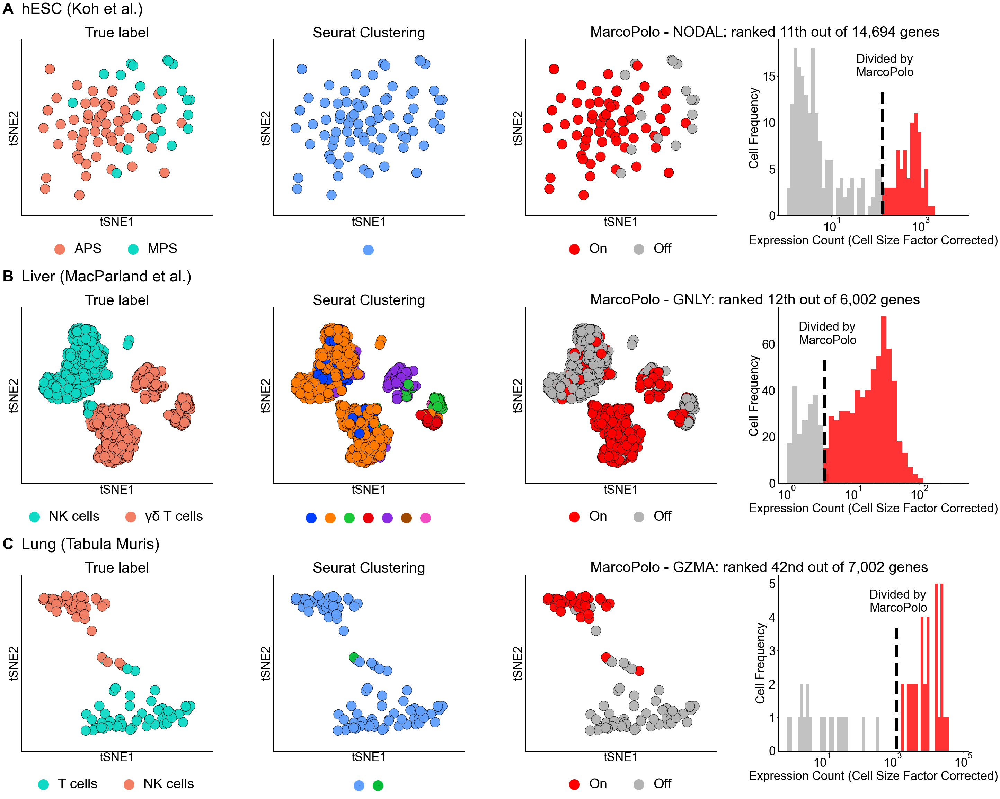

In [47]:
plt.rcParams["font.size"] = 35

fig = plt.figure(figsize=(10+10+10+10+3*3,10+10+10+10+4*3))
gs=fig.add_gridspec(10+10+10+10+5*3,10+10+10+10+3*3)

for idx,(_,gene_select) in enumerate(separable_genes.items()):
    dataset_name=gene_select['dataset_name']
    gene_name=gene_select['name']
    gene_symbol=gene_select['Symbol']
    phenoid=gene_select['phenoid']
    clusters=gene_select['clusters']
    clustering_result=gene_select['clustering_result']
    rank=gene_select['rank']
    tsne_coord=gene_select['tsne_coord']
    x_min_max=gene_select['x_min_max']
    y_min_max=gene_select['y_min_max']
    bin_max=gene_select['bin_max']
    vertical_x=gene_select['vertical_x']
    text_x=gene_select['text_x']

       #'vertical_x':0.6,'text_x':0.8,    
    
    exp_data_meta_transformed=exp_data_meta_dict[dataset_name]
    exp_data=exp_data_dict[dataset_name]
    exp_data_row=exp_data_row_dict[dataset_name]
    gamma_argmax_list=gamma_argmax_dict[dataset_name]
    exp_data_meta=exp_data_meta_dict[dataset_name]
    exp_data_s=exp_data_s_dict[dataset_name]
    
    
    exp_data_meta_transformed=exp_data_meta.copy()
    exp_data_meta_transformed['TSNE_1']=tsne_coord['tSNE_1']
    exp_data_meta_transformed['TSNE_2']=tsne_coord['tSNE_2']
    
    exp_data_meta_transformed['seurat_clusters']=clustering_result['seurat_clusters']
    
    gene_on=gamma_argmax_list[exp_data_row.index(gene_name)]==0
    exp_data_meta_transformed['on-off']='Off'
    exp_data_meta_transformed['on-off'][gene_on]='On'        
    
    if idx<3:
        exp_data_meta_transformed_sub=exp_data_meta_transformed[exp_data_meta_transformed['phenoid'].map(lambda x : x in clusters)]
        exp_data_meta_transformed_sub=\
        exp_data_meta_transformed_sub[
            (exp_data_meta_transformed_sub['TSNE_1']>=exp_data_meta_transformed_sub['TSNE_1'].sort_values().iloc[x_min_max[0]])&
            (exp_data_meta_transformed_sub['TSNE_1']<=exp_data_meta_transformed_sub['TSNE_1'].sort_values().iloc[x_min_max[1]])&
            (exp_data_meta_transformed_sub['TSNE_2']>=exp_data_meta_transformed_sub['TSNE_2'].sort_values().iloc[y_min_max[0]])&
            (exp_data_meta_transformed_sub['TSNE_2']<=exp_data_meta_transformed_sub['TSNE_2'].sort_values().iloc[y_min_max[1]])
        ]
    else:
        exp_data_meta_transformed_sub=exp_data_meta_transformed.loc[exp_data_meta_transformed_sub.index]
    
    
    
    #down right
    

    
    #True label
    fig_sub1=fig.add_subplot(gs[idx*15:idx*15+10,0:10])
    
    
    plot_value=exp_data_meta_transformed_sub['phenoid']
    plot_value_unique=plot_value.unique().tolist()
    plot_value_int=list(map(lambda x: plot_value_unique.index(x),plot_value))   
    
    if len(plot_value_unique)==1:
        palette=[np.array(color_qual_3[2])]
    elif len(plot_value_unique)==2:
        palette=color_qual_2
    elif len(plot_value_unique)==3:
        palette=[np.array(color_qual_3[2]),np.array(color_qual_3[1]),np.array(color_qual_3[0])]                
    else:
        raise
    if idx==0:
        palette=palette[::-1]
    
    sns.scatterplot(x="TSNE_1", y="TSNE_2",hue=list(map(lambda x: celltype_mapper(x,True),plot_value.values)),
                    data=exp_data_meta_transformed_sub,
                    palette=palette,
                    ax=fig_sub1,alpha=0.95,edgecolor="black",linewidth=1,
                    s=800
                   )    
    
    tsne_1=exp_data_meta_transformed_sub['TSNE_1']
    tsne_1_min=tsne_1.min();tsne_1_max=tsne_1.max()#tsne_1_min=tsne_1.sort_values().iloc[1];tsne_1_max=tsne_1.sort_values().iloc[-2]
    fig_sub1.set_xlim([tsne_1_min-(tsne_1_max-tsne_1_min)*0.15,tsne_1_max+(tsne_1_max-tsne_1_min)*0.15])    
    tsne_2=exp_data_meta_transformed_sub['TSNE_2']
    tsne_2_min=tsne_2.min();tsne_2_max=tsne_2.max()#tsne_2_min=tsne_2.sort_values().iloc[1];tsne_2_max=tsne_2.sort_values().iloc[-2]
    fig_sub1.set_ylim([tsne_2_min-(tsne_2_max-tsne_2_min)*0.15,tsne_2_max+(tsne_2_max-tsne_2_min)*0.15])  
    
    leg=fig_sub1.legend(loc='lower center',
                #bbox_to_anchor=(0.45,-0.1),
                bbox_to_anchor=(0.5, -0.3),# if idx<2 else (0.5, -0.42),
                handlelength=0.5,
                markerscale=5,
                ncol=2,
                fontsize=40)     

    
    for axis in ['top','bottom','left','right']:
        fig_sub1.spines[axis].set_linewidth(3) 
    fig_sub1.spines['right'].set_visible(False)
    fig_sub1.spines['top'].set_visible(False)     
    fig_sub1.set_xticks([])
    fig_sub1.set_yticks([])       
    fig_sub1.set_xlabel('tSNE1')
    fig_sub1.set_ylabel('tSNE2')        
    
    fig_sub1.set_title('True label')    
    
    if idx!=3:
        fig_sub1.text(-0.1, 1.15,
                      '{} {}'.format('abcd'[idx].upper(),''),

                      fontproperties=font_prop(bold=True,size=45), transform=fig_sub1.transAxes)
        fig_sub1.text(-0., 1.15,
                      '{}'.format(dataset_name_mapper(dataset_name)),

                      fontproperties=font_prop(bold=False,size=45), transform=fig_sub1.transAxes)        
    
    #Seurat
 
    fig_sub2=fig.add_subplot(gs[idx*15:idx*15+10,10+3:20+3])
    
    
    plot_value=exp_data_meta_transformed_sub['seurat_clusters']
    plot_value=plot_value.map(lambda x: plot_value.unique().tolist().index(x))
    plot_value=plot_value.map(lambda x: 'Cluster {}'.format(x+1))
    #list(map(lambda x: 'Cluster {}'.format(x),plot_value))#'Cluster '+plot_value.astype(int)
    
    plot_value_unique=plot_value.unique().tolist()
    print(plot_value_unique)
    plot_value_int=list(map(lambda x: plot_value_unique.index(x),plot_value))      
    
    
    if len(plot_value_unique)==1:
        palette=[np.array(color_qual_3[2])]
    elif len(plot_value_unique)==2:
        palette=[np.array(color_qual_3[2]),np.array(color_qual_3[1])]
    elif len(plot_value_unique)<6:
        palette=color_qual_6[:len(plot_value_unique)]
    else:
        palette=sns.color_palette("bright",len(plot_value_unique))
        #raise    
    
    sns.scatterplot(x="TSNE_1", y="TSNE_2",hue=list(map(lambda x: celltype_mapper(x,True),plot_value.values)),
                    data=exp_data_meta_transformed_sub,
                    palette=palette,
                    ax=fig_sub2,alpha=0.95,edgecolor="black",linewidth=1,
                    s=800
                   )    
    
    tsne_1=exp_data_meta_transformed_sub['TSNE_1']
    tsne_1_min=tsne_1.min();tsne_1_max=tsne_1.max()#tsne_1_min=tsne_1.sort_values().iloc[1];tsne_1_max=tsne_1.sort_values().iloc[-2]
    fig_sub2.set_xlim([tsne_1_min-(tsne_1_max-tsne_1_min)*0.15,tsne_1_max+(tsne_1_max-tsne_1_min)*0.15])    
    tsne_2=exp_data_meta_transformed_sub['TSNE_2']
    tsne_2_min=tsne_2.min();tsne_2_max=tsne_2.max()#tsne_2_min=tsne_2.sort_values().iloc[1];tsne_2_max=tsne_2.sort_values().iloc[-2]
    fig_sub2.set_ylim([tsne_2_min-(tsne_2_max-tsne_2_min)*0.15,tsne_2_max+(tsne_2_max-tsne_2_min)*0.15])  
    
    leg=fig_sub2.legend(loc='lower center',
                #bbox_to_anchor=(0.45,-0.1),
                bbox_to_anchor=(0.5, -0.2),
                handlelength=0.5,
                markerscale=5,
                columnspacing=50,
                ncol=10,
                fontsize=0,
                       )       
    #fig_sub2.get_legend().remove()
    
    for axis in ['top','bottom','left','right']:
        fig_sub2.spines[axis].set_linewidth(3) 
    fig_sub2.spines['right'].set_visible(False)
    fig_sub2.spines['top'].set_visible(False)     
    fig_sub2.set_xticks([])
    fig_sub2.set_yticks([])  
    
    fig_sub2.set_title('Seurat Clustering')
    fig_sub2.set_xlabel('tSNE1')
    fig_sub2.set_ylabel('tSNE2')      
    
    
    #MarcoPolo
    fig_sub3=fig.add_subplot(gs[idx*15:idx*15+10,20+6:30+6])

    
    
    plot_value=exp_data_meta_transformed_sub['on-off']
    plot_value_unique=plot_value.unique().tolist()
    plot_value_int=list(map(lambda x: plot_value_unique.index(x),plot_value))   

    
    sns.scatterplot(x="TSNE_1", y="TSNE_2",hue=list(map(celltype_mapper,plot_value.values)),
                    data=exp_data_meta_transformed_sub,
                    palette=[[0.7,0.7,0.7,1],[1,0,0,1]] if plot_value.iloc[0]=='Off' else [[1,0,0,1],[0.7,0.7,0.7,1]],
                    ax=fig_sub3,alpha=0.95,edgecolor="black",linewidth=1,
                    s=800,
                   )
    """
    sns.scatterplot(x="TSNE_1", y="TSNE_2",
                    data=exp_data_meta_transformed_sub[plot_value.values=='Off'],
                    color=[0.7,0.7,0.7,1],
                    ax=fig_sub3,alpha=0.95,edgecolor="black",linewidth=1,
                    label='Off',
                    s=800,
                   )    
    sns.scatterplot(x="TSNE_1", y="TSNE_2",
                    data=exp_data_meta_transformed_sub[plot_value.values=='On'],
                    color=[1,0,0,1],
                    ax=fig_sub3,alpha=0.95,edgecolor="black",linewidth=1,
                    label='On',
                    s=800,
                   )     
    """
    tsne_1=exp_data_meta_transformed_sub['TSNE_1']
    tsne_1_min=tsne_1.min();tsne_1_max=tsne_1.max()#tsne_1_min=tsne_1.sort_values().iloc[1];tsne_1_max=tsne_1.sort_values().iloc[-2]
    fig_sub3.set_xlim([tsne_1_min-(tsne_1_max-tsne_1_min)*0.15,tsne_1_max+(tsne_1_max-tsne_1_min)*0.15])    
    
    tsne_2=exp_data_meta_transformed_sub['TSNE_2']
    tsne_2_min=tsne_2.min();tsne_2_max=tsne_2.max()#tsne_2_min=tsne_2.sort_values().iloc[1];tsne_2_max=tsne_2.sort_values().iloc[-2]
    fig_sub3.set_ylim([tsne_2_min-(tsne_2_max-tsne_2_min)*0.15,tsne_2_max+(tsne_2_max-tsne_2_min)*0.15])    
    
    handles, labels = fig_sub3.get_legend_handles_labels()
    order = [labels.index('On'),labels.index('Off')]
    #plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])
    
    leg=fig_sub3.legend(
        [handles[idx] for idx in order],[labels[idx] for idx in order],
        loc='lower center',
                #bbox_to_anchor=(0.45,-0.1),
                bbox_to_anchor=(0.5, -0.3),
                handlelength=0.5,
                markerscale=5,
                ncol=2,
                fontsize=40)       
    
    
    for axis in ['top','bottom','left','right']:
        fig_sub3.spines[axis].set_linewidth(3) 
    fig_sub3.spines['right'].set_visible(False)
    fig_sub3.spines['top'].set_visible(False)     
    fig_sub3.set_xticks([])
    fig_sub3.set_yticks([])  
    
    fig_sub3.set_title('                MarcoPolo - {}: ranked {} out of {:,} genes'.format(gene_symbol,rank,len(exp_data_row)),
                      loc='left',
                      pad=10
                      )    
    fig_sub3.set_xlabel('tSNE1')
    fig_sub3.set_ylabel('tSNE2')    
    
    
    
    
    #Historgram
    if idx==3:
        continue
    
    fig_sub4=fig.add_subplot(gs[idx*15:idx*15+10,30+9:40+9])    
    
    for axis in ['top','bottom','left','right']:
        fig_sub4.spines[axis].set_linewidth(3) 
    fig_sub4.spines['right'].set_visible(False)
    fig_sub4.spines['top'].set_visible(False)     
    #fig_sub4.set_xticks([])
    #fig_sub4.set_yticks([]) 
    
    fig_sub4.set_xlabel('Expression Count (Cell Size Factor Corrected)')
    fig_sub4.set_ylabel('Cell Frequency')      
    
    fig_sub4.set_xscale('log')

    bins=[np.power(1.2,i) for i in range(int(np.log(bin_max)/np.log(1.2)))]
    print(np.max(exp_data),bins[-2],bins[-1])
    
    data_off=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)[
        #exp_data_meta_transformed['phenoid'].map(lambda x: x in clusters)
        (gamma_argmax_list[exp_data_row.index(gene_name)]==1)]
   
    hist_bin=fig_sub4.hist(data_off,
                 alpha=0.8,
                 bins=bins,
                color=[0.7,0.7,0.7,1],
                label='Off'
                 )
    
    data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)[
        #exp_data_meta_transformed['phenoid'].map(lambda x: x in clusters)
        (gamma_argmax_list[exp_data_row.index(gene_name)]==0)]
    
  
    hist_bin=fig_sub4.hist(data_on,
                 alpha=0.8,
                 bins=bins,
                color=[1,0,0,1],
                label='On'
                 )    
    
    data_on=exp_data[exp_data_row.index(gene_name)][gamma_argmax_list[exp_data_row.index(gene_name)]==0]
    data_off=exp_data[exp_data_row.index(gene_name)][gamma_argmax_list[exp_data_row.index(gene_name)]==1]

    thres=(min(data_on)+max(data_off))/2
    #thres=(min(data_on))
    print('data on',min(data_on))
    print('data off',max(data_off))    
    
    fig_sub4.axvline(x=vertical_x,ymin=0.01, ymax=0.7, c=(0,0,0), linestyle='--',linewidth=10,alpha=1)
    #fig_dist.text(thres-250,25, "Divided by \nMarcoPolo", verticalalignment='center',fontsize=40,transform=fig_dist.transAxes)
    fig_sub4.text(text_x,0.85, "Divided by \nMarcoPolo", verticalalignment='center',fontsize=35,transform=fig_sub4.transAxes)

    fig_sub4.set_xscale('log')  
    correct_check=(exp_data_meta_transformed_sub['phenoid'].map(lambda x: exp_data_meta_transformed_sub['phenoid'].unique().tolist().index(x)))\
    ==(exp_data_meta_transformed_sub['on-off'].map(lambda x: exp_data_meta_transformed_sub['on-off'].unique().tolist().index(x)))
    #prop=correct_check[exp_data_meta_transformed_sub['on-off']=='On'].sum()/(exp_data_meta_transformed_sub['on-off']=='On').sum()
    prop=correct_check.sum()/len(exp_data_meta_transformed_sub['on-off']=='On')
    print(prop)


In [48]:
fig.savefig('pub/typefinding_marker.png', bbox_inches='tight')
fig.savefig('pub/typefinding_marker.svg', bbox_inches='tight')

0.9213483146067416


A21.MAA000530.3_8_M.1.1     0
A22.MAA000530.3_8_M.1.1     1
A22.MAA000891.3_10_M.1.1    0
A4.MAA001889.3_38_F.1.1     0
A6.MAA001889.3_38_F.1.1     1
                           ..
P20.MAA001847.3_39_F.1.1    0
P21.MAA000526.3_9_M.1.1     1
P21.MAA000530.3_8_M.1.1     1
P22.MAA000530.3_8_M.1.1     0
P8.MAA001889.3_38_F.1.1     0
Name: on-off, Length: 89, dtype: int64

In [294]:
exp_data_meta_transformed_sub

,nReads,orig.ident,plate.barcode,mouse.id,tissue,subtissue,FACS.selection,mouse.sex,percent.ercc,free_annotation,...,cell_ontology_id,nCount_RNA,nFeature_RNA,phenoid,RNA_snn_res.2,seurat_clusters,ident,TSNE_1,TSNE_2,on-off
A21.MAA000530.3_8_M.1.1,556785,1,3,9,10,1,5,2,0.060229,NaN,...,CL:0000084,556785,1786,T cell,14,7,14,-14.186372,16.628301,Off
A22.MAA000530.3_8_M.1.1,456930,1,3,9,10,1,5,2,0.049955,NaN,...,CL:0000623,456930,1890,natural killer cell,17,7,17,-18.060713,24.983023,On
A22.MAA000891.3_10_M.1.1,661534,1,5,1,10,1,5,2,0.063995,NaN,...,CL:0000084,661534,1694,T cell,14,7,14,-16.689004,16.304853,Off
A4.MAA001889.3_38_F.1.1,1181427,1,7,4,10,12,5,1,0.093224,NaN,...,CL:0000084,1181427,2176,T cell,14,7,14,-16.947730,15.891677,Off
A6.MAA001889.3_38_F.1.1,1399455,1,7,4,10,12,5,1,0.063264,NaN,...,CL:0000623,1399455,1498,natural killer cell,17,7,17,-18.131554,25.521206,On
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P20.MAA001847.3_39_F.1.1,115520,1,6,6,10,12,5,1,0.067342,NaN,...,CL:0000084,115520,1665,T cell,14,7,14,-15.523986,15.776507,Off
P21.MAA000526.3_9_M.1.1,229161,1,2,10,10,1,5,2,0.039330,NaN,...,CL:0000623,229161,2648,natural killer cell,17,7,17,-16.690543,24.849354,On
P21.MAA000530.3_8_M.1.1,308999,1,3,9,10,1,5,2,0.067758,NaN,...,CL:0000623,308999,1879,natural killer cell,17,7,17,-17.554076,25.607273,On
P22.MAA000530.3_8_M.1.1,528912,1,3,9,10,1,5,2,0.027349,NaN,...,CL:0000084,528912,2235,T cell,14,7,14,-13.945920,17.167032,Off


In [62]:
MarcoPolo_gene

'IGLC2'

In [63]:
dataset_name

'HumanLiver_filtered'

,QQratio,intersectioncount,PCstd,lfc,mean_0_all,minorsize,maxdiff,ismarker,QQratio_rank,intersectioncount_rank,PCstd_rank,lfc_rank,mean_0_all_rank,minorsize_rank,votingscore_rank,bimodalityscore_rank,proximityscore_rank,MarcoPolo,MarcoPolo_rank
0,2.213649,10,13.053295,0.290412,66.987486,3123,0.064384,False,1166,1610,1536,5992,26,390,6002,6002,6002,6002,5992
1,2.246334,10,12.471771,0.341455,57.774810,3078,0.175581,False,1146,1578,1332,5977,31,419,6002,6002,6002,6002,5977
2,2.246303,10,12.869725,0.333241,60.100834,2589,0.078044,False,1147,1593,1471,5980,29,738,6002,6002,6002,6002,5980
3,2.130834,11,12.801510,0.292788,36.613193,3048,0.074717,False,1195,1550,1451,5991,37,440,6002,6002,6002,6002,5991
4,2.044708,10,12.615721,0.261809,22.245148,3406,0.068590,False,1223,1596,1379,5998,49,213,6002,6002,6002,6002,5998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5997,-0.489508,87,11.616116,3.937719,1.025937,498,0.402425,False,1469,718,1126,1106,3938,5837,718,1469,1126,718,1656
5998,-0.487615,1,15.524941,3.933499,1.016015,486,0.494996,False,1465,999999,4236,1186,4363,5872,999999,1465,4236,1465,2479
5999,-0.494298,1,15.966804,3.624115,0.996538,525,0.154942,False,1487,999999,5383,1943,5361,5686,999999,1487,5383,1487,2511
6000,-0.496521,1,15.874945,3.630692,1.011748,487,0.194813,False,1498,999999,5202,1815,4590,5867,999999,1498,5202,1498,2527


['Primitive streak' 'Embryonic stem cell']
['Embryo']
84
9
6


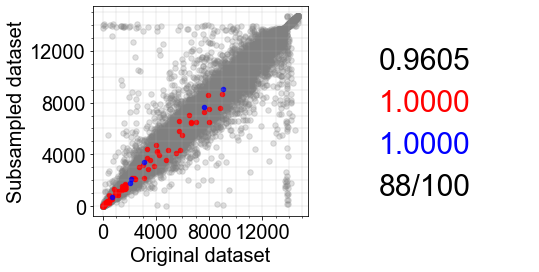

In [175]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)

plt.rcParams["font.size"] = 20

allscore=pd.read_csv('datasets/extract/{}.MarcoPolo.{}.rank.tsv'.format('Kohinbulk_filtered',2),sep='\t',index_col=0)
allscore2=pd.read_csv('datasets/extract/{}.MarcoPolo.{}.rank.tsv'.format('Kohinbulk2_filtered',2),sep='\t',index_col=0)
allscore3=pd.read_csv('datasets/extract/{}.MarcoPolo.{}.rank.tsv'.format('Kohinbulk3_filtered',2),sep='\t',index_col=0)

dataset_name='Kohinbulk_filtered'

with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]

marker1=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=100,lfc=2)
marker2=load_marker(dataset_name,method='cellmarker_panglao',num_genes=100,lfc=2)


fig = plt.figure(figsize=(30, 30)) 
gs=fig.add_gridspec(30,30)

fig_sub1=fig.add_subplot(gs[0:4,0:4]) 

fig_sub1.scatter(x=allscore['MarcoPolo_rank'],
                y=allscore2['MarcoPolo_rank'],
                s=30,
                color='grey',
                alpha=0.25
                )

fig_sub1.scatter(x=allscore['MarcoPolo_rank'][[i in marker1 for i in exp_data_row]],
                y=allscore2['MarcoPolo_rank'][[i in marker1 for i in exp_data_row]],
                s=20,
                color='red',
                alpha=0.8
                )

fig_sub1.scatter(x=allscore['MarcoPolo_rank'][[i in marker2 for i in exp_data_row]],
                y=allscore2['MarcoPolo_rank'][[i in marker2 for i in exp_data_row]],
                s=20,
                color='blue',
                alpha=0.8
                )

fig_sub1.xaxis.set_major_locator(MultipleLocator(4000))
fig_sub1.yaxis.set_major_locator(MultipleLocator(4000))


fig_sub1.yaxis.set_minor_locator(MultipleLocator(1000))
fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            

fig_sub1.xaxis.set_minor_locator(MultipleLocator(1000))
fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)  

#fig_sub1.spines['right'].set_visible(False)
#fig_sub1.spines['top'].set_visible(False)  
fig_sub1.set_xlabel('Original dataset')
fig_sub1.set_ylabel('Subsampled dataset')




fig_sub1=fig.add_subplot(gs[0:0+4,4:4+4])

r_result=stats.spearmanr(allscore['MarcoPolo_rank'], allscore2['MarcoPolo_rank'])
r_result1=stats.spearmanr(allscore['MarcoPolo_rank'][[i in marker1 for i in exp_data_row]],
                          allscore['MarcoPolo_rank'][[i in marker1 for i in exp_data_row]])
r_result2=stats.spearmanr(allscore['MarcoPolo_rank'][[i in marker2 for i in exp_data_row]],
                          allscore['MarcoPolo_rank'][[i in marker2 for i in exp_data_row]])

fig_sub1.text(x=0.5, y=0.7, s='{:.4f}'.format(r_result[0]),size=30,
             horizontalalignment='center',
             )

fig_sub1.text(x=0.5, y=0.1, s='{:d}/100'.format(
            len(allscore['MarcoPolo_rank'][allscore['MarcoPolo_rank']<100].index.intersection(
                
                allscore2['MarcoPolo_rank'][allscore2['MarcoPolo_rank']<100].index))),
                     size=30,color='black',
                     horizontalalignment='center') 

fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result1[0]),size=30,color='red',
             horizontalalignment='center',
             )
fig_sub1.text(x=0.5, y=0.3, s='{:.4f}'.format(r_result2[0]),size=30,color='blue',
             horizontalalignment='center',
             ) 
        


fig_sub1.axis('off')

fig.savefig('pub/subsample.png', bbox_inches='tight')
fig.savefig('pub/subsample.jpg', bbox_inches='tight')
fig.savefig('pub/subsample.svg', bbox_inches='tight')

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,


In [45]:
marker1

array(['ENSG00000241186', 'ENSG00000116729', 'ENSG00000164458',
       'ENSG00000168542', 'ENSG00000254934', 'ENSG00000112759',
       'ENSG00000118777', 'ENSG00000167244', 'ENSG00000113361',
       'ENSG00000136158', 'ENSG00000261409', 'ENSG00000113722',
       'ENSG00000116667', 'ENSG00000165895', 'ENSG00000128918',
       'ENSG00000124762', 'ENSG00000152785', 'ENSG00000139329',
       'ENSG00000183691', 'ENSG00000136732', 'ENSG00000166963',
       'ENSG00000145337', 'ENSG00000164344', 'ENSG00000162496',
       'ENSG00000092607', 'ENSG00000164142', 'ENSG00000103241',
       'ENSG00000159251', 'ENSG00000130224', 'ENSG00000114745',
       'ENSG00000166140', 'ENSG00000006128', 'ENSG00000172201',
       'ENSG00000231134', 'ENSG00000249152', 'ENSG00000136698',
       'ENSG00000103024', 'ENSG00000183665', 'ENSG00000147596',
       'ENSG00000280516', 'ENSG00000169964', 'ENSG00000280780',
       'ENSG00000172059', 'ENSG00000113196', 'ENSG00000162849',
       'ENSG00000256235', 'ENSG000001521

In [22]:
from scipy import stats
stats.spearmanr(allscore['MarcoPolo_rank'],allscore2['MarcoPolo_rank'])[0]

0.9604944518984985

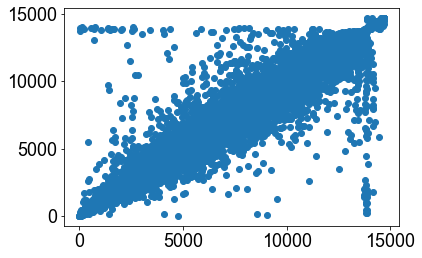

In [21]:
plt.scatter(allscore['MarcoPolo_rank'],allscore2['MarcoPolo_rank'])

In [24]:
stats.spearmanr(allscore['MarcoPolo_rank'],allscore3['MarcoPolo_rank'])

SpearmanrResult(correlation=0.7995996293185503, pvalue=0.0)

In [24]:
stats.spearmanr(allscore['MarcoPolo_rank'],allscore3['MarcoPolo_rank'])

SpearmanrResult(correlation=0.7995996293185503, pvalue=0.0)

In [26]:
stats.spearmanr(allscore3['MarcoPolo_rank'],allscore2['MarcoPolo_rank'])

SpearmanrResult(correlation=0.8086735369509399, pvalue=0.0)

# multiple

In [220]:
from scipy.stats import poisson
from scipy.special import gammaln

record_list1=[]

for idx,dataset_name in enumerate(dataset_name_all[:]):
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]

    #marker=load_marker(dataset_name,method='truelabel_maxdiff')        
    marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=500,lfc=2)          
    DE_bool=list(map(lambda x: x in marker, exp_data_row))
    
    allscore=pd.read_csv('datasets/extract/{}.MarcoPolo.{}.rank.tsv'.format(dataset_name,2),sep='\t',index_col=0)
    



    
    compare_df=allscore[['votingscore_rank','proximityscore_rank','bimodalityscore_rank',
                         'MarcoPolo_rank']].applymap(lambda x: -x).copy()


        #score=load_score(dataset_name,method)
        #auc=roc_auc_score(DE_bool,score)
    compare_df_result=compare_df.apply(lambda x:roc_auc_score(DE_bool,x))
    #compare_df_result=compare_df.apply(lambda x:get_metric(DE_bool,x>np.sort(x)[-100])['recall'])
    
    """
    record_list.append({
        'Dataset':dataset_name_mapper(dataset_name),
        'num_marker':np.sum(DE_bool),
        'Method':method_mapper(method),
        'AUC':auc,
        'Precision':metric['precision'],
        'Recall (FPR)':tpr_all[fpr_all>0.2][0],
        'Recall':metric['recall'],
        'F-score':metric['F1'],            
    })     
    """
    compare_df_result['dataset_name']=dataset_name

    record_list1.append(compare_df_result)    

Kohinbulk_filtered
HumanLiver_filtered
Zhengmix8eq_filtered
TabulaAorta_filtered
TabulaBladder_filtered
TabulaBrainMyeloid_filtered
TabulaBrainNonMyeloid_filtered
TabulaDiaphragm_filtered
TabulaFat_filtered
TabulaHeart_filtered
TabulaKidney_filtered
TabulaLargeIntestine_filtered
TabulaLimbMuscle_filtered
TabulaLiver_filtered
TabulaLung_filtered
TabulaMammaryGland_filtered
TabulaMarrow_filtered
TabulaPancreas_filtered
TabulaSkin_filtered
TabulaSpleen_filtered
TabulaThymus_filtered
TabulaTongue_filtered
TabulaTrachea_filtered


In [235]:
multiple_crit

,Voting system,Proximity score,Bimodality score,MarcoPolo score (Combined score)
dataset_name,,,,
hESC (Koh et al.),0.745584,0.808362,0.792570,0.825914
Liver (MacParland et al.),0.865018,0.865648,0.912423,0.900950
PBMC (Zheng et al.),0.911143,0.595215,0.840744,0.831624
Aorta (Tabula Muris),0.576890,0.685888,0.568027,0.585177
Bladder (Tabula Muris),0.945509,0.985761,0.854913,0.940151
Brain Myeloid (Tabula Muris),0.662083,0.517064,0.585380,0.649141
Brain Non-Myeloid (Tabula Muris),0.850127,0.887222,0.805501,0.864817
Diaphragm (Tabula Muris),0.790218,0.843187,0.773396,0.833366
Fat (Tabula Muris),0.876341,0.888439,0.841477,0.878070


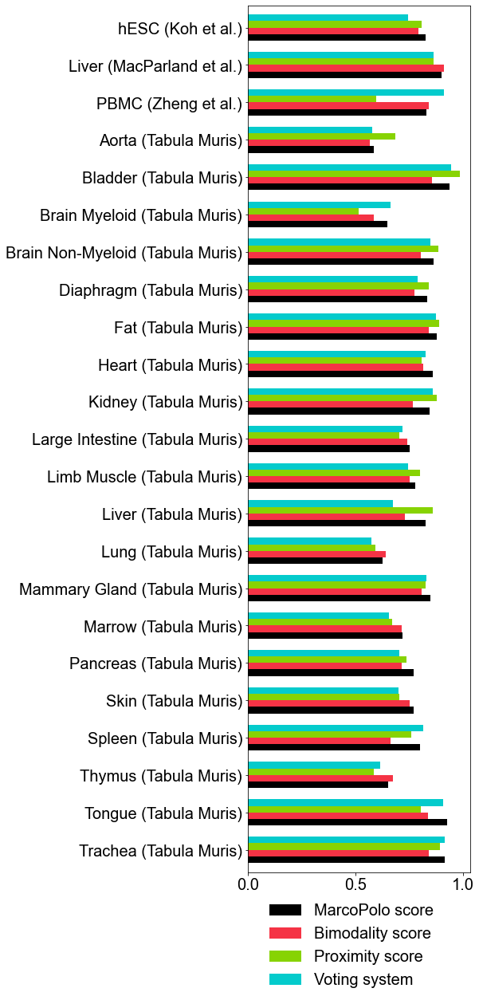

In [279]:

plt.rcParams["font.size"] = 20

fig = plt.figure(figsize=(5, 20)) 
#gs=fig.add_gridspec(25,25)
ax=fig.add_subplot()

multiple_crit=pd.DataFrame(record_list1).set_index('dataset_name')
multiple_crit.index=multiple_crit.index.map(dataset_name_mapper)
multiple_crit=multiple_crit.rename(columns={'votingscore_rank':'Voting system',
                      'proximityscore_rank':'Proximity score',
                      'bimodalityscore_rank':'Bimodality score',
                      'MarcoPolo_rank':'MarcoPolo score'
                     })

multiple_crit.iloc[::-1,::-1].plot.barh(ax=ax,color=['black']+color_qual_6[:3], width=0.7)
ax.set_ylabel('')

#ax.xaxis.grid(True,linewidth=0.4,alpha=0.6)
#ax.xaxis.grid(False,linewidth=0.4,alpha=0.6)
leg=ax.legend(loc='lower right',bbox_to_anchor=(0.9, -0.15), fontsize=20)


#fig_rocplot.spines['right'].set_visible(False)
#fig_rocplot.spines['top'].set_visible(False)
fig.savefig('pub/multiple_criteria.png', bbox_inches='tight')
fig.savefig('pub/multiple_criteria.jpg', bbox_inches='tight')
fig.savefig('pub/multiple_criteria.svg', bbox_inches='tight')


<AxesSubplot:ylabel='dataset_name'>

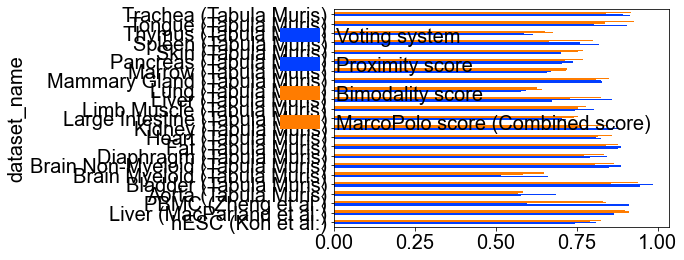

In [ ]:
from scipy import stats
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)


for dataset_name in ['TabulaMarrow_filtered','TabulaLung_filtered']:
    path='datasets/extract/{}'.format(dataset_name)
    
    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    
    marker1=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=100,lfc=2)
    marker2=load_marker(dataset_name,method='cellmarker_panglao',num_genes=100,lfc=2)

    voting_thres_range=[0.5,0.6,0.7,0.8,0.9]

    hyper_voting_thres=[]
    for voting_thres in voting_thres_range:
        result=pd.read_csv(path+'.hyperparamter.voting_thres.{}.MarcoPolo.2.rank.tsv'.format(str(voting_thres).replace('.','_')),sep='\t',index_col=0)
        hyper_voting_thres.append(result['MarcoPolo_rank'].tolist())
    hyper_voting_thres_df=pd.DataFrame(hyper_voting_thres,index=voting_thres_range).T


    param_range=voting_thres_range
    param_df=hyper_voting_thres_df


    plt.rcParams["font.size"] = 20

    fig = plt.figure(figsize=(25, 25)) 
    gs=fig.add_gridspec(25,25)


    for i in param_range:
        for j in param_range:
            if i<j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                r_result=stats.spearmanr(param_df[i], param_df[j])
                r_result1=stats.spearmanr(param_df[[i in marker1 for i in exp_data_row]][i],
                                          param_df[[i in marker1 for i in exp_data_row]][j])
                r_result2=stats.spearmanr(param_df[[i in marker2 for i in exp_data_row]][i],
                                          param_df[[i in marker2 for i in exp_data_row]][j])
                
                fig_sub1.text(x=0.5, y=0.7, s='{:.4f}'.format(r_result[0]),size=45,
                             horizontalalignment='center',
                             )
                fig_sub1.text(x=0.5, y=0.5, s='{:.4f}'.format(r_result1[0]),size=45,color='red',
                             horizontalalignment='center',
                             )
                fig_sub1.text(x=0.5, y=0.3, s='{:.4f}'.format(r_result2[0]),size=45,color='blue',
                             horizontalalignment='center',
                             )                
                
                
                fig_sub1.axis('off')

            elif i==j:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])   
                fig_sub1.text(x=0.5, y=0.5, s=str(i),
                              fontproperties=font_prop(bold=True,size=50),
                              horizontalalignment='center',
                             )
                fig_sub1.axis('off')
            else:
                fig_sub1=fig.add_subplot(gs[5*param_range.index(i) : 5*(param_range.index(i))+4,
                                            5*param_range.index(j) : 5*(param_range.index(j))+4])

                #param_df.plot.scatter(x=i ,y=j, ax=fig_sub1, s=30, alpha=0.8, color='grey')

                fig_sub1.scatter(x=param_df[i],
                                 y=param_df[j],
                                 s=30,
                                 color='grey',
                                 alpha=0.8
                                )
            
                fig_sub1.scatter(x=param_df[[i in marker1 for i in exp_data_row]][i],
                                 y=param_df[[i in marker1 for i in exp_data_row]][j],
                                 s=20,
                                 color='red',
                                 alpha=0.8
                                )
                
                fig_sub1.scatter(x=param_df[[i in marker2 for i in exp_data_row]][i],
                                 y=param_df[[i in marker2 for i in exp_data_row]][j],
                                 s=20,
                                 color='blue',
                                 alpha=0.8
                                )                
            
                #fig_sub1.set_yscale('log')
                fig_sub1.set_xlabel('')
                fig_sub1.set_ylabel('')

                fig_sub1.xaxis.set_major_locator(MultipleLocator(2000))
                fig_sub1.yaxis.set_major_locator(MultipleLocator(2000))

                fig_sub1.yaxis.set_minor_locator(MultipleLocator(100))
                fig_sub1.yaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)
                fig_sub1.yaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)            

                fig_sub1.xaxis.set_minor_locator(MultipleLocator(100))
                fig_sub1.xaxis.grid(True, which='minor',linewidth=0.4,alpha=0.6)            
                fig_sub1.xaxis.grid(True, which='major',linewidth=0.4,alpha=0.6)   

                fig_sub1.spines['right'].set_visible(False)
                fig_sub1.spines['top'].set_visible(False)            

    fig_sub=fig.add_subplot(gs[0:24,0:24])            
    fig_sub.axis('off')
    #fig_sub.set_xlabel('MarcoPolo rank')   
    #fig_sub.set_ylabel('MarcoPolo rank')  
    fig_sub.text(x=0.5, y=-0.06, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                )

    fig_sub.text(x=-0.07, y=0.5, s="MarcoPolo rank",
                  fontproperties=font_prop(bold=False,size=30),
                  horizontalalignment='center',
                 verticalalignment='center',
                 rotation=90
                )

    fig.savefig('pub/simul_sensitivity_voting_{}.png'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_voting_{}.jpg'.format(dataset_name), bbox_inches='tight')
    fig.savefig('pub/simul_sensitivity_voting_{}.svg'.format(dataset_name), bbox_inches='tight')

# compare

Kohinbulk_filtered
['Primitive streak' 'Embryonic stem cell']
['Embryo']
84
9
6
HumanLiver_filtered
['Liver']
['Liver']
834
115
66


NameError: name 'gene_name' is not defined

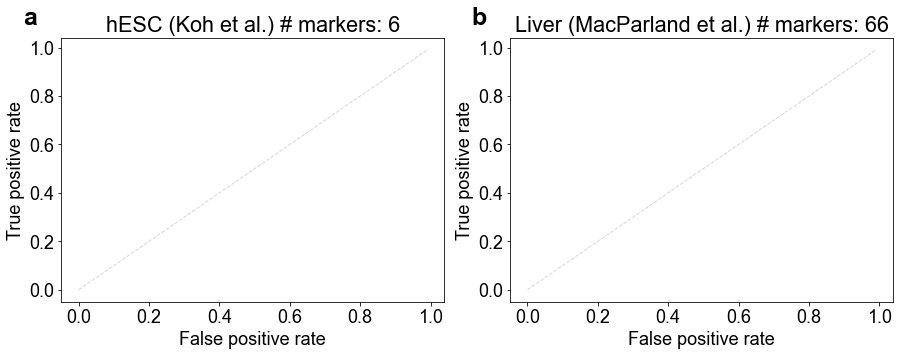

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [43]:
record_list_marker=[]

fig = plt.figure(figsize=((7+1)*4,(5+2)*6)) 
gs=fig.add_gridspec((5+2)*6,(7+1)*4)
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)


fpr_list=[]
tpr_list=[]
thresholds_list=[]
tpr_dict={}

for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')


    #marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=500,lfc=2)          
    marker=load_marker(dataset_name,method='cellmarker_panglao')
    #arker=marker1+marker2
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))
    #print(sum(DE_bool))
    fig_rocplot=fig.add_subplot(gs[7*(idx//4):7*(idx//4)+5,8*(idx%4):8*(idx%4)+7])
    #fig=plt.figure()
    #fig_rocplot=fig.add_subplot()
    fig_rocplot.text(-0.1, 1.05, 'abcdefghijklmnopqrstuvwxyz'[idx], fontproperties=font_prop(bold=True,size=25), transform=fig_rocplot.transAxes)
    
    fig_rocplot.set_xlabel('False positive rate')
    fig_rocplot.set_ylabel('True positive rate')
    
    fig_rocplot.plot(np.arange(0,1,0.01),np.arange(0,1,0.01),c=(0.8,0.8,0.8,0.8),linewidth=1.0,linestyle='--')
    
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    #fig_rocplot.set_title(
    #    '{}'.format(dataset_name_mapper(dataset_name)))  
    fig_rocplot.set_title(
        '{} # markers: {}'.format(dataset_name_mapper(dataset_name),sum(DE_bool)))    
    if sum(DE_bool)<=10:
        continue
        
        
    data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)[gamma_argmax_list[exp_data_row.index(gene_name)]==0]    
    bins=[np.power(1.5,i) for i in range(37)]
    #bins=np.clip(bins,a_min=0,a_max=exp_data.max())
    bins=[np.power(1.2,i) for i in range(int(np.log(bin_max)/np.log(1.2)))]
    fig_sub2.hist(data_on,
                  alpha=0.8,
                  bins=bins,
                  color=[1,0,0,1],
                  label='On'
                  )
    
    handles_on, labels_on=fig_sub2.get_legend_handles_labels()
    #legt=fig_sub2.legend(markerscale=0.0) 
    #[rec.set_height(5) for rec in leg.get_patches()]    
    
    fig_sub2.set_xscale('log')
    #fig_sub2.set_yscale('log')
    
        
    fig_sub2.set_xlabel('Expression Count (Cell Size Factor Corrected)')
    fig_sub2.set_ylabel('Cell Frequency')
    
    fig_sub2.spines['right'].set_visible(False)
    fig_sub2.spines['top'].set_visible(False)  
    
    

In [49]:
len(load_marker('Kohinbulk_filtered',method='truelabel_maxdiff',num_genes=500,lfc=4))

500

In [46]:
len(load_marker(dataset_name,method='truelabel_maxdiff',num_genes=500,lfc=4))

500

In [41]:
len(load_marker('Simul_5000_1e-2_8_filtered',method='truelabel_maxdiff',num_genes=500,lfc=2))

181

In [215]:
pd.DataFrame(record_list_marker)#['num_marker']

,Dataset,num_marker,num_cell,num_gene,num_type,min_pop_size,cv,Method,AUC,Precision,Recall (FPR),Recall,F-score
0,Liver (MacParland et al.),9,8444,6002,11,37,1.282723,MarcoPolo,0.868866,0.00,0.777778,0.000000,NaN
1,Liver (MacParland et al.),9,8444,6002,11,37,1.282723,HVG (VST),0.875800,0.00,0.888889,0.000000,NaN
2,Liver (MacParland et al.),9,8444,6002,11,37,1.282723,HVG (DISP),0.927230,0.00,1.000000,0.000000,NaN
3,Liver (MacParland et al.),9,8444,6002,11,37,1.282723,scHaystack,0.906354,0.00,0.888889,0.000000,NaN
4,Liver (MacParland et al.),9,8444,6002,11,37,1.282723,"Clustering+DE (0.5, default)",0.922280,0.01,0.888889,0.111111,0.018349
5,Liver (MacParland et al.),9,8444,6002,11,37,1.282723,"Clustering+DE (1.0, default)",0.916217,0.00,0.888889,0.000000,NaN
6,Liver (MacParland et al.),9,8444,6002,11,37,1.282723,"Clustering+DE (1.5, default)",0.924616,0.01,0.888889,0.111111,0.018349
7,Liver (MacParland et al.),9,8444,6002,11,37,1.282723,"Clustering+DE (0.5, no filter)",0.919313,0.01,0.888889,0.111111,0.018349
8,Liver (MacParland et al.),9,8444,6002,11,37,1.282723,"Clustering+DE (1.0, no filter)",0.911601,0.00,0.888889,0.000000,NaN
9,Liver (MacParland et al.),9,8444,6002,11,37,1.282723,"Clustering+DE (1.5, no filter)",0.922094,0.01,0.888889,0.111111,0.018349


In [ ]:
load

In [121]:

unique_genes={
    0:{'dataset_name':'Kohinbulk_filtered','name':'ENSG00000168542','Symbol':'COL3A1','phenoid':'Sclrtm','rank':'1st','bin_max':20000},
    1:{'dataset_name':'Kohinbulk_filtered','name':'ENSG00000254934','Symbol':'LINC00678','phenoid':'hESC','rank':'6th','bin_max':1500},
    2:{'dataset_name':'TabulaPancreas_filtered','name':'Sst','Symbol':'SST','phenoid':'Pan','rank':'1st','bin_max':1000000},
    3:{'dataset_name':'TabulaPancreas_filtered','name':'Gcg','Symbol':'GCG','phenoid':'','rank':'2nd','bin_max':1000000},
    4:{'dataset_name':'TabulaHeart_filtered','name':'C1qb','Symbol':'C1QB','phenoid':'D2LtM','rank':'1st','bin_max':50000},
    5:{'dataset_name':'TabulaHeart_filtered','name':'Dcn','Symbol':'DCN','phenoid':'D2LtM','rank':'11th','bin_max':100000},
}

In [255]:
load_marker('TabulaMarrow_filtered',method='cellmarker')

['Bone marrow']
1073
27
16


['Cd74',
 'Ptprc',
 'Foxp1',
 'Cd19',
 'Cd44',
 'Cd48',
 'Cd34',
 'Stat3',
 'Ly6a',
 'Itgam',
 'Itgb1',
 'Flt3',
 'Kit',
 'Etv6',
 'Csf1r',
 'Cd3d']

In [251]:
unique_genes={
    0:{'dataset_name':'HumanLiver_filtered','name':'CD3G','Symbol':'CD3G','phenoid':'Sclrtm','rank':'1st','bin_max':20000},
}

In [262]:
unique_genes={
    0:{'dataset_name':'TabulaMarrow_filtered','name':'Ptprc','Symbol':'Ptprc','phenoid':'Sclrtm','rank':'1st','bin_max':20000},
}

# subsample

In [15]:
result1=pd.read_csv("datasets/extract/Kohinbulk_filtered.MarcoPolo.2.rank.tsv",sep='\t',index_col=0)
result2=pd.read_csv("datasets/extract/Kohinbulk2_filtered.MarcoPolo.2.rank.tsv",sep='\t',index_col=0)

In [18]:
result1['MarcoPolo_rank'],result2['MarcoPolo_rank']

0        14440
1        14688
2        14689
3        14506
4        14403
         ...  
14689     8701
14690    11467
14691     2836
14692    12777
14693    13172
Name: MarcoPolo_rank, Length: 14694, dtype: int64

In [267]:
pd.read_csv('datasets/extract/TabulaMarrow_filtered.MarcoPolo.2.rank.tsv',sep='\t',index_col=0).loc[
    exp_data_row_dict['TabulaMarrow_filtered'].index('Ptprc')
]

QQratio                     3.206787
intersectioncount                 17
PCstd                      15.338418
lfc                         0.790418
mean_0_all                404.087678
minorsize                       1792
maxdiff                     0.186629
ismarker                       False
QQratio_rank                    4816
intersectioncount_rank          1766
PCstd_rank                      2901
lfc_rank                        6709
mean_0_all_rank                  366
minorsize_rank                   660
votingscore_rank                1766
bimodalityscore_rank             366
proximityscore_rank             2901
MarcoPolo                        366
MarcoPolo_rank                   915
Name: 159, dtype: object

In [268]:
unique_genes={}
cnt=0

for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')


    #marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=500,lfc=2)          
    marker=load_marker(dataset_name,method='cellmarker')
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    #fig_rocplot.set_title(
    #    '{}'.format(dataset_name_mapper(dataset_name)))  
    fig_rocplot.set_title(
        '{} # markers: {}'.format(dataset_name_mapper(dataset_name),sum(DE_bool)))    
    if sum(DE_bool)<=5:
        continue
    
    for m in marker:
        unique_genes[cnt]={'dataset_name':dataset_name,'name':m,'Symbol':m,'phenoid':'Sclrtm','rank':'1st','bin_max':20000}
        cnt+=1
    

Kohinbulk_filtered
['Primitive streak' 'Embryonic stem cell']
31
0
0
HumanLiver_filtered
['Liver']
604
18
9
Zhengmix8eq_filtered
['Peripheral blood']
409
31
15
TabulaAorta_filtered
[]
0
0
0
TabulaBladder_filtered
[]
0

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



0
0
TabulaBrainMyeloid_filtered
[]
0
0
0
TabulaBrainNonMyeloid_filtered
[]
0
0
0
TabulaDiaphragm_filtered
[]
0
0
0
TabulaFat_filtered
[]
0
0
0
TabulaHeart_filtered
['Heart']
47
0
0
TabulaKidney_filtered
['Kidney']
1495
1
0
TabulaLargeIntestine_filtered


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future v

[]
0
0
0
TabulaLimbMuscle_filtered
['Muscle']
18
1
1
TabulaLiver_filtered
['Liver']
74
3
2
TabulaLung_filtered
['Lung']
1374
6
3
TabulaMammaryGland_filtered
[]
0
0
0
TabulaMarrow_filtered
['Bone marrow']
1073
27
16
TabulaPancreas_filtered
['Pancreas']
15
0
0
TabulaSkin_filtered
['Skin']
12
0
0
TabulaSpleen_filtered
['Spleen']
541
10
7
TabulaThymus_filtered
['Thymus']
15
0
0
TabulaTongue_filtered
['Taste bud']
8
0
0
TabulaTrachea_filtered
['Trachea']
1811
1
0


/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:31: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/seaborn/_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/seaborn/_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/seaborn/_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/seaborn/_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PA

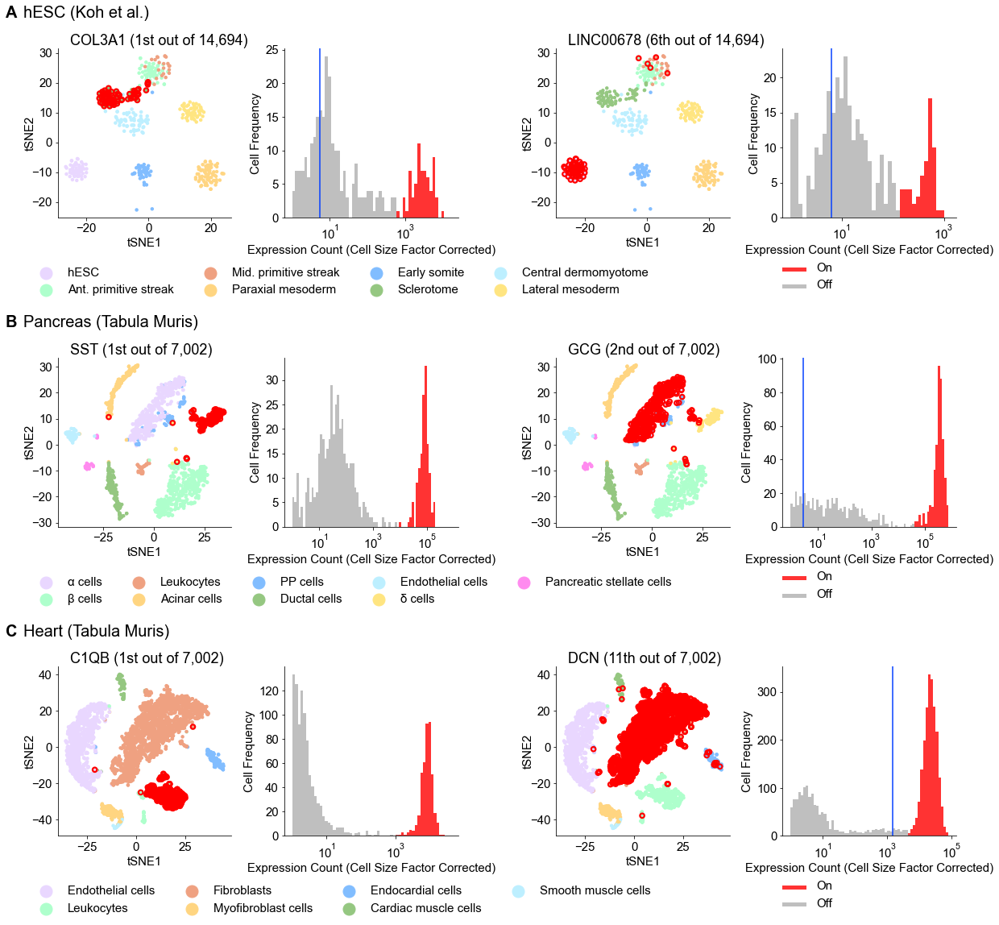

In [123]:
plt.rcParams["font.size"] = 15

fig = plt.figure(figsize=(5+1+4+1+5+1+4+1,5+2+5+2+5+1))
gs=fig.add_gridspec(5+2+5+2+5+1,5+1+4+1+5+1+4+1)

for idx,(_,gene_select) in enumerate(unique_genes.items()):
    dataset_name=gene_select['dataset_name']
    gene_name=gene_select['name']
    gene_symbol=gene_select['Symbol']
    phenoid=gene_select['phenoid']
    rank=gene_select['rank']
    bin_max=gene_select['bin_max']
    
    
    exp_data_meta_transformed=exp_data_meta_dict[dataset_name]
    exp_data=exp_data_dict[dataset_name]
    exp_data_row=exp_data_row_dict[dataset_name]
    exp_data_s=exp_data_s_dict[dataset_name]
    gamma_argmax_list=gamma_argmax_dict[dataset_name]
    
    if idx==0:
        idx1,idx2=0,0
    elif idx==1:
        idx1,idx2=0,11
    elif idx==2:
        idx1,idx2=7,0
    elif idx==3:
        idx1,idx2=7,11
    elif idx==4:
        idx1,idx2=14,0
    elif idx==5:
        idx1,idx2=14,11        
    #down,right
    fig_sub1=fig.add_subplot(gs[idx1:idx1+4,idx2:idx2+4])
    fig_sub2=fig.add_subplot(gs[idx1:idx1+4,idx2+5:idx2+5+4])
    
    # 5 7
    
    
    
    plot_value=exp_data_meta_transformed['phenoid']
    plot_value_unique=plot_value.unique().tolist()
    plot_value_int=list(map(lambda x: plot_value_unique.index(x),plot_value))       
    
    
    palette=np.array([
        [234,216,256,256], 
        
        [175,256,205,256],
        
        [240,162,130,256],         

        
        [256,214,130,256],
        
        #[100,100,256,256],

        [130,190,256,256],
        

        [150,200,130,256],   
        
        [190,240,256,256],       
        
        [256,230,130,256],
        
        [256,140,240,256],
        

    ])/256    
    
    #palette[:,-1]=0.2

    if dataset_name=='Kohinbulk_filtered':
        #palette = np.array(sns.color_palette('husl',9))#,len(plot_value_unique)+2))#[2::])
        pass
        #husl
        #palette[9][0]=0.5
        #palette*=0.9
        #palette=palette[[1,9,3,5,6,7,2,8]]
        # palplot을 통해 저장한 팔레트를 불러온다.
        #ns.palplot(palette)       

    elif dataset_name=='HumanLiver_filtered':
        pass
        #palette = np.array(sns.color_palette("Paired",len(plot_value_unique)+2)[2::])
        #palette[8]*=0.8
        #palette*=0.9
        #palette=palette[[0,2,4,6,8,10,3,1,5,7,9]]
        # palplot을 통해 저장한 팔레트를 불러온다.
        #sns.palplot(palette)

    elif dataset_name=='Zhengmix8eq_filtered':
        pass
        #palette = np.array(sns.color_palette("bright"))#,len(plot_value_unique)+2))#[2::])
        #palette[8]*=0.8
        #palette*=0.9
        #palette=palette[[1,9,5,3,2,8,6,7]]
        # palplot을 통해 저장한 팔레트를 불러온다.
        #sns.palplot(palette)       
    
    
    #s=30
    sns.scatterplot(x="TSNE_1", y="TSNE_2",hue=list(map(celltype_mapper,plot_value.values)), data=exp_data_meta_transformed,
                    palette=palette,
                    ax=fig_sub1,alpha=1,edgecolor="None",
                    s=20
                   )
    
    
    gene_select_on=gamma_argmax_list[exp_data_row.index(gene_select['name'])]==0
    #gene_select_on=exp_data_dict[dataset_name][exp_data_row.index(gene_select['name'])]>1
    
    
    sns.scatterplot(x="TSNE_1", y="TSNE_2",data=exp_data_meta_transformed.loc[gene_select_on],
                    ax=fig_sub1,
                    edgecolor=[1,0,0,1],
                    facecolors="None",
                    linewidth=2.2,
                    #alpha=0.5 if dataset_name in ['HumanLiver_filtered'] else 1,
                    s=30
                   )
    
    gene_select_off=gamma_argmax_list[exp_data_row.index(gene_select['name'])]==1
    #gene_select_on=exp_data_dict[dataset_name][exp_data_row.index(gene_select['name'])]>1
    
    """
    sns.scatterplot(x="TSNE_1", y="TSNE_2",data=exp_data_meta_transformed.loc[gene_select_off],
                    ax=fig_sub1,
                    edgecolor='grey',
                    facecolors="None",
                    linewidths=1,
                    alpha=0.5 if dataset_name in ['HumanLiver_filtered'] else 1,
                    s=s
                   )    
    """
    
    
    #              )
    #fig_sub1.title.set_text('{} - {}'.format(gene_symbol,celltype_mapper(phenoid)))
    #fig_sub1.title.se
    
    
    fig_sub1.set_title(label='   {} ({} out of {:,})'.format(gene_symbol,rank,len(exp_data_row)),
                       pad=0.2,
                       loc='left')
    
    fig_sub1.set_xlabel('tSNE1')
    fig_sub1.set_ylabel('tSNE2',labelpad=-5)
    
    fig_sub1.spines['right'].set_visible(False)
    fig_sub1.spines['top'].set_visible(False)
    
    
    
    if idx==0 or idx==2 or idx==4:
        fig_sub1.text(-0.3, 1.18, ['A ','B ','C '][int(idx/2)],
                      fontproperties=font_prop(bold=True,size=20), transform=fig_sub1.transAxes)
        fig_sub1.text(-0.2, 1.18,
                      '{}'.format(dataset_name_mapper(dataset_name,'full')),
                      fontproperties=font_prop(bold=False,size=20), transform=fig_sub1.transAxes)
        
        """
        fig_sub1.text(-0.1, 1.15,
                      '{}. {}'.format('abcd'[idx],''),

                      fontproperties=font_prop(bold=True,size=45), transform=fig_sub1.transAxes)
        fig_sub1.text(-0., 1.15,
                      '{}'.format(dataset_name_mapper(dataset_name)),

                      fontproperties=font_prop(bold=False,size=45), transform=fig_sub1.transAxes)        
        """
        
        leg=fig_sub1.legend(loc='upper left',
                    #bbox_to_anchor=(0.45,-0.1),
                    bbox_to_anchor=(-0.2, -0.23),
                    ncol=4 if idx!=2 else 5,
                    markerscale=2.5)        
    else:
        fig_sub1.legend().remove()

        
    data_on=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)[gamma_argmax_list[exp_data_row.index(gene_name)]==0]    
    bins=[np.power(1.5,i) for i in range(37)]
    #bins=np.clip(bins,a_min=0,a_max=exp_data.max())
    bins=[np.power(1.2,i) for i in range(int(np.log(bin_max)/np.log(1.2)))]
    fig_sub2.hist(data_on,
                  alpha=0.8,
                  bins=bins,
                  color=[1,0,0,1],
                  label='On'
                  )
    
    handles_on, labels_on=fig_sub2.get_legend_handles_labels()
    #legt=fig_sub2.legend(markerscale=0.0) 
    #[rec.set_height(5) for rec in leg.get_patches()]    
    
    fig_sub2.set_xscale('log')
    #fig_sub2.set_yscale('log')
    
        
    fig_sub2.set_xlabel('Expression Count (Cell Size Factor Corrected)')
    fig_sub2.set_ylabel('Cell Frequency')
    
    fig_sub2.spines['right'].set_visible(False)
    fig_sub2.spines['top'].set_visible(False)      
    

    
    data_off=(exp_data[exp_data_row.index(gene_name)]/exp_data_s)[gamma_argmax_list[exp_data_row.index(gene_name)]==1]
    
    #fig_sub2 = fig_sub2.twinx()
    hist_bin=fig_sub2.hist(data_off,
                 alpha=0.5,
                 bins=bins,
                 color='grey',
                 label='Off'                           
                 )
    
    
    #leg=fig_sub2.legend(markerscale=0.0) 
    handles_off, labels_off=fig_sub2.get_legend_handles_labels()
    #[rec.set_height(5) for rec in leg.get_patches()]
    
    median_cut=np.median(exp_data[exp_data_row.index(gene_name)])
    fig_sub2.axvline(x=median_cut)
    print(median_cut)
    #print(sorted(exp_data[exp_data_row.index(gene_name)]))
    #print(median_cut)
    """
    print(np.max(data_off))
    X = np.array([int(i) for i in hist_bin[1]])
    Y = poisson.pmf(X,np.mean(data_off))
    range_chek=(X>np.min(data_off)) & (X<np.max(data_off))
    X=X[range_chek]
    Y=Y[range_chek]
    
    fig_sub2.plot(X, len(data_off)*Y, linewidth=10)
    """
    
    
    #fig_sub2.set_xscale('log')
    #fig_sub2.set_yscale('log')
    
        
    #fig_sub2.set_xlabel('Expression Count (cell size factor corrected)')
    #fig_sub2.set_ylabel('Cell Frequency (Off)',labelpad=10)
    
    #fig_sub2.spines['right'].set_visible(False)
    #fig_sub2.spines['top'].set_visible(False)  
    
    if idx%2==1:
        leg=fig_sub2.legend(handles_off, labels_off,bbox_to_anchor=(0.35, -0.2))
        [rec.set_height(5) for rec in leg.get_patches()]
        
        
        
        

In [124]:
fig.savefig('pub/top_makers.png', bbox_inches='tight')
fig.savefig('pub/top_makers.jpg', bbox_inches='tight')
fig.savefig('pub/top_makers.svg', bbox_inches='tight')

# robustness

In [127]:
def true_pred_distinguish(true_array,pred_array):
    true_array=true_array.copy()
    pred_array=pred_array.copy()
    
    true_unique=np.unique(true_array)
    
    assert len(true_unique)==2
    
    
    
    for pred in pred_array.unique():
        true_select=true_array[pred_array==pred]
        pred_select=pred_array[pred_array==pred]
        
        prop_0=np.sum(true_select==true_unique[0])/len(true_select)
        prop_1=np.sum(true_select==true_unique[1])/len(true_select)
        
        if prop_0>0.8:
            pred_array[pred_array==pred]=true_unique[0]
        elif prop_1>0.8:
            pred_array[pred_array==pred]=true_unique[1]
        else:
            pred_array[pred_array==pred]='None'
     
    #print([(label,np.sum(pred_array==label)) for label in np.unique(pred_array)]) 
    #print(np.sum(pred_array==true_array),len(pred_array))
    
    return np.sum(pred_array==true_array)/len(pred_array)

#true_pred_distinguish(true[bool_rare],pred[bool_rare])    

In [128]:
record_list=[]

for dataset_name in ['Kohinbulk_filtered','TabulaLung_filtered','HumanLiver_filtered']:   

    robustness_10=pd.read_csv('datasets/extract/{}.clusteringrobustness.top10.tsv'.format(dataset_name),sep='\t')
    robustness_10.columns=[robustness_10.columns[0]]+(robustness_10.columns[1:]+'-10').tolist()
    
    robustness_15=pd.read_csv('datasets/extract/{}.clusteringrobustness.top15.tsv'.format(dataset_name),sep='\t')
    robustness_15.columns=[robustness_15.columns[0]]+(robustness_15.columns[1:]+'-15').tolist()    
    
    robustness_20=pd.read_csv('datasets/extract/{}.clusteringrobustness.top20.tsv'.format(dataset_name),sep='\t')
    robustness_20.columns=[robustness_20.columns[0]]+(robustness_20.columns[1:]+'-20').tolist()        
    
    robustness_25=pd.read_csv('datasets/extract/{}.clusteringrobustness.top25.tsv'.format(dataset_name),sep='\t')
    robustness_25.columns=[robustness_25.columns[0]]+(robustness_25.columns[1:]+'-25').tolist()            
    
    robustness_30=pd.read_csv('datasets/extract/{}.clusteringrobustness.top30.tsv'.format(dataset_name),sep='\t')
    robustness_30.columns=[robustness_30.columns[0]]+(robustness_30.columns[1:]+'-30').tolist()    
    
    #robustness_50=pd.read_csv('datasets/extract/{}.clusteringrobustness.top50.tsv'.format(dataset_name),sep='\t')
    #robustness_50.columns=[robustness_50.columns[0]]+(robustness_50.columns[1:]+'-50').tolist()    
    
    robustness=pd.concat([robustness_10,
                          robustness_15.iloc[:,1:],
                          robustness_20.iloc[:,1:],
                          robustness_25.iloc[:,1:],
                          robustness_30.iloc[:,1:]],axis=1)
    
    print(robustness.shape)
    
    
    assert np.all(robustness.index==robustness_10.index)
    assert np.all(robustness.index==robustness_15.index)
    assert np.all(robustness.index==robustness_20.index)
    assert np.all(robustness.index==robustness_25.index)
    assert np.all(robustness.index==robustness_30.index)
    
    
    if dataset_name=='Kohinbulk_filtered':
        rare_list=['APS','MPS']
    elif dataset_name=='TabulaLung_filtered':
        rare_list=['T cell','natural killer cell']
    elif dataset_name=='HumanLiver_filtered':
        rare_list=['gd T cells','NK cells']
        #rare_list=['ab T cells','NK cells','Erythroid cells','gd T cells']
        #rare_list=['ab T cells','gd T cells']
        #rare_list=robustness['result_summary'].value_counts().index[-3:].values
        #print(rare_list)
        #print(rare_list)
    elif dataset_name=='Zhengmix8eq_filtered':
        rare_list=[]
        #rare_list=['naive.cytotoxic','regulatory.t','memory.t','naive.t','cd4.t.helper']
    else:
        rare_list=[]
    """
    elif dataset_name=='Zhengmix4eq_filtered':
        rare_list=['naive.cytotoxic','regulatory.t']
    elif dataset_name=='Zhengmix4uneq_filtered':
        rare_list=['naive.cytotoxic','regulatory.t']
    """        
        
    print(rare_list)      
    
    
    if robustness['result_summary'].isnull().sum()>0:
        print(dataset_name,'null',robustness['result_summary'].isnull().sum())            
        robustness['result_summary']=robustness['result_summary'].fillna('NaN')    
    
    true=robustness['result_summary']
    
    assert np.all([rare in true.values for rare in rare_list])
    #print(np.unique([rare_list.index(value) if value in rare_list else 'None'  for value in true.values]))
    
    bool_rare=np.array([value in rare_list for value in true.values])
    
    
    for label,content in robustness.iloc[:,1:].iteritems():
        label_nfeatures,label_methods,label_resolution,label_npcs=label.split('-')

        if float(label_npcs)>40:
            continue        

        #if float(label_resolution)<1:
        #    continue


        pred=content





        


        record_list.append(

            {
                'dataset_name':dataset_name,
                'mix': "MarcoPolo" if "MarcoPolo" in label_methods else "ht" if "ht" in label_methods else "None",
                'label_method':label_methods,
                'label_nfeatures':label_nfeatures,
                'label_resolution':label_resolution,
                'label_npcs':label_npcs,
                'AUC':adjusted_rand_score(true,pred),
                'AUC_rare':adjusted_rand_score(true[bool_rare],pred[bool_rare]),
                'rare_distinguish':true_pred_distinguish(true[bool_rare],pred[bool_rare]),
            }

        )    
    
    
    
    

(446, 4561)
['APS', 'MPS']
(1716, 4561)
['T cell', 'natural killer cell']
TabulaLung_filtered null 40
(8444, 4561)
['gd T cells', 'NK cells']


In [130]:
record_list_df_robust=pd.DataFrame(record_list)
assert record_list_df_robust.isnull().sum().sum()==0


record_list_df_robust['label_nfeatures']=record_list_df_robust['label_nfeatures'].astype(int)
record_list_df_robust['label_resolution']=record_list_df_robust['label_resolution'].astype(float)
record_list_df_robust['label_npcs']=record_list_df_robust['label_npcs'].astype(int)


record_list_df_robust['separate_rare']=(record_list_df_robust['AUC_rare']>0.3)
record_list_df_robust['separate_all']=(record_list_df_robust['AUC']>0.3)
record_list_df_robust['rare_distinguish_bool']=(record_list_df_robust['rare_distinguish']>0.8)

record_list_df_robust['method']=record_list_df_robust['mix'].map(lambda x: 
                                                                {'ht':'HVG w/ scHaystack',
                                                                'MarcoPolo':'HVG w/ MarcoPolo',
                                                                 'None':'HVG',
                                                                
                                                                }[x]
                                                                )

record_list_df_robust=record_list_df_robust[(record_list_df_robust['label_npcs']<40)&
                                          (record_list_df_robust['label_nfeatures']<=1000)&
                                          (record_list_df_robust['label_resolution']<=1.4)]

record_list_df_robust_rare=record_list_df_robust[record_list_df_robust['dataset_name'].map(lambda x: x in 
                                                                                           ['Kohinbulk_filtered',
                                                                                             'TabulaLung_filtered',
                                                                                              'HumanLiver_filtered'
                                                                                             ])
                                                 ]

Int64Index([200, 300, 400, 500, 600, 700, 800, 900, 1000], dtype='int64', name='label_nfeatures')


[None, None, None]

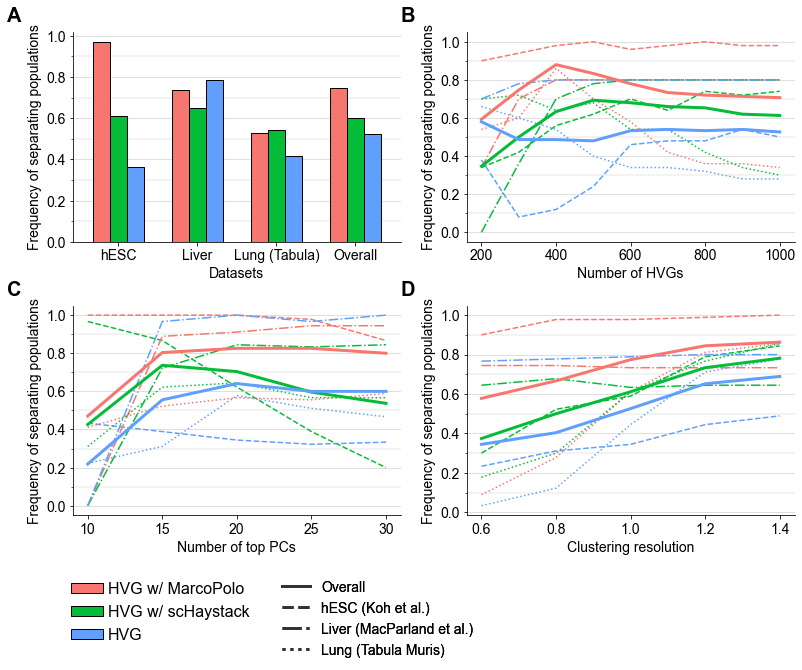

In [132]:
plt.rcParams["font.size"] = 14
plt.rcParams["axes.prop_cycle"]=cycler('color',np.array(color_qual_3))


fig = plt.figure(figsize=(10+1+10,5+1+5+1+5+1+5+1+5))
gs=fig.add_gridspec(5+1+5+1+5+1+5+1+5,10+1+10)


col_len=6
row_len=4





fig_sub1=fig.add_subplot(gs[0:row_len,col_len*1+1:2*col_len+1])

plot_data=record_list_df_robust_rare


for dataset_name in ['Kohinbulk_filtered','HumanLiver_filtered','TabulaLung_filtered','all',]:
    if dataset_name=='all':
        plot_data_dataset=plot_data#[plot_data['dataset_name']==dataset_name]
        style='-'
        linewidth=3
    else:
        plot_data_dataset=plot_data[plot_data['dataset_name']==dataset_name]
        linewidth=1.5
        if dataset_name=='Kohinbulk_filtered':
            style='--'
        elif dataset_name=='HumanLiver_filtered':
            style='-.'            
        elif dataset_name=='TabulaLung_filtered':
            style=':'
        else:
            raise
                    
            
    
    for method in ['HVG w/ MarcoPolo','HVG w/ scHaystack','HVG']:
        #if me
        color_qual_3[0]


        plot_data_dataset_method=plot_data_dataset[plot_data_dataset['method']==method]
        plot_data_dataset_method_mean=plot_data_dataset_method.groupby('label_nfeatures').mean()
        fig_sub1.plot(plot_data_dataset_method_mean.index,
                      plot_data_dataset_method_mean['rare_distinguish_bool'],
                      linewidth=linewidth,
                      label=method,
                     linestyle=style,
                      zorder=10
                     )
    
    
    
print(plot_data_dataset_method_mean.index)    
fig_sub1.set_xticks(np.arange(200,1000+200,200))
    
fig_sub1.set_yticks(np.arange(0,1,0.1),minor=True)
fig_sub1.yaxis.grid(True,which='minor',linewidth=0.4,alpha=0.7,zorder=-10)

fig_sub1.set_yticks(np.arange(0,1,0.1),minor=True)
fig_sub1.yaxis.grid(True,which='major',linewidth=0.8,alpha=0.5,zorder=-10)

fig_sub1.spines['right'].set_visible(False)
fig_sub1.spines['top'].set_visible(False)        
    
fig_sub1.set_ylabel('Frequency of separating populations')
fig_sub1.set_xlabel('Number of HVGs')   
  



fig_sub2=fig.add_subplot(gs[1*row_len+1:2*row_len+1,col_len*0+0:1*col_len+0])

plot_data=record_list_df_robust_rare
plot_data_dataset=plot_data#[plot_data['dataset_name']=='TabulaLung_filtered']

for dataset_name in ['Kohinbulk_filtered','HumanLiver_filtered','TabulaLung_filtered','all',]:
    if dataset_name=='all':
        plot_data_dataset=plot_data#[plot_data['dataset_name']==dataset_name]
        style='-'
        linewidth=3
    else:
        plot_data_dataset=plot_data[plot_data['dataset_name']==dataset_name]
        linewidth=1.5
        if dataset_name=='Kohinbulk_filtered':
            style='--'
        elif dataset_name=='HumanLiver_filtered':
            style='-.'            
        elif dataset_name=='TabulaLung_filtered':
            style=':'
        else:
            raise


    for method in ['HVG w/ MarcoPolo','HVG w/ scHaystack','HVG']:
        #if me
        color_qual_3[0]


        plot_data_dataset_method=plot_data_dataset[plot_data_dataset['method']==method]
        plot_data_dataset_method_mean=plot_data_dataset_method.groupby('label_npcs').mean()
        fig_sub2.plot(plot_data_dataset_method_mean.index,
                      plot_data_dataset_method_mean['rare_distinguish_bool'],
                      linewidth=linewidth,
                      label=method,
                     linestyle=style)
    
fig_sub2.set_xticks(np.arange(10,30+5,5))
    
fig_sub2.set_yticks(np.arange(0,1,0.1),minor=True)
fig_sub2.yaxis.grid(True,which='minor',linewidth=0.4,alpha=0.7)

fig_sub2.set_yticks(np.arange(0,1,0.1),minor=True)
fig_sub2.yaxis.grid(True,which='major',linewidth=0.8,alpha=0.5)

fig_sub2.spines['right'].set_visible(False)
fig_sub2.spines['top'].set_visible(False)        
    
fig_sub2.set_ylabel('Frequency of separating populations')
fig_sub2.set_xlabel('Number of top PCs')   
    
#leg=fig_sub2.legend(loc='upper left',bbox_to_anchor=(0.1,-0.1),fontsize=16,ncol=3,columnspacing=1,handletextpad=0.3)






fig_sub3=fig.add_subplot(gs[1*row_len+1:2*row_len+1,col_len+1:2*col_len+1])

plot_data=record_list_df_robust_rare
plot_data_dataset=plot_data#[plot_data['dataset_name']=='TabulaLung_filtered']

for dataset_name in ['Kohinbulk_filtered','HumanLiver_filtered','TabulaLung_filtered','all',]:
    if dataset_name=='all':
        plot_data_dataset=plot_data#[plot_data['dataset_name']==dataset_name]
        style='-'
        linewidth=3
    else:
        plot_data_dataset=plot_data[plot_data['dataset_name']==dataset_name]
        linewidth=1.5
        if dataset_name=='Kohinbulk_filtered':
            style='--'
        elif dataset_name=='HumanLiver_filtered':
            style='-.'            
        elif dataset_name=='TabulaLung_filtered':
            style=':'
        else:
            raise~
            
    for method in ['HVG w/ MarcoPolo','HVG w/ scHaystack','HVG']:
        #if me
        color_qual_3[0]


        plot_data_dataset_method=plot_data_dataset[plot_data_dataset['method']==method]
        plot_data_dataset_method_mean=plot_data_dataset_method.groupby('label_resolution').mean()
        fig_sub3.plot(plot_data_dataset_method_mean.index,
                      plot_data_dataset_method_mean['rare_distinguish_bool'],
                      linewidth=linewidth,
                      label=dataset_name_mapper(dataset_name),
                     linestyle=style
                     )
    
fig_sub3.set_xticks(np.arange(0.6,1.4+0.2,0.2))
    
fig_sub3.set_yticks(np.arange(0,1,0.1),minor=True)
fig_sub3.yaxis.grid(True,which='minor',linewidth=0.4,alpha=0.7)

fig_sub3.set_yticks(np.arange(0,1,0.1),minor=True)
fig_sub3.yaxis.grid(True,which='major',linewidth=0.8,alpha=0.5)

fig_sub3.spines['right'].set_visible(False)
fig_sub3.spines['top'].set_visible(False)        
    
fig_sub3.set_ylabel('Frequency of separating populations')
fig_sub3.set_xlabel('Clustering resolution')   
    
#leg=fig_sub3.legend(loc='upper left',
#                    bbox_to_anchor=(0.1,-0.1),
#                    fontsize=14,ncol=3,columnspacing=1,handletextpad=0.3)


leg1,=fig_temp_sub1.plot(np.arange(1,len(haystack_recovery[:x_lim])+1),
                         100*haystack_recovery[:x_lim]/marker_matrix_MarcoPolo.shape[1],
                linestyle='-',
              c=(0.2,0.2,0.2,1),
              label='Overall',
              linewidth=3.0
             )    
leg2,=fig_temp_sub1.plot(np.arange(1,len(haystack_recovery[:x_lim])+1),100*haystack_recovery[:x_lim]/marker_matrix_MarcoPolo.shape[1],
              linestyle='--',
              c=(0.2,0.2,0.2,1),
              label='hESC (Koh et al.)',
              linewidth=3.0
             )    
leg3,=fig_temp_sub1.plot(np.arange(1,len(haystack_recovery[:x_lim])+1),100*haystack_recovery[:x_lim]/marker_matrix_MarcoPolo.shape[1],
              linestyle='-.',
              c=(0.2,0.2,0.2,1),
              label='Liver (MacParland et al.)',
              linewidth=3.0
             )  
leg4,=fig_temp_sub1.plot(np.arange(1,len(haystack_recovery[:x_lim])+1),100*haystack_recovery[:x_lim]/marker_matrix_MarcoPolo.shape[1],
              linestyle=':',
              c=(0.2,0.2,0.2,1),
              label='Lung (Tabula Muris)',
              linewidth=3.0
             )  

first_legend=plt.legend(handles=[leg1,leg2,leg3,leg4],labels=['Overall',
                                                              'hESC (Koh et al.)',
                                                              'Liver (MacParland et al.)',
                                                              'Lung (Tabula Muris)'],
                        loc='upper left',
                       #bbox_to_anchor=(0.65, -0.2),
                        bbox_to_anchor=(-0.6, -0.25),
                        markerscale=2.5
                       )

fig_sub3.add_artist(first_legend)


fig_sub4=fig.add_subplot(gs[0*row_len+0:1*row_len+0,col_len*0+0:1*col_len+0])

ari_cut_all_df=record_list_df_robust_rare.groupby(['dataset_name','mix']).mean().unstack()['rare_distinguish_bool']
ari_cut_all_df=ari_cut_all_df.loc[['Kohinbulk_filtered','HumanLiver_filtered','TabulaLung_filtered']]


ari_cut_all_df.index=ari_cut_all_df.index.map(lambda x : dataset_name_mapper(x,'short'))
ari_cut_all_df=ari_cut_all_df.rename(columns={
                                'MarcoPolo':'HVG w/ MarcoPolo',
                               'ht':'HVG w/ scHaystack',
                               'None':'HVG'})
ari_cut_all_df=ari_cut_all_df[['HVG w/ MarcoPolo','HVG w/ scHaystack','HVG']]
ari_cut_all_df.loc['Overall']=ari_cut_all_df.mean(axis=0)


#fig = plt.figure(figsize=(7,6)) 
#fig_sub1=fig.add_subplot()
(ari_cut_all_df.iloc[:,::]).plot.bar(width=0.65,rot=0,linewidth=1,edgecolor=(0,0,0,1),ax=fig_sub4)
#fig_sub1.yaxis.grid(True,linewidth=0.3,alpha=0.8)
#leg=fig_sub1.legend(loc='upper left',bbox_to_anchor=(0,-0.1),fontsize=16)
fig_sub4.set_ylabel('Frequency of separating populations')
fig_sub4.set_xlabel('Datasets')

fig_sub4.set_yticks(np.arange(0,1,0.1),minor=True)
fig_sub4.yaxis.grid(True,which='minor',linewidth=0.4,alpha=0.7)

fig_sub4.set_yticks(np.arange(0,1,0.1),minor=True)
fig_sub4.yaxis.grid(True,which='major',linewidth=0.8,alpha=0.5)

fig_sub4.spines['right'].set_visible(False)
fig_sub4.spines['top'].set_visible(False)    

#leg=fig_sub4.legend(loc='upper left',bbox_to_anchor=(-0.1,-0.2),fontsize=16,ncol=3,columnspacing=1,handletextpad=0.3)
leg=fig_sub4.legend(loc='upper left',bbox_to_anchor=(-0.05,-1.55),fontsize=16,ncol=1,columnspacing=1,handletextpad=0.3)


fig_sub4.set_axisbelow(True)

"""
#leg=fig_sub1.legend(loc='upper left',bbox_to_anchor=(0.1,-0.1),fontsize=16,ncol=3,columnspacing=1,handletextpad=0.3)
for k, spine in fig_sub1.spines.items():  #ax.spines is a dictionary
    spine.set_zorder(-10)
fig_sub1.set_axisbelow(True)
#ax.tick_params(direction='in', length=10, color='k', zorder=10)
for l in ax.yaxis.get_ticklines():
    l.set_zorder(-10)
"""  



for idx, ax in enumerate([fig_sub4,fig_sub1,fig_sub2,fig_sub3]):
    ax.text(-0.2, 1.05, 'abcd'[idx].upper(), fontproperties=font_prop(bold=True,size=20), transform=ax.transAxes)

[rec.set_height(10) for rec in leg.get_patches()]


#fig_temp1=fig.add_subplot(gs[0:1,0:1])
#fig_temp=plt.figure(figsize=(18, 7))
#fig_temp_sub1=fig_temp.add_subplot()    



In [133]:
fig.savefig('pub/robustness.png', bbox_inches='tight')
fig.savefig('pub/robustness.jpg', bbox_inches='tight')
fig.savefig('pub/robustness.svg', bbox_inches='tight')

# tsne

/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/seaborn/_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/seaborn/_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
/home/ch6845/tools/miniconda3/envs/MarcoPolo/lib/python3.7/site-packages/seaborn/_core.py:163: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


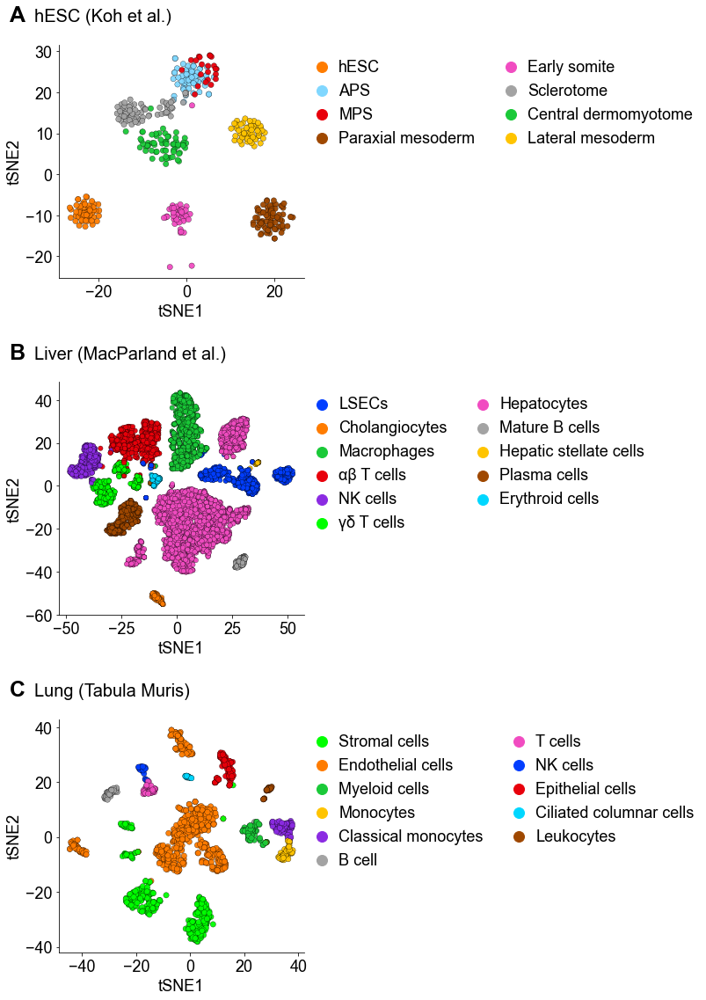

In [148]:
fig = plt.figure(figsize=(5,5*3+3*2))
gs=fig.add_gridspec(5*3+3*2,5)

plt.rcParams["font.size"] = 18
    

fig_sub1=fig.add_subplot(gs[0:5,0:5])

palette = np.array(sns.color_palette("bright"))#,len(plot_value_unique)+2))#[2::])
palette[9][0]=0.5
palette=palette[[1,9,3,5,6,7,2,8]] 

exp_data_meta_transformed=exp_data_meta_dict['Kohinbulk_filtered']

plot_value=exp_data_meta_transformed['phenoid']
plot_value_unique=plot_value.unique().tolist()
plot_value_int=list(map(lambda x: plot_value_unique.index(x),plot_value))     


sns.scatterplot(x="TSNE_1", y="TSNE_2",hue=list(map(lambda x: celltype_mapper(x,True),plot_value.values)),
                data=exp_data_meta_transformed,
                palette=palette,
                ax=fig_sub1,alpha=0.95,edgecolor="black",linewidth=0.3,
                s=40
               )



fig_sub1.set_xlabel('tSNE1')
fig_sub1.set_ylabel('tSNE2')
fig_sub1.text(-0.2, 1.1, 'A ',
              fontproperties=font_prop(bold=True,size=25),
              transform=fig_sub1.transAxes)
fig_sub1.text(-0.1, 1.1, '{}'.format(dataset_name_mapper('Kohinbulk_filtered','full')),
              fontproperties=font_prop(bold=False,size=20),
              transform=fig_sub1.transAxes)
fig_sub1.spines['right'].set_visible(False)
fig_sub1.spines['top'].set_visible(False)

#fig_sub.set_xticks([])
#fig_sub.set_yticks([])

leg=fig_sub1.legend(loc='upper left',
            bbox_to_anchor=(1,1.),
            ncol=2,
            handlelength=0.5,
            markerscale=2) 










fig_sub1=fig.add_subplot(gs[10+4:15+4,0:5])
exp_data_meta_transformed=exp_data_meta_dict['TabulaLung_filtered']

plot_value=exp_data_meta_transformed['phenoid']
plot_value_unique=plot_value.unique().tolist()
plot_value_int=list(map(lambda x: plot_value_unique.index(x),plot_value))     


#palette = np.array(sns.color_palette("bright",len(plot_value_unique)))#,len(plot_value_unique)+2))#[2::])
palette = np.array(sns.color_palette("bright",len(plot_value_unique)))#,len(plot_value_unique)+2))#[2::])
palette[-2][:]=[0,1,0]
palette=palette[[10,1,2,8,4,7,6,0,3,9,5,11]] 
#palette[9][0]=0.5


sns.scatterplot(x="TSNE_1", y="TSNE_2",hue=list(map(lambda x: celltype_mapper(x,True),plot_value.values)),
                data=exp_data_meta_transformed,
                palette=palette,
                ax=fig_sub1,alpha=0.95,edgecolor="black",linewidth=0.3,
                s=40
               )



fig_sub1.set_xlabel('tSNE1')
fig_sub1.set_ylabel('tSNE2')
fig_sub1.text(-0.2, 1.1, 'C ',
              fontproperties=font_prop(bold=True,size=25),
              transform=fig_sub1.transAxes)
fig_sub1.text(-0.1, 1.1, '{}'.format(dataset_name_mapper('TabulaLung_filtered','full')),
              fontproperties=font_prop(bold=False,size=20),
              transform=fig_sub1.transAxes)
fig_sub1.spines['right'].set_visible(False)
fig_sub1.spines['top'].set_visible(False)

#fig_sub.set_xticks([])
#fig_sub.set_yticks([])

leg=fig_sub1.legend(loc='upper left',
            bbox_to_anchor=(1,1.),
            ncol=2,
            handlelength=0.5,
            markerscale=2) 








fig_sub1=fig.add_subplot(gs[5+2:10+2,0:5])

exp_data_meta_transformed=exp_data_meta_dict['HumanLiver_filtered']

plot_value=exp_data_meta_transformed['phenoid']
plot_value_unique=plot_value.unique().tolist()
plot_value_int=list(map(lambda x: plot_value_unique.index(x),plot_value))     

palette = np.array(sns.color_palette("bright",len(plot_value_unique)))#,len(plot_value_unique)+2))#[2::])
palette[-1]=[0,1,0]
palette=palette[[0,1,2,3,4,10,6,7,8,5,9]] 
#palette[9][0]=0.5
#palette=palette[[1,9,3,5,6,7,2,8]] 
#palette=DiscretePalette(len(plot_value_unique))
#palette=DiscretePalette(11)
#palette = np.array(sns.color_palette("hsv",len(plot_value_unique)))#,+2))#[2::])

sns.scatterplot(x="TSNE_1", y="TSNE_2",hue=list(map(lambda x: celltype_mapper(x,True),plot_value.values)),
                data=exp_data_meta_transformed,
                palette=palette,
                ax=fig_sub1,alpha=0.95,edgecolor="black",linewidth=0.3,
                s=30
               )



fig_sub1.set_xlabel('tSNE1')
fig_sub1.set_ylabel('tSNE2')
fig_sub1.text(-0.2, 1.1, 'B ',
              fontproperties=font_prop(bold=True,size=25),
              transform=fig_sub1.transAxes)
fig_sub1.text(-0.1, 1.1, '{}'.format(dataset_name_mapper('HumanLiver_filtered','full')),
              fontproperties=font_prop(bold=False,size=20),
              transform=fig_sub1.transAxes)
fig_sub1.spines['right'].set_visible(False)
fig_sub1.spines['top'].set_visible(False)
#fig_sub.set_xticks([])
#fig_sub.set_yticks([])

leg=fig_sub1.legend(loc='upper left',
            bbox_to_anchor=(1,1.),
            ncol=2,
            handlelength=0.5,
            markerscale=2) 


In [149]:
fig.savefig('pub/tsne_meta.png', bbox_inches='tight')
fig.savefig('pub/tsne_meta.jpg', bbox_inches='tight')
fig.savefig('pub/tsne_meta.svg', bbox_inches='tight')

In [ ]:
fig = plt.figure(figsize=((7+1)*4,(5+2)*6)) 
gs=fig.add_gridspec((5+2)*6,(7+1)*4)
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_7_3)

record_list=[]#pd.DataFrame(columns=[1],index=['1e-2','5e-3','1e-3','5e-4','1e-4'])
for idx,dataset_name in enumerate(dataset_name_all[:]):
    plt.figure()
    print(dataset_name)

    with open('datasets/extract/{}.data.row'.format(dataset_name),'r') as f: exp_data_row=[i.strip().strip('"') for i in f.read().split()]
    with open('datasets/extract/{}.data.col'.format(dataset_name),'r') as f: exp_data_col=[i.strip().strip('"') for i in f.read().split()]
    exp_data_meta=pd.read_csv('datasets/extract/{}.metadatacol.tsv'.format(dataset_name),sep='\t')


    marker=load_marker(dataset_name,method='truelabel_maxdiff',num_genes=500,lfc=2)          
    """
    elif dataset_name=='Zhengmix4eq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])
    elif dataset_name=='Zhengmix4uneq_filtered':        
        marker=load_marker(dataset_name,method='truelabel_maxdiff',type_list=['regulatory.t','naive.cytotoxic'])        
    """            

    DE_bool=list(map(lambda x: x in marker, exp_data_row))

    fig_rocplot=fig.add_subplot(gs[7*(idx//4):7*(idx//4)+5,8*(idx%4):8*(idx%4)+7])
    #fig=plt.figure()
    #fig_rocplot=fig.add_subplot()
    fig_rocplot.text(-0.1, 1.05, 'abcdefghijklmnopqrstuvwxyz'[idx], fontproperties=font_prop(bold=True,size=25), transform=fig_rocplot.transAxes)
    
    fig_rocplot.set_xlabel('False positive rate')
    fig_rocplot.set_ylabel('True positive rate')
    
    fig_rocplot.plot(np.arange(0,1,0.01),np.arange(0,1,0.01),c=(0.8,0.8,0.8,0.8),linewidth=1.0,linestyle='--')
    
    #fig_rocplot.set_title(
    #    '{} # cells: {}'.format(dataset_name_mapper(dataset_name),len(exp_data_col)))
    fig_rocplot.set_title(
        '{}'.format(dataset_name_mapper(dataset_name)))    
    for method in ['MarcoPolo','vst','disp','ht.pca',
                   'seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter',
                   'seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter'
                   ]:
        print(method)
        score=load_score(dataset_name,method)
        auc=roc_auc_score(DE_bool,score)

        fpr, tpr, thresholds = metrics.roc_curve(DE_bool,score)
        fpr_all, tpr_all, thresholds_all = metrics.roc_curve(DE_bool,score,drop_intermediate=False)
        

        fig_rocplot.plot(fpr,
                         tpr,
                         label='{method:} AUC={AUC:.3f}'.format(
                                                                method=method_mapper(method)+',',
                                                                AUC=auc),
                         linewidth=3.0,
                         zorder=-(['MarcoPolo','vst','disp','ht.pca','seurat,0_5,without_filter','seurat,1_0,without_filter','seurat,1_5,without_filter','seurat,0_5,with_filter','seurat,1_0,with_filter','seurat,1_5,with_filter'].index(method))
                        )
        
        
        #title()
        score_thres=sorted(score)[::-1][100]
        
        metric=get_metric(DE_bool,score>score_thres)
        
        #exp_data_row_confidencecheck=top_n_confidence(dataset_name,exp_data_row,6) 
        score_check=pd.DataFrame([score,exp_data_row_confidencecheck]).T.sort_values(by=0,ascending=False)
        
        record_list.append({
            'Dataset':dataset_name_mapper(dataset_name),
            'num_marker':np.sum(DE_bool),
            'num_cell':len(exp_data_col),
            'num_gene':len(exp_data_row),
            'num_type':len(exp_data_meta['phenoid'].unique()),
            'min_pop_size':exp_data_meta['phenoid'].value_counts().values[-1],
            'cv':exp_data_meta['phenoid'].value_counts().std()/exp_data_meta['phenoid'].value_counts().mean(),
            'Method':method_mapper(method),
            'AUC':auc,
            'Precision':metric['precision'],
            'Recall (FPR)':tpr_all[fpr_all>0.2][0],
            'Recall':metric['recall'],
            'F-score':metric['F1'],
          
            
        })   
        
    """
            'confidence_50':score_check[1].iloc[:50].sum()/score_check[1].sum(),
            'confidence_100':score_check[1].iloc[:100].sum()/score_check[1].sum(),
            'confidence_200':score_check[1].iloc[:200].sum()/score_check[1].sum(),
            'confidence_300':score_check[1].iloc[:300].sum()/score_check[1].sum(),
            'confidence_400':score_check[1].iloc[:400].sum()/score_check[1].sum(),
            'confidence_500':score_check[1].iloc[:500].sum()/score_check[1].sum(),
            'confidence_600':score_check[1].iloc[:600].sum()/score_check[1].sum(),
            'confidence_700':score_check[1].iloc[:700].sum()/score_check[1].sum(),
            'confidence_800':score_check[1].iloc[:800].sum()/score_check[1].sum(),
            'confidence_900':score_check[1].iloc[:900].sum()/score_check[1].sum(),
            'confidence_1000':score_check[1].iloc[:1000].sum()/score_check[1].sum(),  
    
    
    """
        
    leg=fig_rocplot.legend(loc='lower right',fontsize=15)

        
    fig_rocplot.spines['right'].set_visible(False)
    fig_rocplot.spines['top'].set_visible(False)

    

In [29]:
len(cellmarker_db),len(cellmarker_db_human),len(cellmarker_db_mouse)

(4123, 2868, 1255)

In [126]:
cellmarker_db['geneSymbol_cleaned'].map(lambda x: [i for i in x])

0                                                  [ALPI]
1                                                   [SYP]
2                                               [CEACAM1]
3                                                  [DDX4]
4                                                  [KLF6]
                              ...                        
4118    [LBHD1, C19orf53, DHX9, DIABLO, EIF1AD, EIF4G1...
4119    [Abcf1, Cdc37, Diablo, Eif1ad, Eif4g1, Fam32a,...
4120    [ADCK1, AGL, AIMP1, AKAP12, ARPC3, ATP1B3, NA,...
4121    [Aimp1, Atp5f1, Atp5h, Bcat1, Bin1, Kyat3, Cct...
4122    [ASCL1, BOC, CCND2, CD24, CHD7, EGFR, NFIB, SO...
Name: geneSymbol_cleaned, Length: 4123, dtype: object

In [82]:
gene_info_mouse['ensembl']=gene_info_mouse['dbXrefs'].map(lambda x: x.split('|')[-1].split(':')[-1])

,confidence_50,confidence_100,confidence_200,confidence_300,confidence_400,confidence_500,confidence_600,confidence_700,confidence_800,confidence_900,confidence_1000
Method,,,,,,,,,,,
"Clustering+DE (0.5, default)",0.042802,0.080247,0.167513,0.240000,0.299652,0.365759,0.435540,0.480287,0.524000,0.572000,0.596000
"Clustering+DE (0.5, no filter)",0.042802,0.080247,0.167513,0.240000,0.287402,0.333333,0.412186,0.478599,0.519713,0.564000,0.596000
"Clustering+DE (1.0, default)",0.031963,0.081712,0.161290,0.224000,0.307087,0.354839,0.422939,0.480315,0.519685,0.560694,0.590909
"Clustering+DE (1.0, no filter)",0.031963,0.081712,0.161290,0.224000,0.282230,0.348000,0.400000,0.446429,0.496000,0.550523,0.588000
"Clustering+DE (1.5, default)",0.034884,0.083333,0.158568,0.222222,0.295276,0.356000,0.413580,0.466899,0.530864,0.572254,0.589595
"Clustering+DE (1.5, no filter)",0.034884,0.083333,0.158568,0.222222,0.295276,0.351916,0.407407,0.464567,0.512346,0.554913,0.583815
HVG (DISP),0.059524,0.119048,0.222222,0.311284,0.378995,0.420732,0.474576,0.519774,0.559322,0.581921,0.593220
HVG (VST),0.057554,0.096000,0.172662,0.222222,0.275862,0.317073,0.346821,0.372881,0.390351,0.412429,0.451977
MarcoPolo,0.050228,0.095679,0.163424,0.219298,0.279070,0.333333,0.374101,0.415525,0.442446,0.479452,0.512545


In [157]:
record_list_df_real

,Dataset,num_marker,num_cell,num_gene,num_type,min_pop_size,cv,Method,AUC,Precision,...,confidence_100,confidence_200,confidence_300,confidence_400,confidence_500,confidence_600,confidence_700,confidence_800,confidence_900,confidence_1000
0,hESC (Koh et al.),500,446,14694,8,22,0.299496,MarcoPolo,0.825914,0.45,...,0.026442,0.040865,0.060096,0.084135,0.088942,0.115385,0.127404,0.151442,0.163462,0.168269
1,hESC (Koh et al.),500,446,14694,8,22,0.299496,HVG (VST),0.728998,0.27,...,0.012019,0.031250,0.045673,0.052885,0.074519,0.079327,0.081731,0.086538,0.091346,0.100962
2,hESC (Koh et al.),500,446,14694,8,22,0.299496,HVG (DISP),0.595493,0.18,...,0.014423,0.028846,0.033654,0.052885,0.062500,0.079327,0.093750,0.098558,0.110577,0.120192
3,hESC (Koh et al.),500,446,14694,8,22,0.299496,scHaystack,0.683289,0.45,...,0.028846,0.064904,0.093750,0.132212,0.151442,0.177885,0.182692,0.197115,0.213942,0.228365
4,hESC (Koh et al.),500,446,14694,8,22,0.299496,"Clustering+DE (0.5, default)",0.628295,0.58,...,0.024038,0.069712,0.105769,0.144231,0.170673,0.197115,0.230769,0.254808,0.269231,0.283654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (1.0, default)",0.879747,0.78,...,0.064516,0.161290,0.204301,0.268817,0.354839,0.422939,0.501792,0.537634,0.605735,0.648746
226,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (1.5, default)",0.883881,0.75,...,0.078853,0.143369,0.200717,0.268817,0.365591,0.422939,0.494624,0.551971,0.616487,0.641577
227,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (0.5, no filter)",0.908026,0.80,...,0.068100,0.157706,0.207885,0.261649,0.333333,0.412186,0.483871,0.519713,0.591398,0.620072
228,Trachea (Tabula Muris),500,1350,7002,4,113,0.981036,"Clustering+DE (1.0, no filter)",0.899457,0.78,...,0.064516,0.161290,0.204301,0.268817,0.354839,0.422939,0.501792,0.537634,0.605735,0.648746


ValueError: Could not interpret input 'ncells_total'

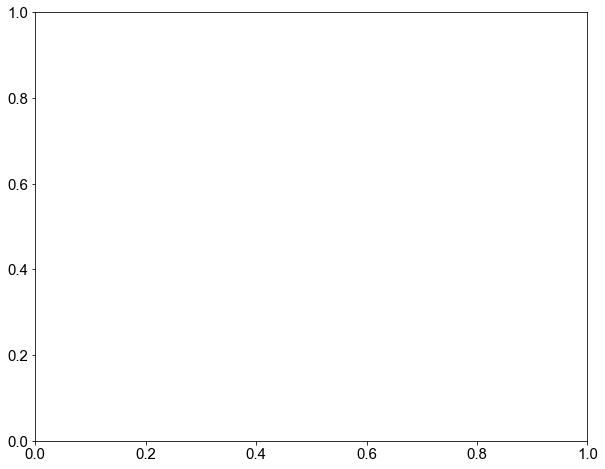

In [156]:
plt.rcParams["axes.prop_cycle"]=cycler('color',color_qual_3)
plt.rcParams["font.size"] = 15
#record_list_df_simul
fig = plt.figure(figsize=(25, 25)) 
gs=fig.add_gridspec(25,25)


fig_sub1=fig.add_subplot(gs[0:8,0:10])


sns.boxplot(x='',y='Adjusted Rand Index',
            hue='Methods',
            data=a,
            width=0.7,
            saturation=0.9,
            ax=fig_sub1
           )
fig_sub1.yaxis.grid(True,linewidth=0.4,alpha=0.6)
#leg=fig_sub1.legend()
fig_sub1.get_legend()._legend_box.align = "left"
#plt.legend()



In [90]:
'ACTB' in gene_info_mouse['Symbol'].tolist()

True

In [86]:
gene_info_mouse['Symbol']

0            A1BG
1             A2M
2           A2MP1
3            NAT1
4            NAT2
           ...   
62193        trnD
62194        trnP
62195        trnA
62196        COX1
62197    16S rRNA
Name: Symbol, Length: 62198, dtype: object

In [ ]:
gene_info_human=b
gene_info_mouse=

In [52]:
cellmarker_db_geneall=[j for i in cellmarker_db['geneSymbol_cleaned'] for j in i]

In [64]:
a=set(list(map(lambda x: x.lower(),exp_data_row_dict['TabulaTrachea_filtered'])))

In [111]:
b=set(list(map(lambda x: x.lower(),cellmarker_db_geneall)))

In [39]:
#cellmarker_db

In [70]:
len(b)

14080

In [68]:
len(a.intersection(b))

5708

In [16]:
cellmarker_db=pd.read_csv('datasets/all_cell_markers.txt',sep='\t')

In [38]:
"""
cellmarker_db[(cellmarker_db['speciesType']=='Human')&
              (cellmarker_db['tissueType']=='Kidney')&
             (cellmarker_db['cancerType']=='Normal')]
"""             

"\ncellmarker_db[(cellmarker_db['speciesType']=='Human')&\n              (cellmarker_db['tissueType']=='Kidney')&\n             (cellmarker_db['cancerType']=='Normal')]\n"